# Colleges in India

### Importing required libraries

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import warnings 
warnings.filterwarnings('ignore')

### Loading data set

In [2]:
data = pd.read_csv('./College_data.csv')
data.head()

,College_Name,State,Stream,UG_fee,PG_fee,Rating,Academic,Accommodation,Faculty,Infrastructure,Placement,Social_Life
0,Indian Institute of Technology Madras,Tamil nadu,Engineering,"75,116","23,070",8.7,9,7.9,8.7,8.8,8.8,9
1,"College of Engineering, Anna University",Tamil nadu,Engineering,"50,000","50,000",8.4,8.7,7.7,8.1,8.7,8.3,8.7
2,"NIT Trichy, Tiruchirappalli",Tamil nadu,Engineering,"1,49,250","99,250",8.5,8.6,7.8,8.2,8.7,8.8,8.7
3,Vellore Institute of Technology,Tamil nadu,Engineering,"1,98,000","1,83,000",8.3,8.3,8,7.8,8.9,8.5,8.5
4,"SRM Engineering College, Kanchipuram",Tamil nadu,Engineering,"2,60,000","1,70,000",7.2,6.5,6.6,6.9,7.6,7.1,8.3


In [3]:
data.shape

(6788, 12)

In [4]:
data.size

81456

In [5]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6788 entries, 0 to 6787
Data columns (total 12 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   College_Name    6788 non-null   object
 1   State           6788 non-null   object
 2   Stream          6788 non-null   object
 3   UG_fee          6788 non-null   object
 4   PG_fee          6788 non-null   object
 5   Rating          6788 non-null   object
 6   Academic        6788 non-null   object
 7   Accommodation   6788 non-null   object
 8   Faculty         6788 non-null   object
 9   Infrastructure  6788 non-null   object
 10  Placement       6788 non-null   object
 11  Social_Life     6788 non-null   object
dtypes: object(12)
memory usage: 636.5+ KB


In [6]:
data.describe().T

,count,unique,top,freq
College_Name,6788,3120,National Institute of Technology,64
State,6788,35,Maharashtra,298
Stream,6788,10,Arts,837
UG_fee,6788,2367,--,1170
PG_fee,6788,1572,--,3311
Rating,6788,66,--,732
Academic,6788,54,--,846
Accommodation,6788,72,--,889
Faculty,6788,54,--,907
Infrastructure,6788,64,--,916


In [7]:
data.isnull().sum()

College_Name      0
State             0
Stream            0
UG_fee            0
PG_fee            0
Rating            0
Academic          0
Accommodation     0
Faculty           0
Infrastructure    0
Placement         0
Social_Life       0
dtype: int64

In [8]:
data.duplicated().sum()

0

In [9]:
data.columns

Index(['College_Name', 'State', 'Stream', 'UG_fee', 'PG_fee', 'Rating',
       'Academic', 'Accommodation', 'Faculty', 'Infrastructure', 'Placement',
       'Social_Life'],
      dtype='object')

### Sorting by State name

In [10]:
data.sort_values(by='State',ascending=True,inplace=True)
data.reset_index(drop=True,inplace=True)
data

,College_Name,State,Stream,UG_fee,PG_fee,Rating,Academic,Accommodation,Faculty,Infrastructure,Placement,Social_Life
0,"Dr. B R Ambedkar Institute of Technology, Port...",Andaman,Management,"4,780",--,--,--,--,--,--,--,--
1,"Dr. B R Ambedkar Institute of Technology, Port...",Andaman,Engineering,"12,083","4,780",--,--,--,--,--,--,--
2,Jawaharlal Nehru Rajkeeya Mahavidyalaya,Andaman,Management,843,--,6.6,8.5,5,7,7.5,2.5,9
3,"Dr. B R Ambedkar Institute of Technology, Port...",Andaman,Science,"29,964",--,--,--,--,--,--,--,--
4,Jawaharlal Nehru Rajkeeya Mahavidyalaya,Andaman,Science,939,"1,128",6.6,8.5,5,7,7.5,2.5,9
...,...,...,...,...,...,...,...,...,...,...,...,...
6783,Management Development Institute,West bengal,Management,"4,41,000",--,8.4,8.3,8.7,8.4,8.2,7.9,8.6
6784,"Praxis Business School, Kolkata",West bengal,Management,"3,89,000",--,8.6,9.3,8,9,8.3,8.7,8
6785,The Neotia University,West bengal,Management,"98,000","1,06,000",8.2,8.7,7.5,8.5,8.2,7.8,8.6
6786,Institute of Management Study,West bengal,Management,"55,000","2,60,000",7.3,7.8,6.4,7.7,7.6,7.3,6.8


### Changing null values to NAN

In [11]:
data.apply(data.value_counts).loc['--'].sum()

10615.0

In [12]:
data.replace('--', np.nan, inplace=True)

### Changing   to float

In [13]:
data['UG_fee'] = data['UG_fee'].str.replace(',', '')
data['PG_fee'] = data['PG_fee'].str.replace(',', '')

In [14]:
data['UG_fee'] = data['UG_fee'].astype(float)
data['PG_fee'] = data['PG_fee'].astype(float)

In [15]:
data['UG_fee'] = data['UG_fee'].astype(float)
data['Infrastructure'] = data['Infrastructure'].astype(float)
data['Rating'] = data['Rating'].astype(float)
data['Academic'] = data['Academic'].astype(float)
data['Accommodation'] = data['Accommodation'].astype(float)
data['Faculty'] = data['Faculty'].astype(float)
data['Placement'] = data['Placement'].astype(float)
data['Social_Life'] = data['Social_Life'].astype(float)

In [16]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6788 entries, 0 to 6787
Data columns (total 12 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   College_Name    6788 non-null   object 
 1   State           6788 non-null   object 
 2   Stream          6788 non-null   object 
 3   UG_fee          5618 non-null   float64
 4   PG_fee          3477 non-null   float64
 5   Rating          6056 non-null   float64
 6   Academic        5942 non-null   float64
 7   Accommodation   5899 non-null   float64
 8   Faculty         5881 non-null   float64
 9   Infrastructure  5872 non-null   float64
 10  Placement       5898 non-null   float64
 11  Social_Life     5834 non-null   float64
dtypes: float64(9), object(3)
memory usage: 636.5+ KB


### Adding Average column

In [17]:
data['Average'] = (data['Academic']+data['Accommodation']+data['Faculty']+data['Infrastructure']+data['Placement']+data['Social_Life'])/6

In [18]:
data.head()

,College_Name,State,Stream,UG_fee,PG_fee,Rating,Academic,Accommodation,Faculty,Infrastructure,Placement,Social_Life,Average
0,"Dr. B R Ambedkar Institute of Technology, Port...",Andaman,Management,4780.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,"Dr. B R Ambedkar Institute of Technology, Port...",Andaman,Engineering,12083.0,4780.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Jawaharlal Nehru Rajkeeya Mahavidyalaya,Andaman,Management,843.0,NaN,6.6,8.5,5.0,7.0,7.5,2.5,9.0,6.583333
3,"Dr. B R Ambedkar Institute of Technology, Port...",Andaman,Science,29964.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Jawaharlal Nehru Rajkeeya Mahavidyalaya,Andaman,Science,939.0,1128.0,6.6,8.5,5.0,7.0,7.5,2.5,9.0,6.583333


### Heat map

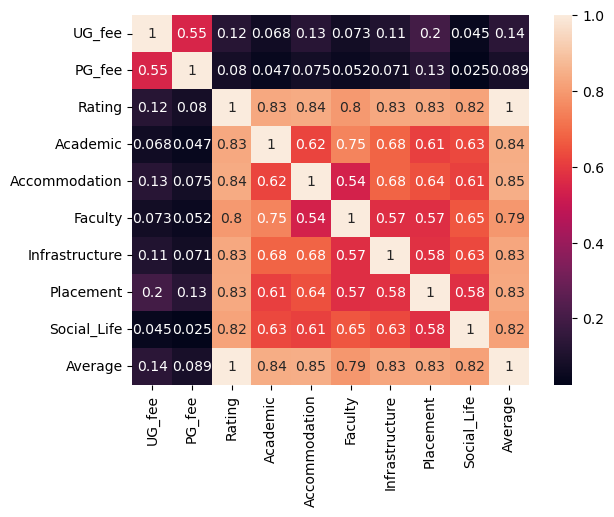

In [19]:
sns.heatmap(data.corr(), annot=True)
plt.show()


### College count by States

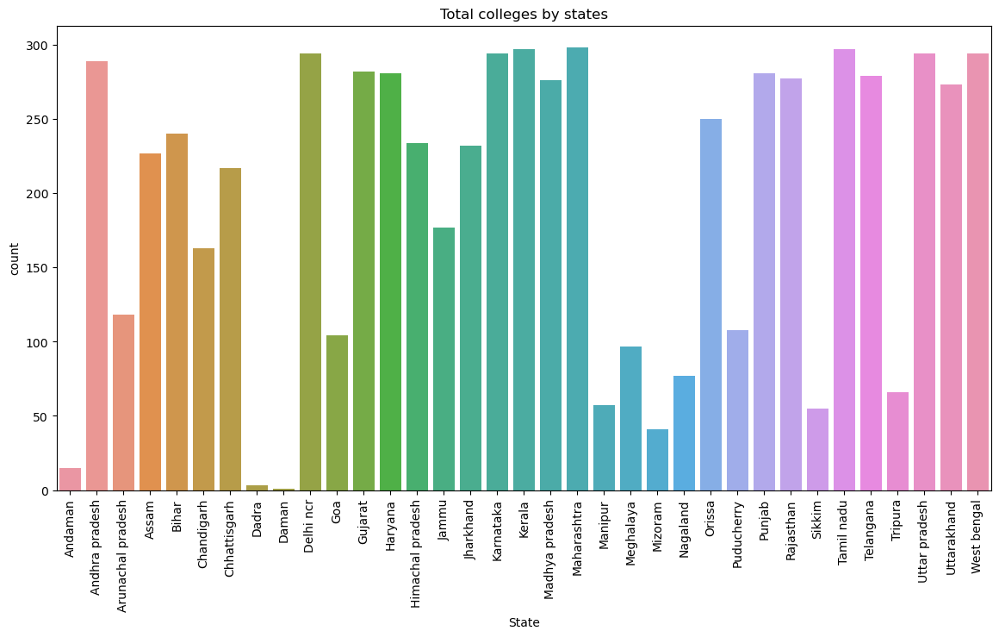

In [20]:
plt.figure(figsize=(14,7))
sns.countplot(data=data,x='State')
plt.xticks(rotation=90)
plt.title("Total colleges by states")
plt.show()

#### Mizoram has less than 50 colleges

### Streams

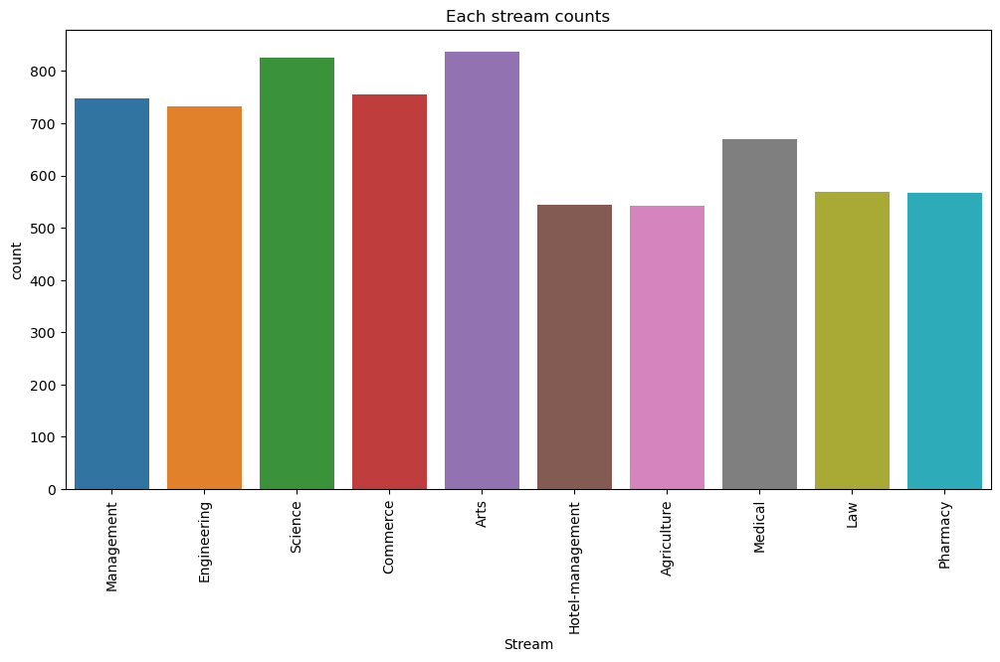

In [21]:
plt.figure(figsize=(12,6))
sns.countplot(data=data,x='Stream')
plt.title("Each stream counts")
plt.xticks(rotation=90)
plt.show()

#### In India Arts and Science colleges are high in number

### HIghest UG fee Colleges

In [22]:
high_UG_fee = data.sort_values(by='UG_fee',ascending=False)
high_UG_fee.nlargest(25,columns='UG_fee')

,College_Name,State,Stream,UG_fee,PG_fee,Rating,Academic,Accommodation,Faculty,Infrastructure,Placement,Social_Life,Average
5791,Chalmeda Anand Rao Institute of Medical Sciences,Telangana,Medical,5000000.0,7200000.0,6.8,7.8,6.5,7.0,7.0,6.6,5.8,6.783333
1928,Indian Institute of Management,Gujarat,Management,2800000.0,1000000.0,9.0,8.9,8.9,9.1,9.0,9.2,8.6,8.950000
6767,Indian Institute of Management,West bengal,Management,2700000.0,268000.0,8.9,8.9,8.8,9.0,8.8,9.1,8.5,8.850000
868,"Katihar Medical College, Katihar",Bihar,Medical,2650000.0,1150000.0,8.6,8.7,8.7,8.7,8.4,8.5,8.4,8.566667
56,"GSL Medical College and General Hospital, Raja...",Andhra pradesh,Medical,2420000.0,2420000.0,7.9,8.1,6.8,8.0,8.2,8.2,8.3,7.933333
5766,Kaloji Narayana Rao University of Health Scien...,Telangana,Medical,2420000.0,225000.0,8.3,8.8,8.0,8.4,8.7,8.0,8.1,8.333333
2183,Management Development Institute,Haryana,Management,2358000.0,319668.0,9.0,8.8,8.9,9.0,9.1,9.2,8.8,8.966667
1434,Management Development Institute,Delhi ncr,Management,2358000.0,319668.0,9.0,8.8,8.9,9.0,9.1,9.2,8.8,8.966667
2955,Indian Institute of Management,Karnataka,Management,2300000.0,2750000.0,9.1,9.0,9.0,9.1,9.2,9.2,8.9,9.066667
3400,Indian Institute of Management,Kerala,Management,2250000.0,45000.0,8.9,8.9,8.9,9.1,9.1,9.1,8.3,8.900000


### Top 25 highest UG_Fee Courses and states

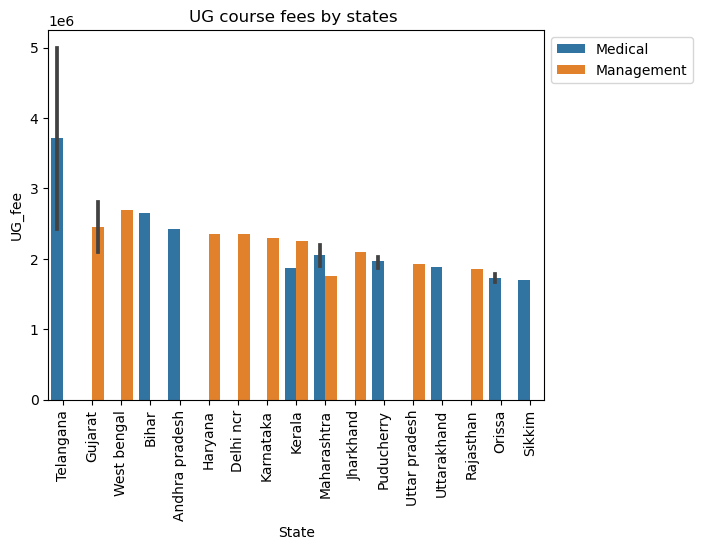

In [23]:
sns.barplot(data=(high_UG_fee.nlargest(25,columns='UG_fee')),x='State',y='UG_fee',hue='Stream')
plt.xticks(rotation=90)
plt.title("UG course fees by states ")
plt.legend(bbox_to_anchor=(1,1))
plt.show()

#### Medical and Management fees are high

### High PG Fee courses

In [24]:
high_PG_fee = data.sort_values(by='PG_fee',ascending=False)
high_PG_fee.nlargest(25,columns='PG_fee')

,College_Name,State,Stream,UG_fee,PG_fee,Rating,Academic,Accommodation,Faculty,Infrastructure,Placement,Social_Life,Average
816,Jawaharlal Nehru Medical College,Bihar,Medical,61500.0,8230000.0,8.3,8.3,8.2,8.2,8.1,8.6,8.4,8.300000
5791,Chalmeda Anand Rao Institute of Medical Sciences,Telangana,Medical,5000000.0,7200000.0,6.8,7.8,6.5,7.0,7.0,6.6,5.8,6.783333
4841,Indian School of Business,Punjab,Management,1020000.0,4760000.0,8.9,9.0,8.9,9.0,8.9,8.6,8.7,8.850000
5606,Indian School of Business,Telangana,Management,1020000.0,4700000.0,9.3,8.9,9.4,9.6,9.6,9.3,9.2,9.333333
759,"Al-Karim University, Katihar",Bihar,Medical,379000.0,3780000.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4646,Pondicherry Institute of Medical Sciences,Puducherry,Medical,1600000.0,3450000.0,8.0,8.0,7.0,8.5,7.8,8.0,8.5,7.966667
4640,Vinayaka Missions Medical College and Hospital,Puducherry,Medical,1868550.0,3350000.0,8.1,8.5,7.5,8.5,7.7,8.1,8.2,8.083333
2964,"Jawaharlal Nehru Medical College, Belagavi",Karnataka,Medical,1430000.0,3310000.0,8.0,8.6,7.3,8.3,8.5,7.6,7.9,8.033333
3924,"D Y Patil Medical College, Kolhapur",Maharashtra,Medical,2200000.0,3220000.0,6.7,7.0,5.6,7.4,6.4,6.6,7.0,6.666667
3237,"Amrita School of Medicine, Kochi",Kerala,Medical,1868000.0,2898400.0,8.3,8.8,7.3,8.5,9.0,8.5,7.5,8.266667


### PG course fee

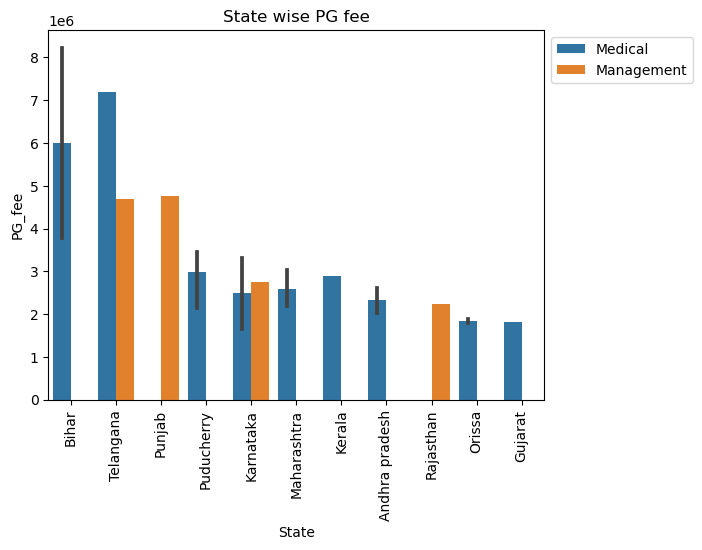

In [25]:
sns.barplot(data=(high_PG_fee.nlargest(25,columns='PG_fee')),x='State',y='PG_fee',hue='Stream')
plt.xticks(rotation=90)
plt.title("State wise PG fee")
plt.legend(bbox_to_anchor=(1,1))
plt.show()

#### Medical PG has high course fee

### Average Rating of Indian colleges

In [26]:
Indian_avg = data.sort_values(by='Average',ascending=False)
Indian_avg

,College_Name,State,Stream,UG_fee,PG_fee,Rating,Academic,Accommodation,Faculty,Infrastructure,Placement,Social_Life,Average
4790,Kanya Mahavidyalaya,Punjab,Arts,NaN,NaN,9.8,9.8,9.7,9.8,9.7,9.6,9.9,9.75
4706,Kanya Mahavidyalaya,Punjab,Agriculture,NaN,NaN,9.8,9.8,9.7,9.8,9.7,9.6,9.9,9.75
4748,Kanya Mahavidyalaya,Punjab,Commerce,NaN,NaN,9.8,9.8,9.7,9.8,9.7,9.6,9.9,9.75
3853,Armed Forces Medical College,Maharashtra,Science,NaN,NaN,9.7,9.4,9.7,9.7,9.6,9.9,9.9,9.70
3935,Armed Forces Medical College,Maharashtra,Medical,34000.0,31870.0,9.7,9.4,9.7,9.7,9.6,9.9,9.9,9.70
...,...,...,...,...,...,...,...,...,...,...,...,...,...
6726,"Jiaganj College of Engineering & Technology, M...",West bengal,Agriculture,33000.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6727,"Malda Polytechnic, Malda",West bengal,Agriculture,885.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6730,Swami Vivekananda University,West bengal,Agriculture,116000.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6734,Falakata Polytechnic,West bengal,Agriculture,885.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


### Highest average rating by states and courses

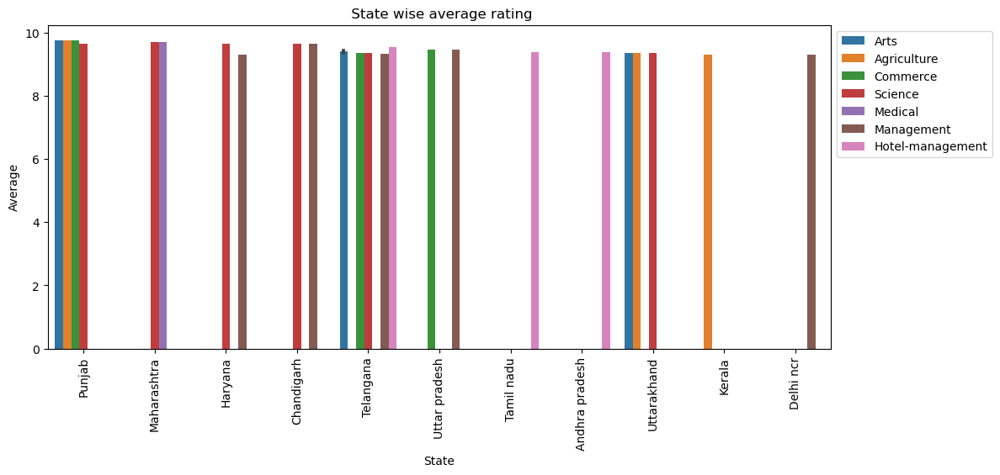

In [27]:
plt.figure(figsize=(12,5))
sns.barplot(data=(Indian_avg.nlargest(25,columns='Average')),x='State',y='Average',hue='Stream')
plt.title(" State wise average rating")
plt.xticks(rotation=90)
plt.legend(bbox_to_anchor=(1,1))
plt.show()

#### Highest average rated arts colleges are in Telengana and Uttarakhand, In kerala agricultaral college has highest rating 

## Indian colleges Academic rating

In [28]:
Indian_acdmc = data.sort_values(by='Academic',ascending=False)
Indian_acdmc

,College_Name,State,Stream,UG_fee,PG_fee,Rating,Academic,Accommodation,Faculty,Infrastructure,Placement,Social_Life,Average
5557,Chevalier T.Thomas Elizabeth College For Women,Tamil nadu,Law,NaN,NaN,8.5,9.8,6.0,8.6,9.3,8.5,8.9,8.516667
4508,College of Agricultural Engineering and Techno...,Orissa,Agriculture,35195.0,NaN,8.0,9.8,8.5,8.2,7.5,6.0,8.0,8.000000
4457,Indian Institute of Tourism and Travel Managem...,Orissa,Management,108850.0,188600.0,8.7,9.8,7.3,9.7,9.3,8.5,7.3,8.650000
972,University Institute of Tourism and Hospitalit...,Chandigarh,Management,166000.0,NaN,9.6,9.8,9.4,9.8,9.6,9.6,9.6,9.633333
5730,Sarojini Naidu Vanita Mahavidyalaya,Telangana,Arts,5050.0,7200.0,9.4,9.8,9.8,8.5,9.5,9.0,9.5,9.350000
...,...,...,...,...,...,...,...,...,...,...,...,...,...
6726,"Jiaganj College of Engineering & Technology, M...",West bengal,Agriculture,33000.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6727,"Malda Polytechnic, Malda",West bengal,Agriculture,885.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6730,Swami Vivekananda University,West bengal,Agriculture,116000.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6734,Falakata Polytechnic,West bengal,Agriculture,885.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


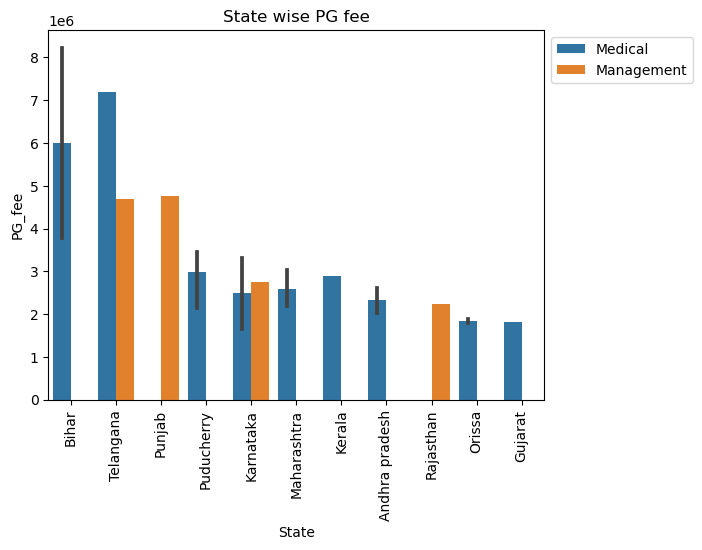

In [29]:
sns.barplot(data=(high_PG_fee.nlargest(25,columns='PG_fee')),x='State',y='PG_fee',hue='Stream')
plt.xticks(rotation=90)
plt.title("State wise PG fee")
plt.legend(bbox_to_anchor=(1,1))
plt.show()

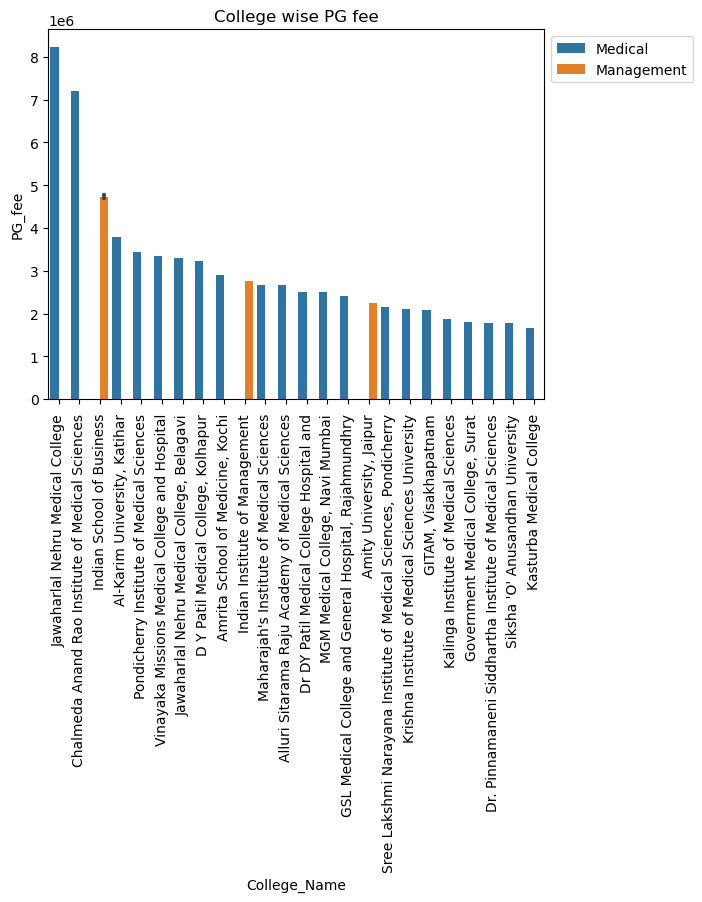

In [30]:
sns.barplot(data=(high_PG_fee.nlargest(25,columns='PG_fee')),x='College_Name',y='PG_fee',hue='Stream')
plt.xticks(rotation=90)
plt.title("College wise PG fee")
plt.legend(bbox_to_anchor=(1,1))
plt.show()

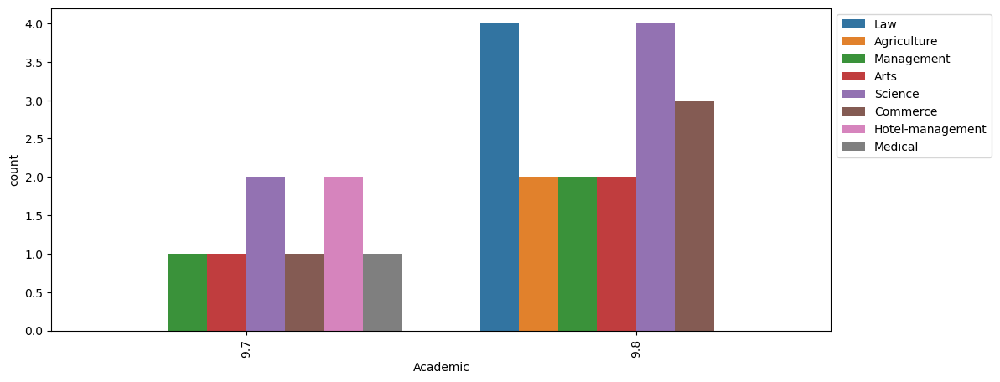

In [31]:
plt.figure(figsize=(12,5))
sns.countplot(data=(Indian_acdmc.nlargest(25,columns='Academic')),x='Academic',hue='Stream')
plt.xticks(rotation=90)
plt.legend(bbox_to_anchor=(1,1))
plt.show()

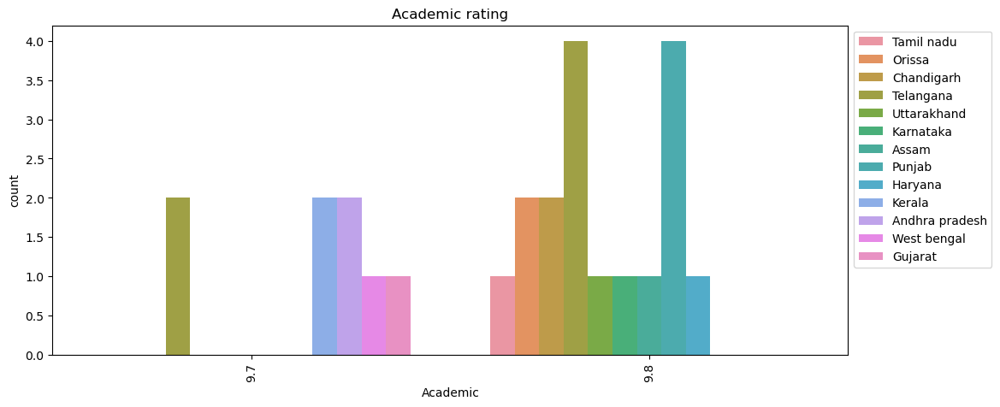

In [32]:
plt.figure(figsize=(12,5))
sns.countplot(data=(Indian_acdmc.nlargest(25,columns='Academic')),x='Academic',hue='State')
plt.title("Academic rating")
plt.xticks(rotation=90)
plt.legend(bbox_to_anchor=(1,1))
plt.show()

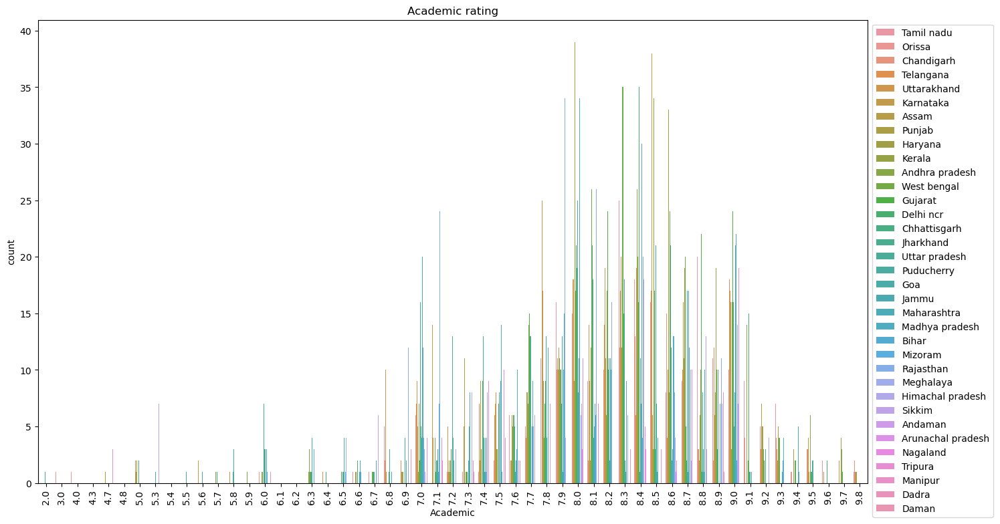

In [33]:
plt.figure(figsize=(16,9))
sns.countplot(data=Indian_acdmc,x='Academic',hue='State')
plt.title("Academic rating")
plt.xticks(rotation=90)
plt.legend(bbox_to_anchor=(1,1))
plt.show()

In [34]:
Indian_acco = data.sort_values(by='Accommodation',ascending=False)
Indian_acco

,College_Name,State,Stream,UG_fee,PG_fee,Rating,Academic,Accommodation,Faculty,Infrastructure,Placement,Social_Life,Average
5730,Sarojini Naidu Vanita Mahavidyalaya,Telangana,Arts,5050.0,7200.0,9.4,9.8,9.8,8.5,9.5,9.0,9.5,9.350000
5637,Sarojini Naidu Vanita Mahavidyalaya,Telangana,Science,12200.0,25975.0,9.4,9.8,9.8,8.5,9.5,9.0,9.5,9.350000
3368,CSI Institute Of Legal Studies,Kerala,Law,40000.0,NaN,8.8,8.8,9.8,8.5,9.0,8.0,8.5,8.766667
5685,Sarojini Naidu Vanita Mahavidyalaya,Telangana,Commerce,7800.0,11000.0,9.4,9.8,9.8,8.5,9.5,9.0,9.5,9.350000
3291,Indian School of Business Management and Admin...,Kerala,Law,7900.0,NaN,9.2,9.7,9.7,9.3,9.3,9.0,8.3,9.216667
...,...,...,...,...,...,...,...,...,...,...,...,...,...
6726,"Jiaganj College of Engineering & Technology, M...",West bengal,Agriculture,33000.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6727,"Malda Polytechnic, Malda",West bengal,Agriculture,885.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6730,Swami Vivekananda University,West bengal,Agriculture,116000.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6734,Falakata Polytechnic,West bengal,Agriculture,885.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


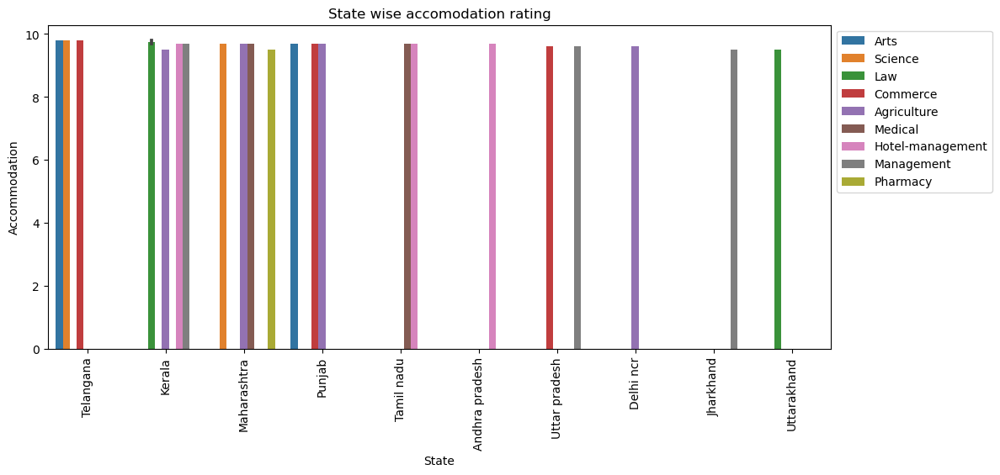

In [35]:
plt.figure(figsize=(12,5))
sns.barplot(data=(Indian_acco.nlargest(25,columns='Accommodation')),x='State',y='Accommodation',hue='Stream')
plt.title("State wise accomodation rating")
plt.xticks(rotation=90)
plt.legend(bbox_to_anchor=(1,1))
plt.show()

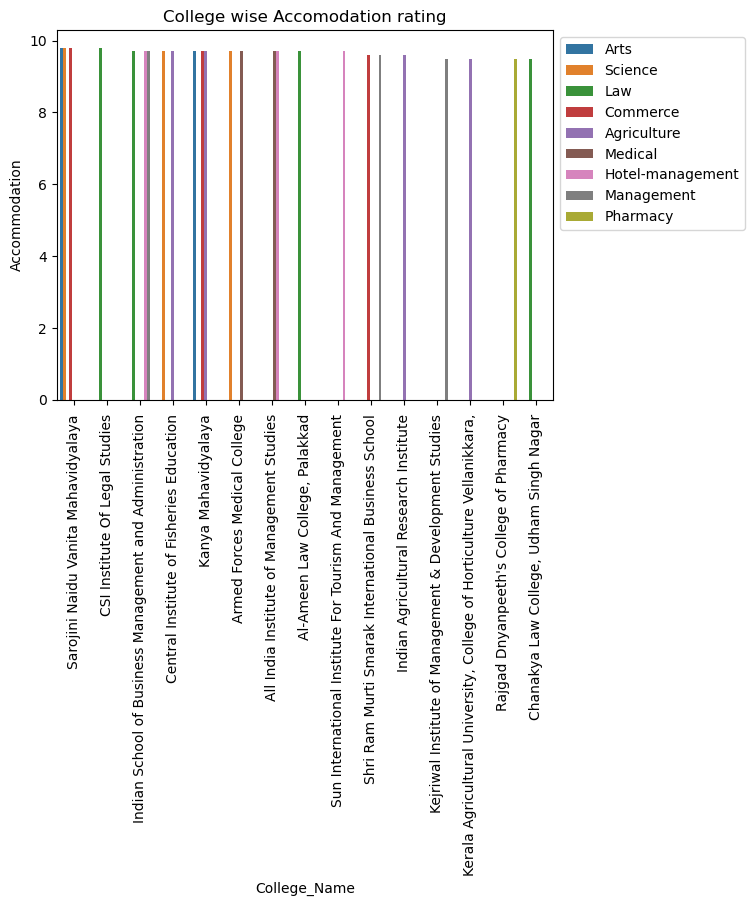

In [36]:
sns.barplot(data=(Indian_acco.nlargest(25,columns='Accommodation')),x='College_Name',y='Accommodation',hue='Stream')
plt.xticks(rotation=90)
plt.title("College wise Accomodation rating")
plt.legend(bbox_to_anchor=(1,1))
plt.show()

In [37]:
Indian_faculty = data.sort_values(by='Faculty',ascending=False)
Indian_faculty

,College_Name,State,Stream,UG_fee,PG_fee,Rating,Academic,Accommodation,Faculty,Infrastructure,Placement,Social_Life,Average
1395,Sunder Deep Pharmacy College,Delhi ncr,Pharmacy,115000.0,105950.0,9.2,9.1,8.8,9.9,9.2,8.7,9.3,9.166667
6184,Sunder Deep Pharmacy College,Uttar pradesh,Pharmacy,115000.0,105950.0,9.2,9.1,8.8,9.9,9.2,8.7,9.3,9.166667
4785,University Institute of Tourism and Hospitalit...,Punjab,Science,116000.0,NaN,9.6,9.8,9.4,9.8,9.6,9.6,9.6,9.633333
954,University Institute of Tourism and Hospitalit...,Chandigarh,Science,116000.0,NaN,9.6,9.8,9.4,9.8,9.6,9.6,9.6,9.633333
4706,Kanya Mahavidyalaya,Punjab,Agriculture,NaN,NaN,9.8,9.8,9.7,9.8,9.7,9.6,9.9,9.750000
...,...,...,...,...,...,...,...,...,...,...,...,...,...
6726,"Jiaganj College of Engineering & Technology, M...",West bengal,Agriculture,33000.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6727,"Malda Polytechnic, Malda",West bengal,Agriculture,885.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6730,Swami Vivekananda University,West bengal,Agriculture,116000.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6734,Falakata Polytechnic,West bengal,Agriculture,885.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


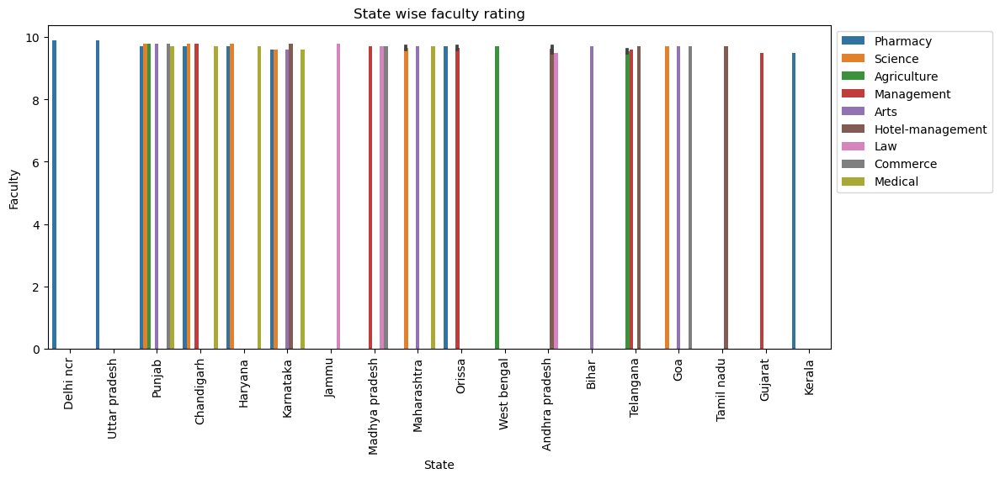

In [38]:
plt.figure(figsize=(12,5))
sns.barplot(data=(Indian_faculty.nlargest(50,columns='Faculty')),x='State',y='Faculty',hue='Stream')
plt.title("State wise faculty rating")
plt.xticks(rotation=90)
plt.legend(bbox_to_anchor=(1,1))
plt.show()

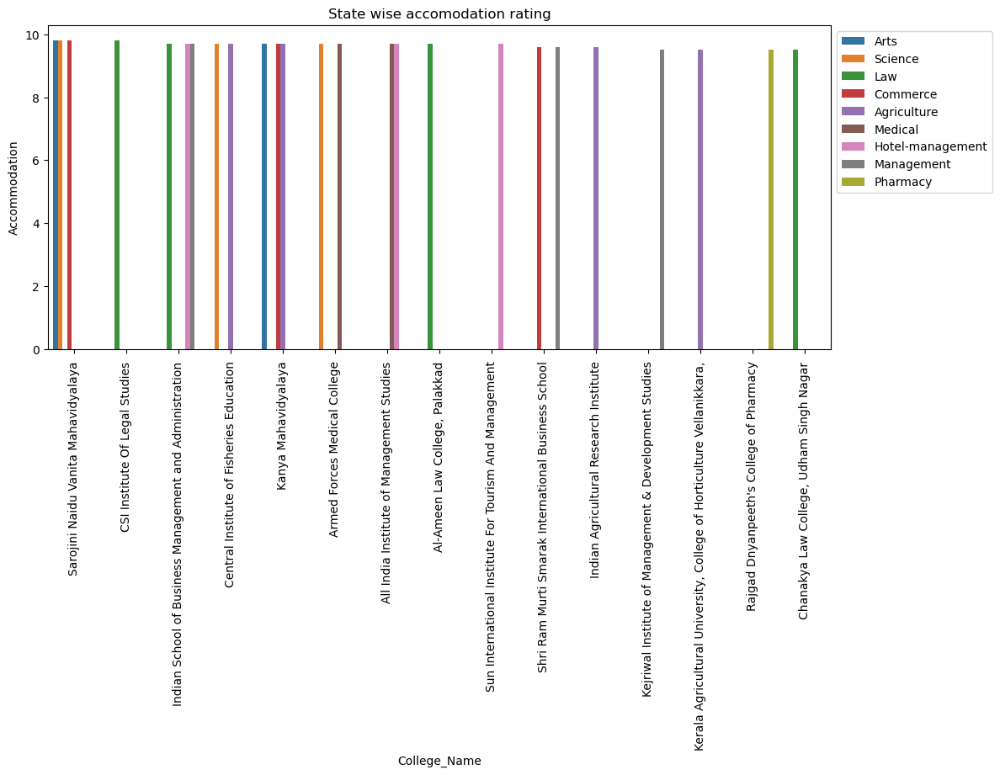

In [39]:
plt.figure(figsize=(12,5))
sns.barplot(data=(Indian_acco.nlargest(25,columns='Accommodation')),x='College_Name',y='Accommodation',hue='Stream')
plt.title("State wise accomodation rating")
plt.xticks(rotation=90)
plt.legend(bbox_to_anchor=(1,1))
plt.show()

## Infrastructure Rating

In [40]:
Indian_Infrastructure = data.sort_values(by='Infrastructure',ascending=False)
Indian_Infrastructure

,College_Name,State,Stream,UG_fee,PG_fee,Rating,Academic,Accommodation,Faculty,Infrastructure,Placement,Social_Life,Average
4681,National Institute of Pharmaceutical Education...,Punjab,Science,90500.0,127500.0,9.2,9.1,9.4,9.1,9.9,8.5,9.4,9.233333
4831,National Institute of Pharmaceutical Education...,Punjab,Pharmacy,90500.0,127500.0,9.2,9.1,9.4,9.1,9.9,8.5,9.4,9.233333
2775,Kejriwal Institute of Management & Development...,Jharkhand,Management,472000.0,NaN,9.0,9.0,9.5,8.0,9.8,9.5,8.0,8.966667
246,Bapatla College of Pharmacy,Andhra pradesh,Pharmacy,52000.0,110000.0,7.6,9.0,7.8,8.6,9.8,4.2,6.0,7.566667
3077,Indian School of Business Management and Admin...,Karnataka,Hotel-management,14900.0,NaN,9.2,9.6,7.8,9.8,9.8,9.2,9.2,9.233333
...,...,...,...,...,...,...,...,...,...,...,...,...,...
6726,"Jiaganj College of Engineering & Technology, M...",West bengal,Agriculture,33000.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6727,"Malda Polytechnic, Malda",West bengal,Agriculture,885.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6730,Swami Vivekananda University,West bengal,Agriculture,116000.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6734,Falakata Polytechnic,West bengal,Agriculture,885.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


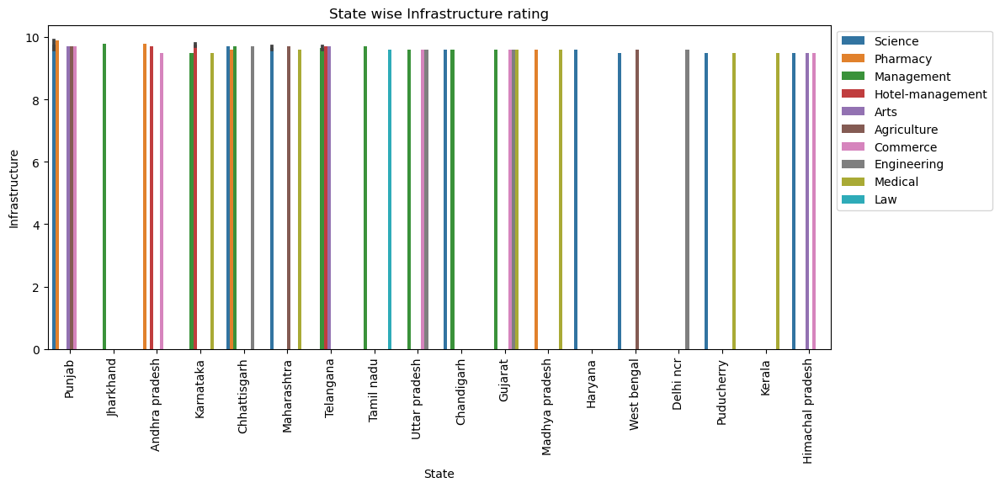

In [41]:
plt.figure(figsize=(12,5))
sns.barplot(data=(Indian_Infrastructure.nlargest(50,columns='Infrastructure')),x='State',y='Infrastructure',hue='Stream')
plt.title("State wise Infrastructure rating")
plt.xticks(rotation=90)
plt.legend(bbox_to_anchor=(1,1))
plt.show()

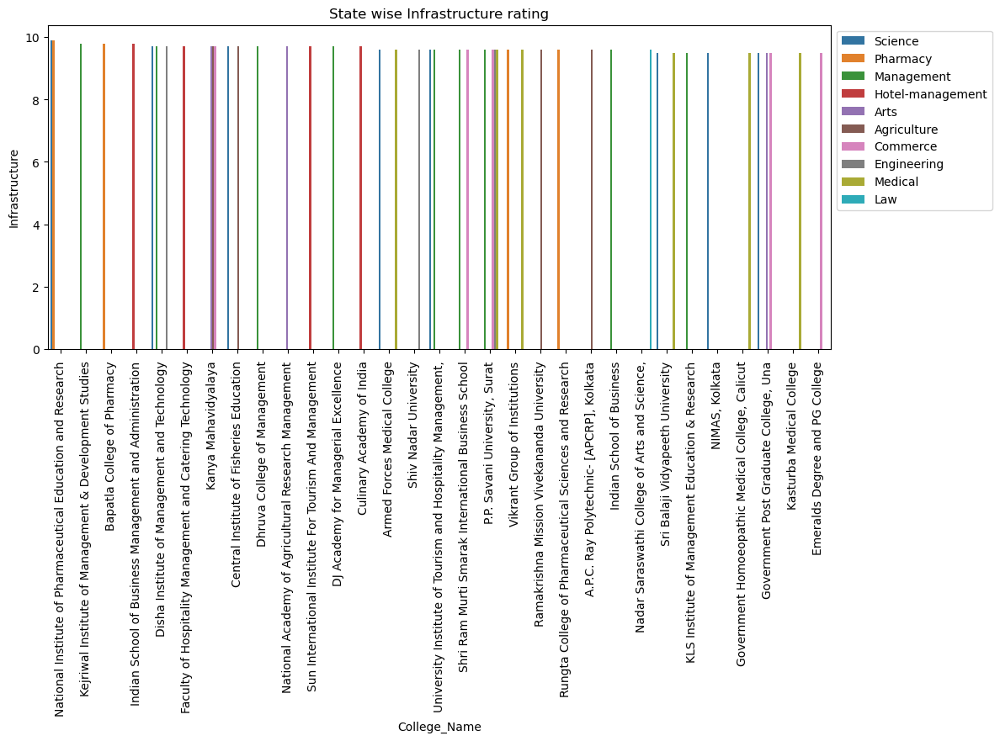

In [42]:
plt.figure(figsize=(12,5))
sns.barplot(data=(Indian_Infrastructure.nlargest(50,columns='Infrastructure')),x='College_Name',y='Infrastructure',hue='Stream')
plt.title("State wise Infrastructure rating")
plt.xticks(rotation=90)
plt.legend(bbox_to_anchor=(1,1))
plt.show()

In [43]:
Indian_Placement = data.sort_values(by='Placement',ascending=False)
Indian_Placement

,College_Name,State,Stream,UG_fee,PG_fee,Rating,Academic,Accommodation,Faculty,Infrastructure,Placement,Social_Life,Average
3935,Armed Forces Medical College,Maharashtra,Medical,34000.0,31870.0,9.7,9.4,9.7,9.7,9.6,9.9,9.9,9.700000
3853,Armed Forces Medical College,Maharashtra,Science,NaN,NaN,9.7,9.4,9.7,9.7,9.6,9.9,9.9,9.700000
5315,"SRM Institute of Hotel Management, Chennai",Tamil nadu,Hotel-management,70560.0,57500.0,9.4,9.3,8.5,9.7,9.4,9.9,9.5,9.383333
2963,Belagavi Institute of Medical Sciences,Karnataka,Medical,65780.0,118500.0,8.6,9.1,8.0,9.0,7.4,9.8,8.0,8.550000
2905,Belagavi Institute of Medical Sciences,Karnataka,Science,NaN,NaN,8.6,9.1,8.0,9.0,7.4,9.8,8.0,8.550000
...,...,...,...,...,...,...,...,...,...,...,...,...,...
6726,"Jiaganj College of Engineering & Technology, M...",West bengal,Agriculture,33000.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6727,"Malda Polytechnic, Malda",West bengal,Agriculture,885.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6730,Swami Vivekananda University,West bengal,Agriculture,116000.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6734,Falakata Polytechnic,West bengal,Agriculture,885.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


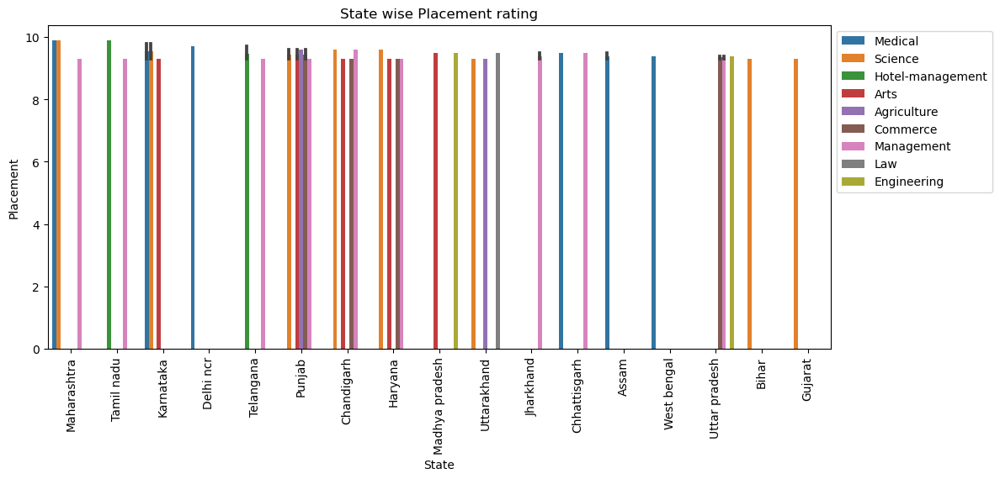

In [44]:
plt.figure(figsize=(12,5))
sns.barplot(data=(Indian_Placement.nlargest(50,columns='Placement')),x='State',y='Placement',hue='Stream')
plt.title("State wise Placement rating")
plt.xticks(rotation=90)
plt.legend(bbox_to_anchor=(1,1))
plt.show()

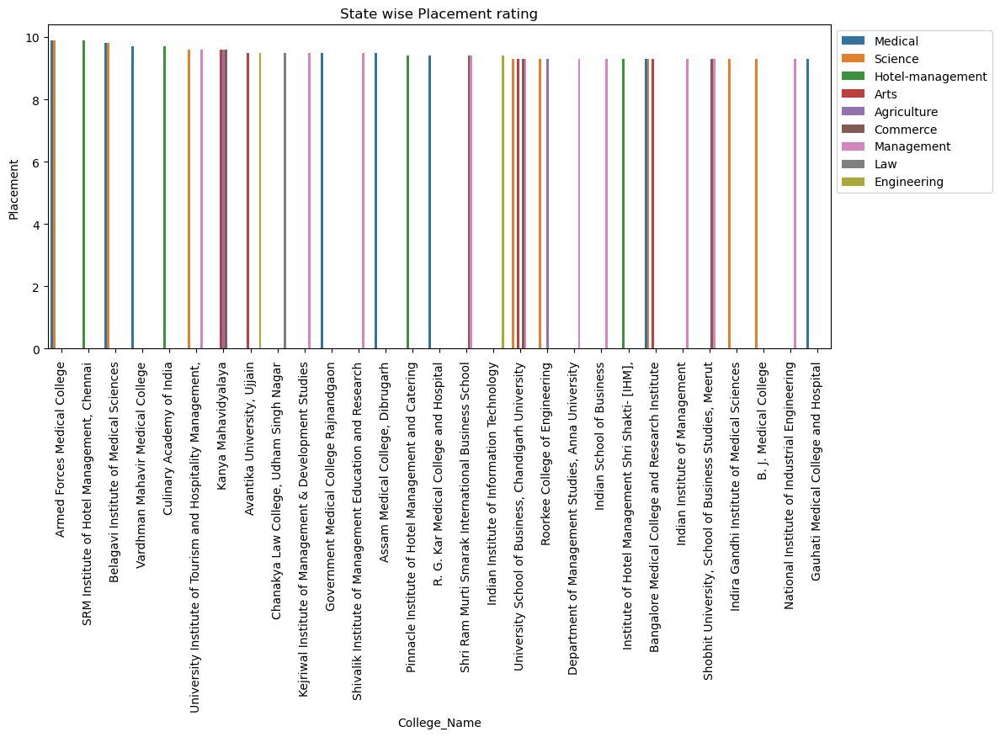

In [45]:
plt.figure(figsize=(12,5))
sns.barplot(data=(Indian_Placement.nlargest(50,columns='Placement')),x='College_Name',y='Placement',hue='Stream')
plt.title("State wise Placement rating")
plt.xticks(rotation=90)
plt.legend(bbox_to_anchor=(1,1))
plt.show()

### Colleges in Kerala

In [46]:
kerala_data = data.query("State=='Kerala'")
kerala_data.drop(columns=['State'],inplace=True)
kerala_data

,College_Name,Stream,UG_fee,PG_fee,Rating,Academic,Accommodation,Faculty,Infrastructure,Placement,Social_Life,Average
3171,Sacred Heart College,Arts,6170.0,115600.0,8.5,8.9,7.5,8.6,8.8,8.0,9.1,8.483333
3172,"Government College, Kasaragod",Arts,NaN,NaN,8.2,8.3,7.4,9.1,8.7,6.6,9.0,8.183333
3173,"St. Albert's College, Ernakulam",Arts,18000.0,37500.0,7.1,7.9,6.4,7.7,7.0,6.5,6.9,7.066667
3174,Jai Bharath Arts and Science College,Commerce,NaN,NaN,6.4,6.6,6.6,6.7,6.2,6.0,6.5,6.433333
3175,"Gems Arts and Science College, Malappuram",Commerce,NaN,NaN,7.8,8.2,6.5,8.3,8.3,6.2,9.1,7.766667
...,...,...,...,...,...,...,...,...,...,...,...,...
3463,National University of Advanced Legal Studies,Law,21000.0,125000.0,7.4,7.3,6.0,8.2,6.3,8.3,8.1,7.366667
3464,"Trivandrum University College, Thiruvananthapu...",Science,1555.0,3595.0,8.5,9.2,8.0,8.6,9.0,7.5,8.6,8.483333
3465,Sacred Heart College,Science,6970.0,10200.0,8.5,8.9,7.5,8.6,8.8,8.0,9.1,8.483333
3466,Rajagiri College of Social Sciences,Science,23853.0,46803.0,8.5,8.8,8.5,8.8,8.5,8.0,8.1,8.450000


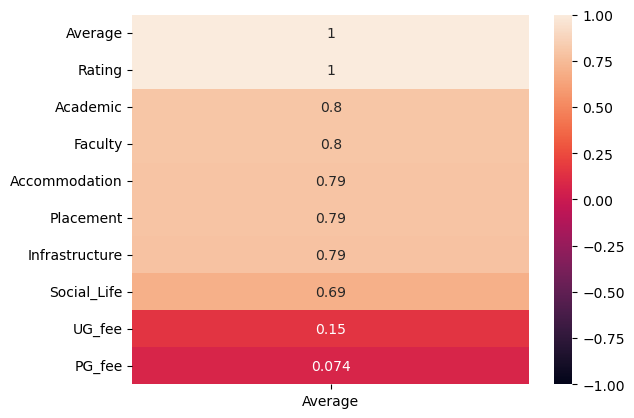

In [47]:
sns.heatmap(kerala_data.corr()[["Average"]].sort_values(by="Average",ascending=False),vmax=1,vmin=-1,annot=True)
plt.plot();


### Kerala stream countplot

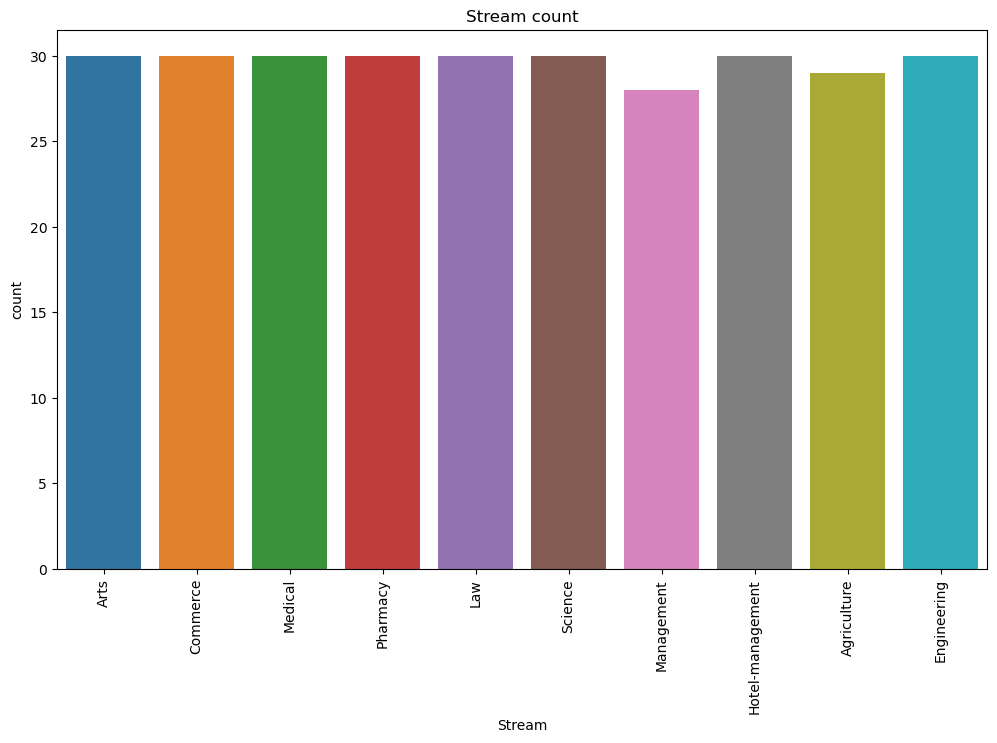

In [48]:
plt.figure(figsize=(12,7))
sns.countplot(data=kerala_data,x='Stream')
plt.title("Stream count")
plt.xticks(rotation=90)
plt.show()

#### Different streams have many options of colleges for choose in Kerala

### Kerala Art Colleges

In [49]:
art_colleges_kerala = kerala_data.query("Stream=='Arts'")
art_colleges_kerala.drop(columns=['Stream'],inplace=True)
art_colleges_kerala

,College_Name,UG_fee,PG_fee,Rating,Academic,Accommodation,Faculty,Infrastructure,Placement,Social_Life,Average
3171,Sacred Heart College,6170.0,115600.0,8.5,8.9,7.5,8.6,8.8,8.0,9.1,8.483333
3172,"Government College, Kasaragod",NaN,NaN,8.2,8.3,7.4,9.1,8.7,6.6,9.0,8.183333
3173,"St. Albert's College, Ernakulam",18000.0,37500.0,7.1,7.9,6.4,7.7,7.0,6.5,6.9,7.066667
3177,"Government Victoria College, Palakkad",2025.0,3480.0,8.0,8.5,7.4,8.8,7.5,6.3,9.3,7.966667
3178,"Gems Arts and Science College, Malappuram",NaN,NaN,7.8,8.2,6.5,8.3,8.3,6.2,9.1,7.766667
3179,"St Joseph's College Devagiri, Calicut",27200.0,45000.0,8.4,8.8,7.7,8.7,8.7,7.4,9.0,8.383333
3180,"St Teresa's College (Autonomous), Ernakulam",6500.0,5000.0,8.4,8.9,7.4,9.0,8.2,7.7,9.3,8.416667
3183,"Maharaja's College, Ernakulam",3920.0,5200.0,7.8,8.4,7.3,8.6,8.2,5.4,8.8,7.783333
3250,"Farook College, Kozhikode",2335.0,3760.0,8.1,8.7,8.1,8.5,8.5,5.8,9.0,8.100000
3251,"Mahatma Gandhi College, Trivandrum",2250.0,3390.0,8.1,8.7,7.5,8.6,8.8,5.9,8.9,8.066667


#### Art colleges ranking by their rating

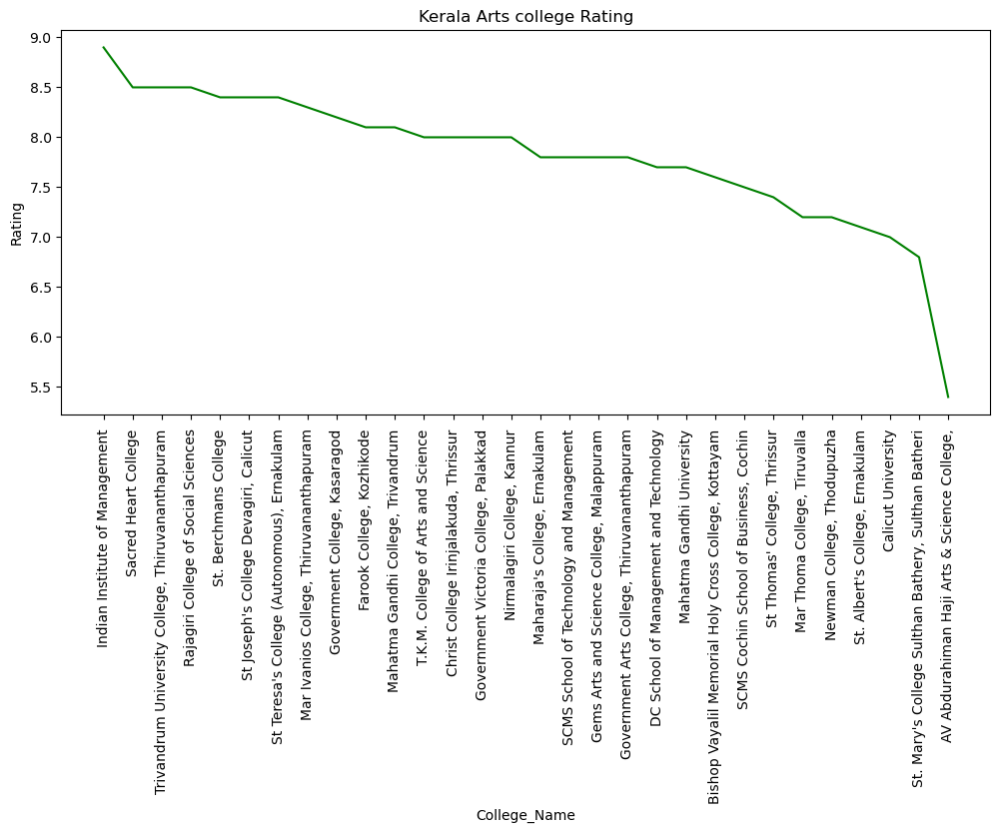

In [50]:
plt.figure(figsize=(12,5))
plt.xticks(rotation=90)
sns.lineplot(x='College_Name',y='Rating',data=art_colleges_kerala.sort_values(by='Rating',ascending=False),color='green')
plt.title("Kerala Arts college Rating")
plt.show()

#### Based on rating IIM, Sacred Heart College and Trivandrum University College are the best colleges in Kerala

### Academic Rating of Colleges in Kerala

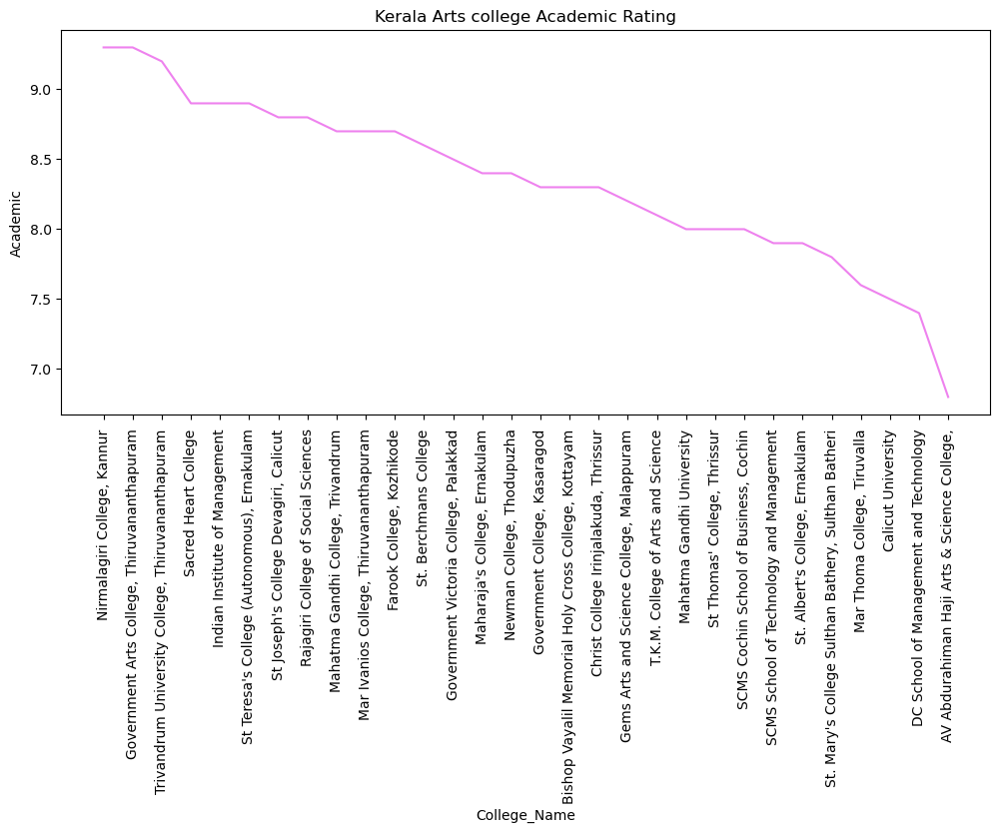

In [51]:
plt.figure(figsize=(12,5))
plt.xticks(rotation=90)
sns.lineplot(x='College_Name',y='Academic',data=art_colleges_kerala.sort_values(by='Academic',ascending=False),color='violet')
plt.title("Kerala Arts college Academic Rating")
plt.show()

#### Based on Academic rating Nirmalagiri College,Government Arts College and Trivandrum University College are the best

### Accomodation Rating of Kerala Arts Colleges

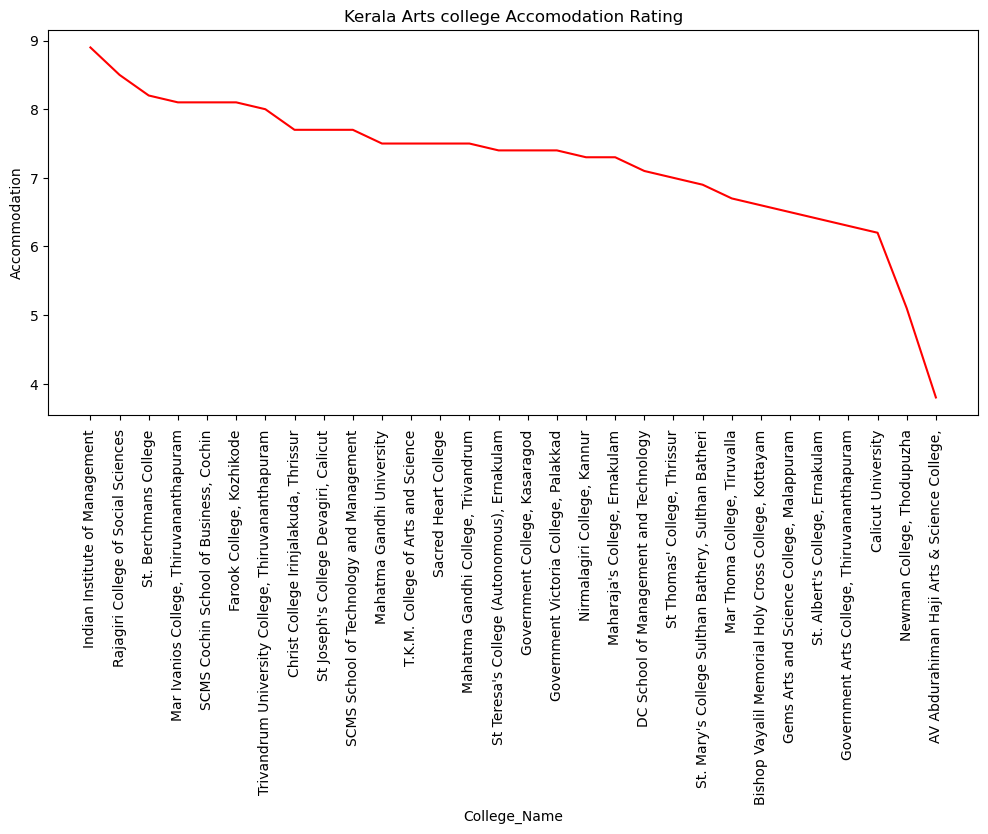

In [52]:
plt.figure(figsize=(12,5))
plt.xticks(rotation=90)
sns.lineplot(x='College_Name',y='Accommodation',data=art_colleges_kerala.sort_values(by='Accommodation',ascending=False),\
             color='red')
plt.title("Kerala Arts college Accomodation Rating")
plt.show()

#### IIM,Rajagiri College of Social Sciences and St.Berchmans College are having the best accomodation facility

### Infrastructure Rating of Kerala Arts Colleges

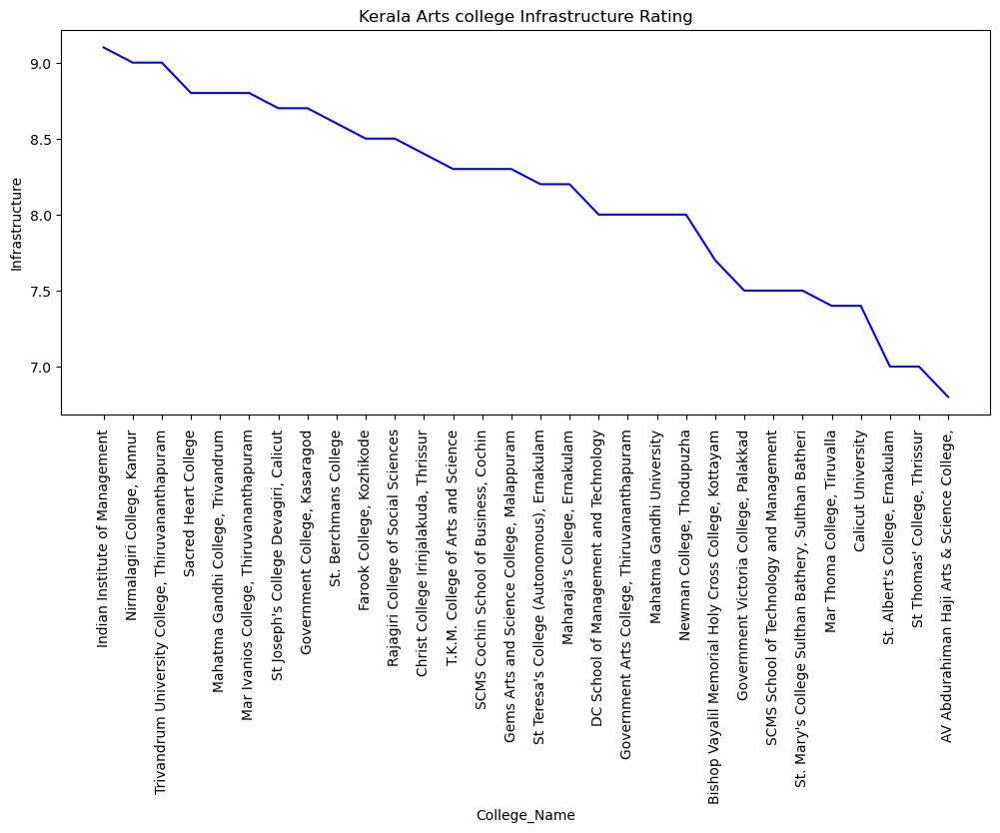

In [53]:
plt.figure(figsize=(12,5))
plt.xticks(rotation=90)
sns.lineplot(x='College_Name',y='Infrastructure',data=art_colleges_kerala.sort_values(by='Infrastructure',ascending=False),\
             color='blue')
plt.title("Kerala Arts college Infrastructure Rating")
plt.show()

#### Based on Infrastructure rating IIM,Nirmalagiri College,Trivandrum University College are the best 

### Placement Rating of Kerala Arts Colleges

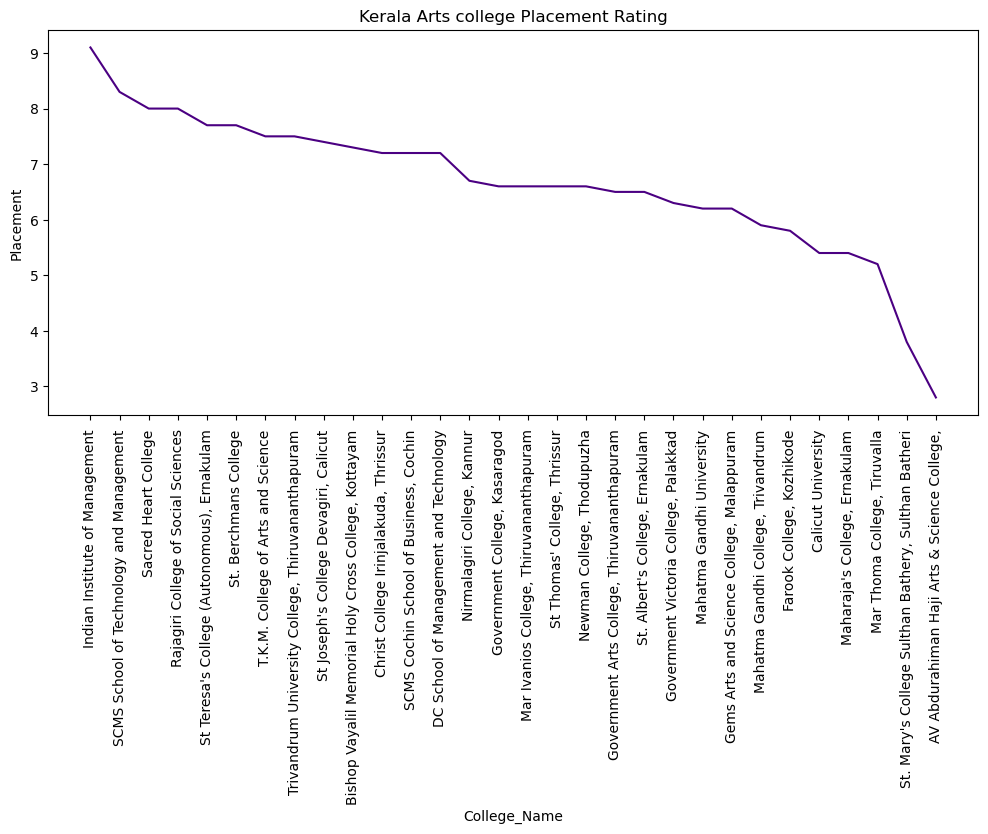

In [54]:
plt.figure(figsize=(12,5))
plt.xticks(rotation=90)
sns.lineplot(x='College_Name',y='Placement',data=art_colleges_kerala.sort_values(by='Placement',ascending=False),\
             color='indigo')
plt.title("Kerala Arts college Placement Rating")
plt.show()

#### IIM,SCMS School of technology and management,Sacred Heart College providing best placement opportunity

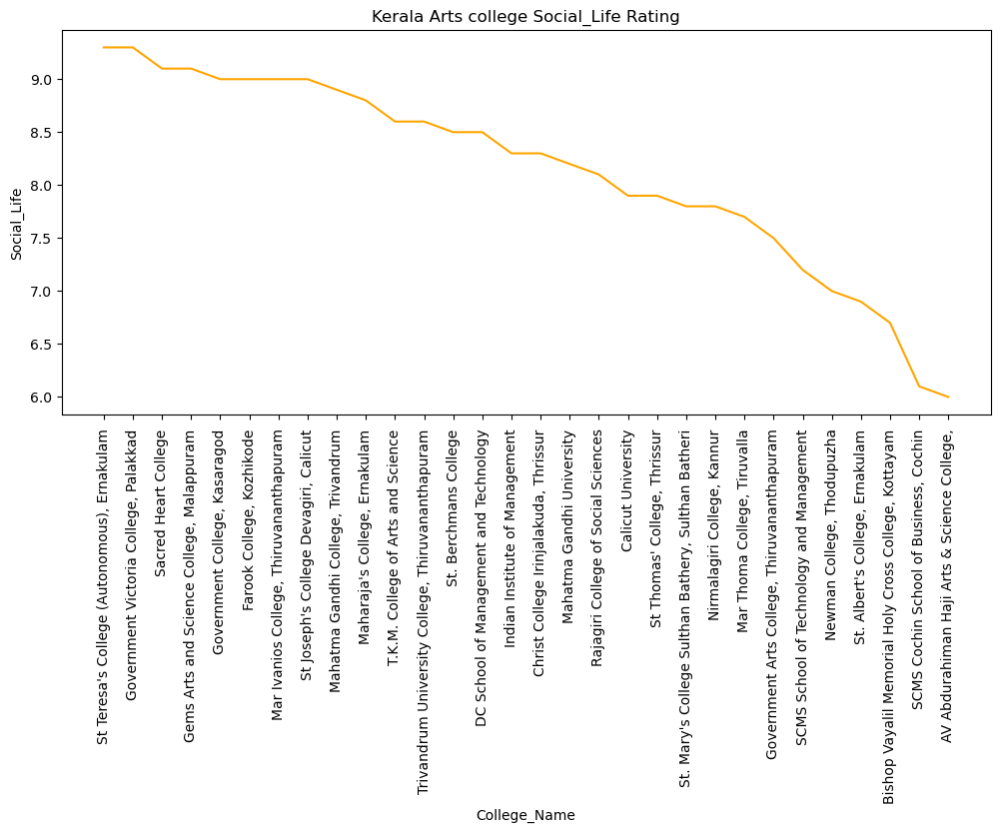

In [55]:
plt.figure(figsize=(12,5))
plt.xticks(rotation=90)
sns.lineplot(x='College_Name',y='Social_Life',data=art_colleges_kerala.sort_values(by='Social_Life',ascending=False),\
             color='orange')
plt.title("Kerala Arts college Social_Life Rating")
plt.show()

#### St.Teresa's College,Govt Victoria College and Sacred Heart College are having high social life ratings

### Kerala Arts Colleges overall rating

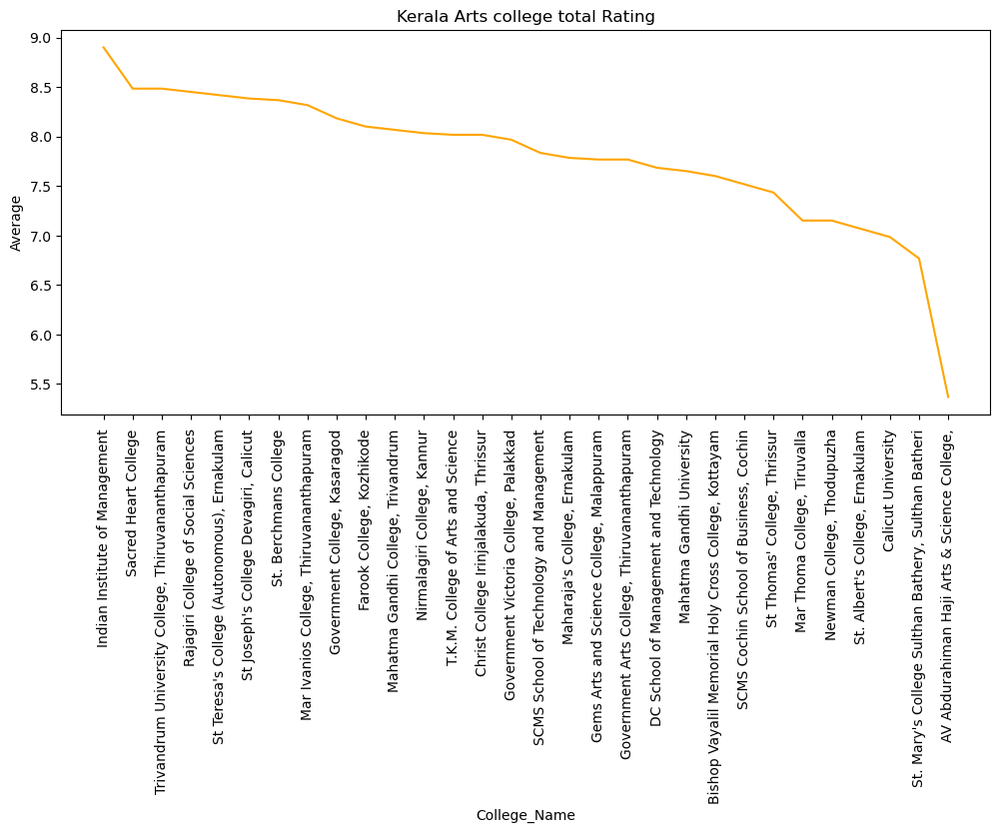

In [56]:
plt.figure(figsize=(12,5))
plt.xticks(rotation=90)
sns.lineplot(x='College_Name',y='Average',data=art_colleges_kerala.sort_values(by='Average',ascending=False),\
             color='orange')
plt.title("Kerala Arts college total Rating")
plt.show()

#### IIM,Sacred Heart and Trivandrum University College are the best Arts college according to overall rating

### Kerala Management Colleges

In [57]:
management_kerala = kerala_data.query("Stream == 'Management'").drop(columns=['Stream'])
management_kerala

,College_Name,UG_fee,PG_fee,Rating,Academic,Accommodation,Faculty,Infrastructure,Placement,Social_Life,Average
3293,"Don Bosco College Sulthan Bathery, Wayanad",38600.0,45000.0,7.9,8.3,6.8,8.5,8.3,6.8,8.5,7.866667
3294,Bhavan's Royal Institute of Management,163000.0,NaN,7.7,8.0,7.5,7.4,6.7,7.9,8.4,7.650000
3295,Amity Global Business School,161000.0,299000.0,8.6,9.0,7.5,8.8,8.6,8.6,9.2,8.616667
3296,Mar Athanasios College for Advanced Studies Ti...,96600.0,NaN,8.7,9.3,9.3,8.6,8.8,8.0,8.4,8.733333
3297,Amrita School of Business,660000.0,NaN,9.4,9.7,9.0,NaN,NaN,NaN,NaN,NaN
3298,Kochi Business School,320000.0,250000.0,7.7,7.7,7.3,7.8,7.5,7.9,7.9,7.683333
3299,State Institute of Hospitality Management,30000.0,30000.0,7.8,8.5,6.8,8.0,7.3,8.8,7.3,7.783333
3300,"Naipunnya School of Management, Cherthala",18000.0,NaN,7.5,7.4,6.8,8.1,7.8,7.6,7.3,7.500000
3301,"IIKM Business School, Calicut",90000.0,385000.0,8.2,7.7,8.0,8.0,8.7,8.7,8.0,8.183333
3302,Yuvakshetra Institute of Management Studies,96000.0,NaN,6.9,7.7,5.8,6.8,8.0,6.5,6.7,6.916667


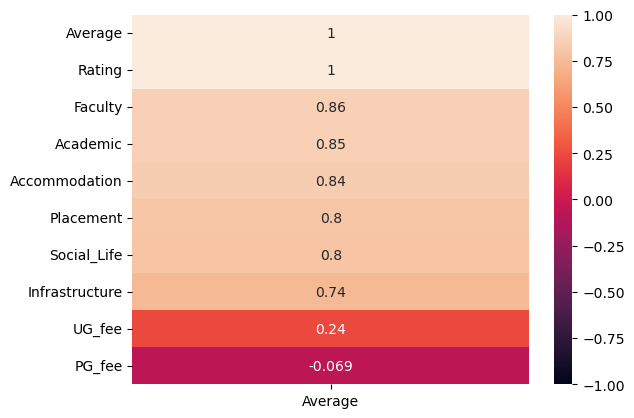

In [58]:
sns.heatmap(management_kerala.corr()[["Average"]].sort_values(by="Average",ascending=False),vmax=1,vmin=-1,annot=True)
plt.plot();

### Countplot of Management Colleges rating

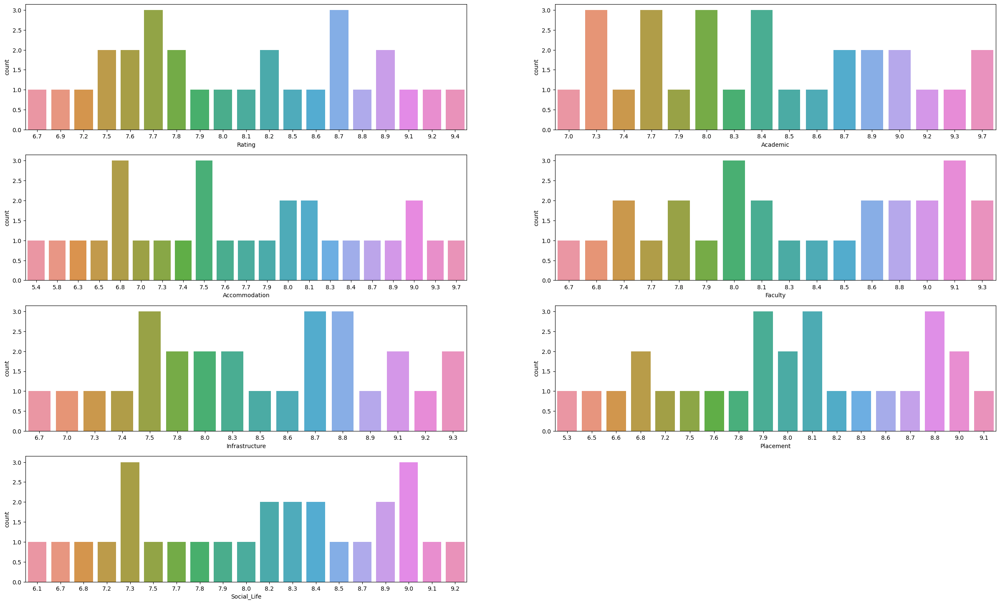

In [59]:
plt.figure(figsize=(30,18))
plt.subplot(4,2,1)
sns.countplot(data=management_kerala.sort_values(by='Rating'),x='Rating')

plt.subplot(4,2,2)
sns.countplot(data=management_kerala.sort_values(by='Academic'),x='Academic')

plt.subplot(4,2,3)
sns.countplot(data=management_kerala.sort_values(by='Accommodation'),x='Accommodation')

plt.subplot(4,2,4)
sns.countplot(data=management_kerala.sort_values(by='Faculty'),x='Faculty')

plt.subplot(4,2,5)
sns.countplot(data=management_kerala.sort_values(by='Infrastructure'),x='Infrastructure')

plt.subplot(4,2,6)
sns.countplot(data=management_kerala.sort_values(by='Placement'),x='Placement')

plt.subplot(4,2,7)
sns.countplot(data=management_kerala.sort_values(by='Social_Life'),x='Social_Life')


plt.show()

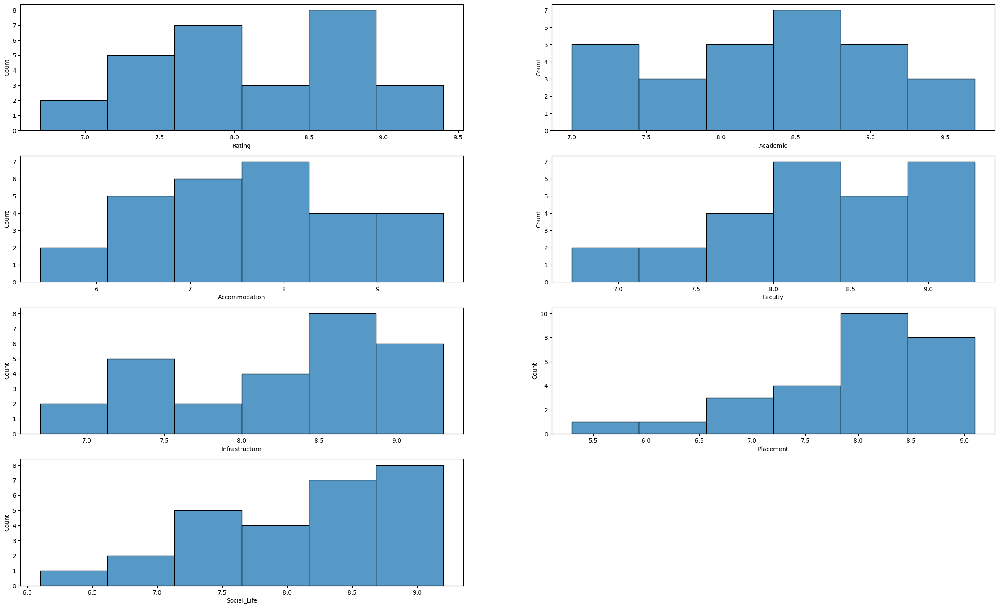

In [60]:
plt.figure(figsize=(30,18))
plt.subplot(4,2,1)
sns.histplot(data=management_kerala.sort_values(by='Rating'),x='Rating')

plt.subplot(4,2,2)
sns.histplot(data=management_kerala.sort_values(by='Academic'),x='Academic')

plt.subplot(4,2,3)
sns.histplot(data=management_kerala.sort_values(by='Accommodation'),x='Accommodation')

plt.subplot(4,2,4)
sns.histplot(data=management_kerala.sort_values(by='Faculty'),x='Faculty')

plt.subplot(4,2,5)
sns.histplot(data=management_kerala.sort_values(by='Infrastructure'),x='Infrastructure')

plt.subplot(4,2,6)
sns.histplot(data=management_kerala.sort_values(by='Placement'),x='Placement')

plt.subplot(4,2,7)
sns.histplot(data=management_kerala.sort_values(by='Social_Life'),x='Social_Life')


plt.show()

### Line plot of Kerala Management colleges

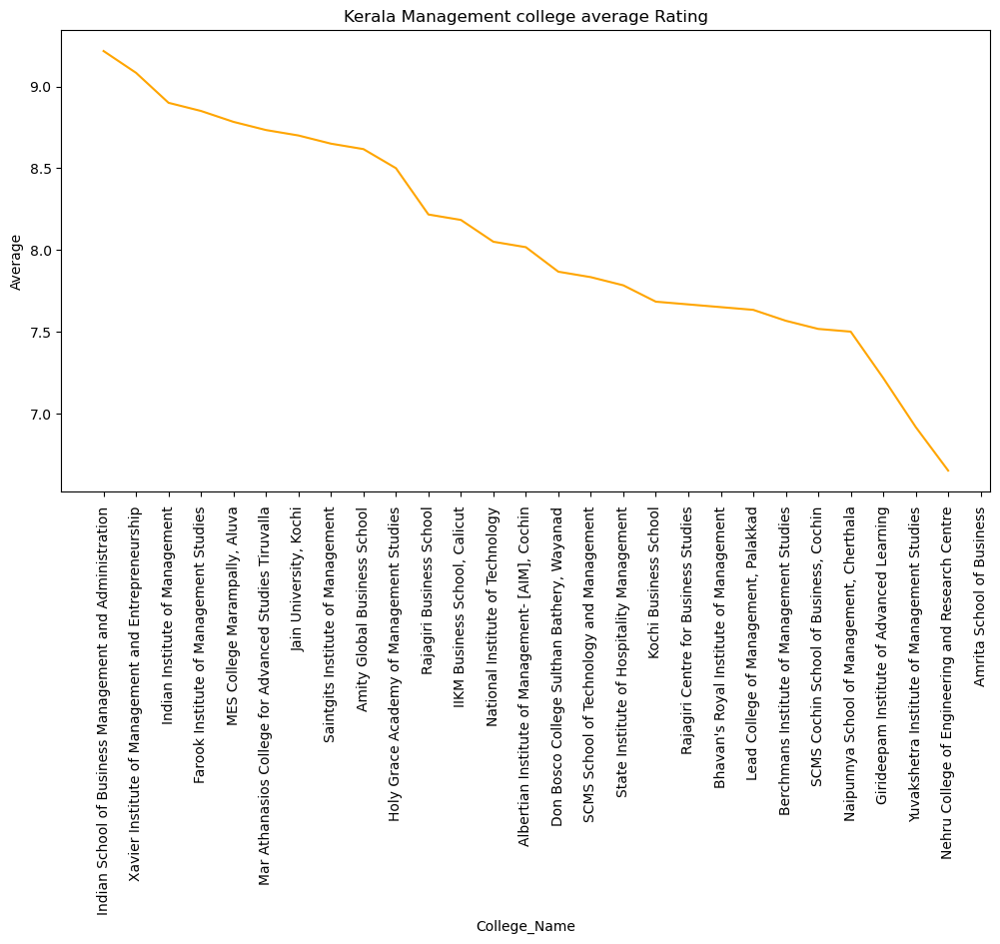

In [61]:
plt.figure(figsize=(12,6))
plt.xticks(rotation=90)
sns.lineplot(x='College_Name',y='Average',data=management_kerala.sort_values(by='Average',ascending=False),\
             color='orange')
plt.title("Kerala Management college average Rating")
plt.show()

#### Best management College in Kerala based on overall rating is Indian School of Business Management and administration

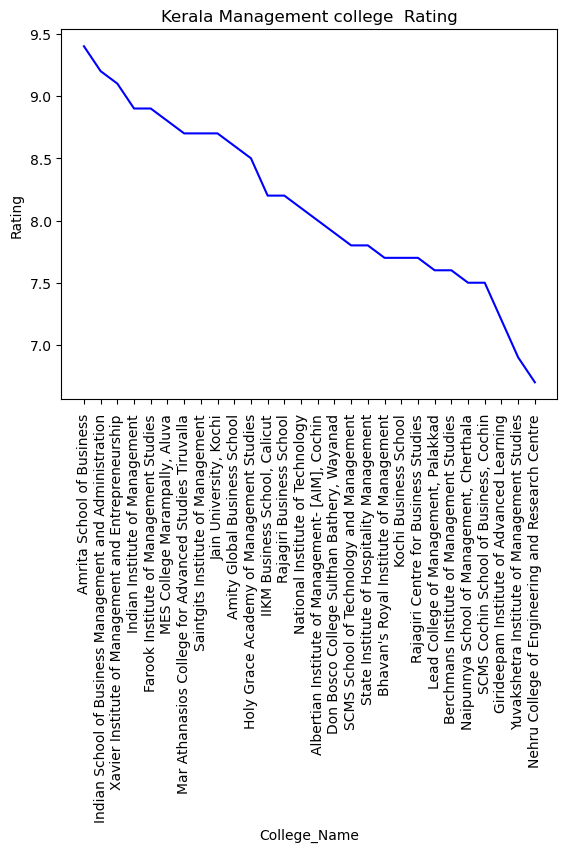

In [62]:
plt.xticks(rotation=90)
sns.lineplot(x='College_Name',y='Rating',data=management_kerala.sort_values(by='Rating',ascending=False),\
             color='blue')
plt.title("Kerala Management college  Rating")
plt.show()

#### Amrita School of Business got high rating

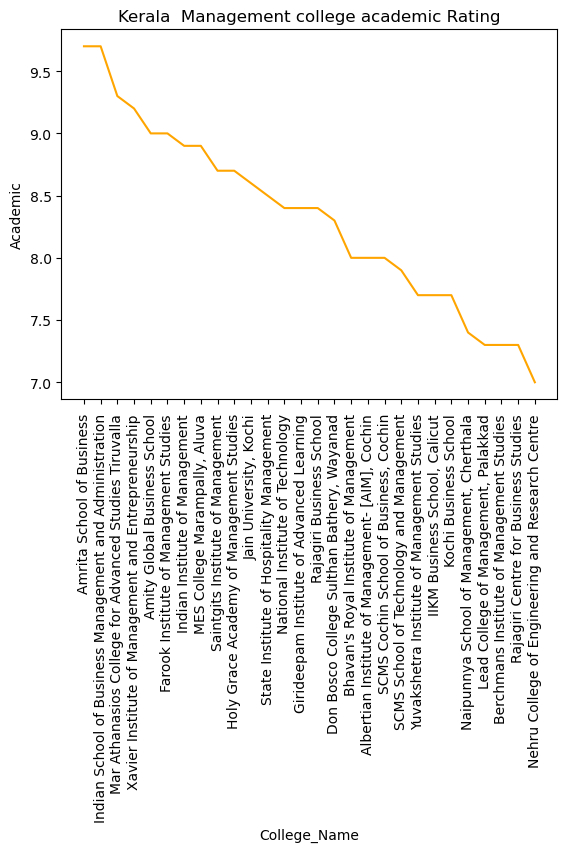

In [63]:
plt.xticks(rotation=90)
sns.lineplot(x='College_Name',y='Academic',data=management_kerala.sort_values(by='Academic',ascending=False),\
             color='orange')
plt.title("Kerala  Management college academic Rating")
plt.show()

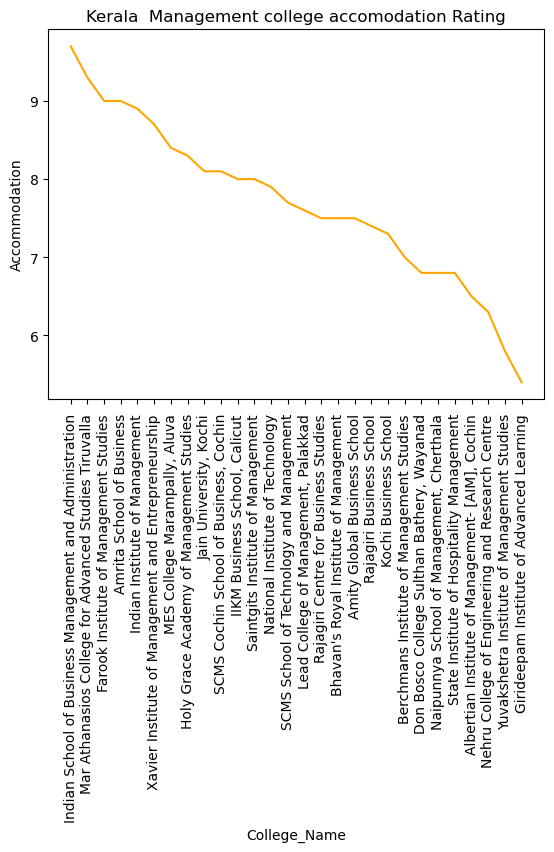

In [64]:
plt.xticks(rotation=90)
sns.lineplot(x='College_Name',y='Accommodation',data=management_kerala.sort_values(by='Accommodation',ascending=False),\
             color='orange')
plt.title("Kerala  Management college accomodation Rating")
plt.show()

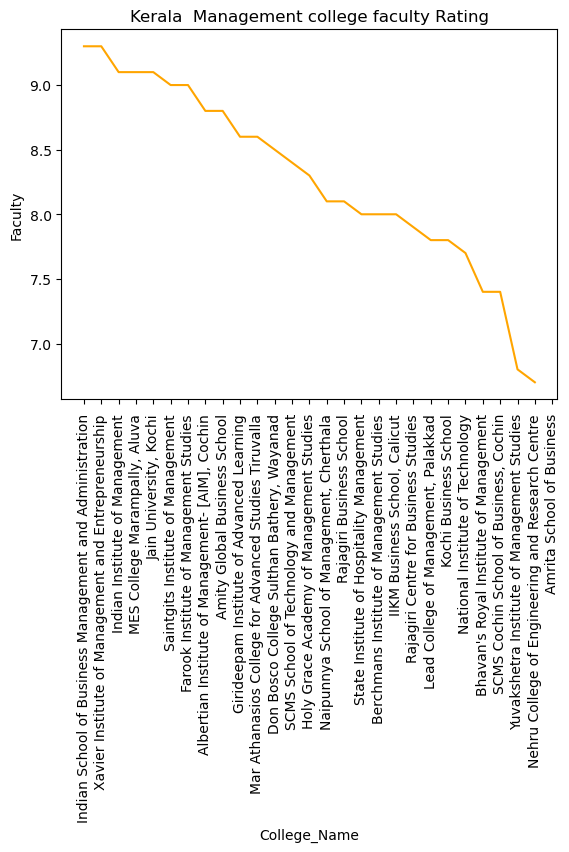

In [65]:
plt.xticks(rotation=90)
sns.lineplot(x='College_Name',y='Faculty',data=management_kerala.sort_values(by='Faculty',ascending=False),\
             color='orange')
plt.title("Kerala  Management college faculty Rating")
plt.show()

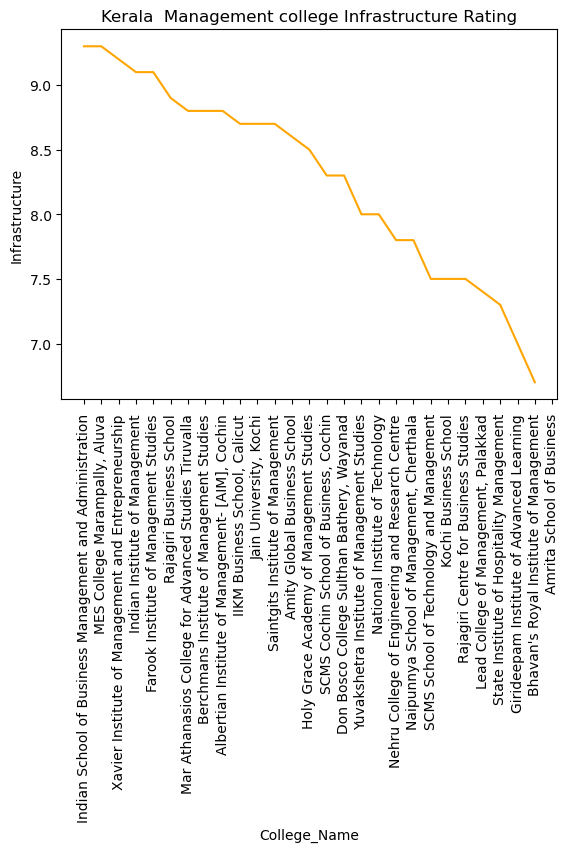

In [66]:
plt.xticks(rotation=90)
sns.lineplot(x='College_Name',y='Infrastructure',data=management_kerala.sort_values(by='Infrastructure',ascending=False),\
             color='orange')
plt.title("Kerala  Management college Infrastructure Rating")
plt.show()

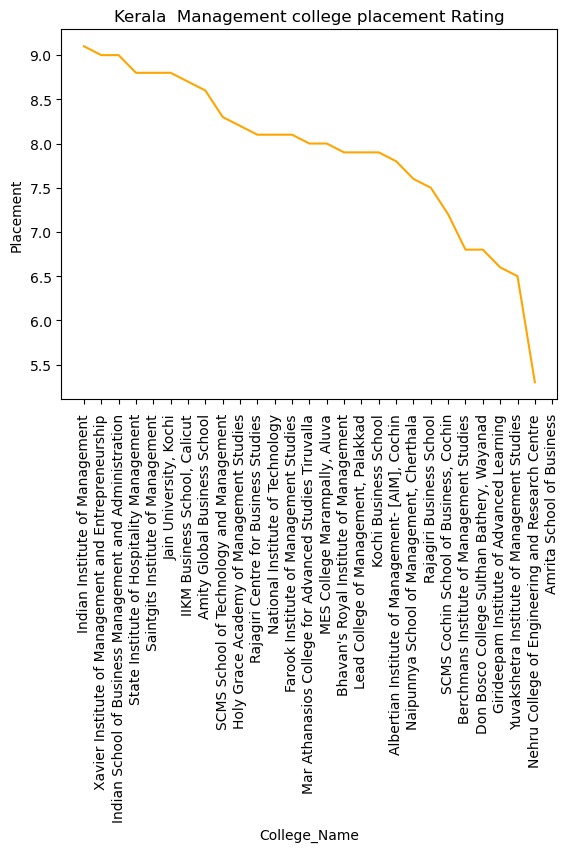

In [67]:
plt.xticks(rotation=90)
sns.lineplot(x='College_Name',y='Placement',data=management_kerala.sort_values(by='Placement',ascending=False),\
             color='orange')
plt.title("Kerala  Management college placement Rating")
plt.show()

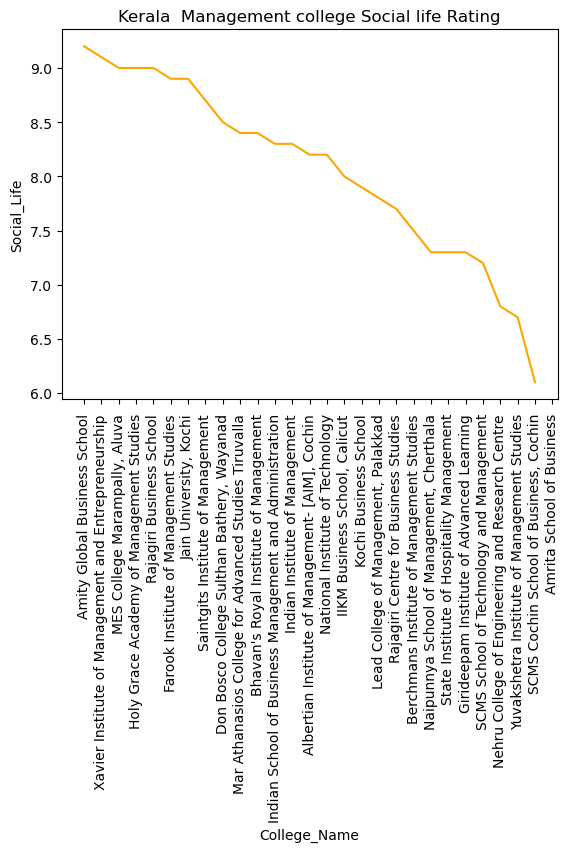

In [68]:
plt.xticks(rotation=90)
sns.lineplot(x='College_Name',y='Social_Life',data=management_kerala.sort_values(by='Social_Life',ascending=False),\
             color='orange')
plt.title("Kerala  Management college Social life Rating")
plt.show()

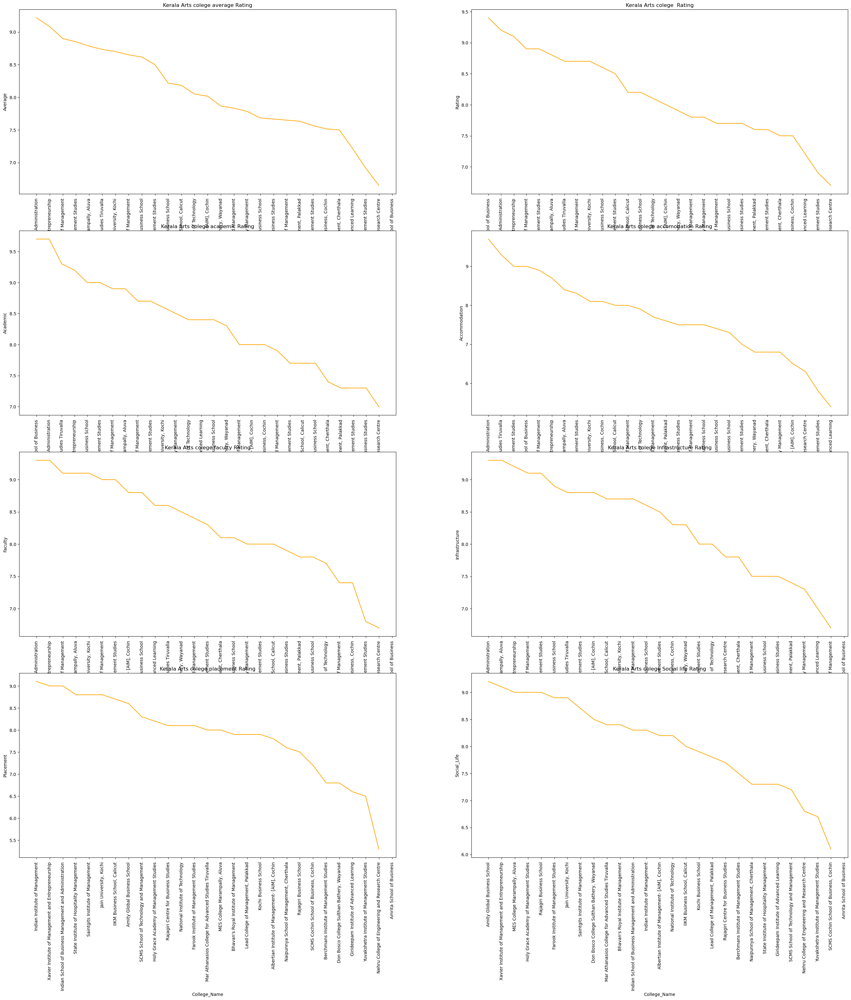

In [69]:
plt.figure(figsize=(34,35))
plt.subplot(4,2,1)
plt.xticks(rotation=90)
sns.lineplot(x='College_Name',y='Average',data=management_kerala.sort_values(by='Average',ascending=False),\
             color='orange')
plt.title("Kerala Arts colege average Rating")

plt.subplot(4,2,2)
plt.xticks(rotation=90)
sns.lineplot(x='College_Name',y='Rating',data=management_kerala.sort_values(by='Rating',ascending=False),\
             color='orange')
plt.title("Kerala Arts colege  Rating")

plt.subplot(4,2,3)
plt.xticks(rotation=90)
sns.lineplot(x='College_Name',y='Academic',data=management_kerala.sort_values(by='Academic',ascending=False),\
             color='orange')
plt.title("Kerala Arts colege academic Rating")

plt.subplot(4,2,4)
plt.xticks(rotation=90)
sns.lineplot(x='College_Name',y='Accommodation',data=management_kerala.sort_values(by='Accommodation',ascending=False),\
             color='orange')
plt.title("Kerala Arts colege accomodation Rating")

plt.subplot(4,2,5)
plt.xticks(rotation=90)
sns.lineplot(x='College_Name',y='Faculty',data=management_kerala.sort_values(by='Faculty',ascending=False),\
             color='orange')
plt.title("Kerala Arts colege faculty Rating")

plt.subplot(4,2,6)
plt.xticks(rotation=90)
sns.lineplot(x='College_Name',y='Infrastructure',data=management_kerala.sort_values(by='Infrastructure',ascending=False),\
             color='orange')
plt.title("Kerala Arts colege Infrastructure Rating")

plt.subplot(4,2,7)
plt.xticks(rotation=90)
sns.lineplot(x='College_Name',y='Placement',data=management_kerala.sort_values(by='Placement',ascending=False),\
             color='orange')
plt.title("Kerala Arts colege placement Rating")

plt.subplot(4,2,8)
plt.xticks(rotation=90)
sns.lineplot(x='College_Name',y='Social_Life',data=management_kerala.sort_values(by='Social_Life',ascending=False),\
             color='orange')
plt.title("Kerala Arts colege Social life Rating")

plt.show()

### Kerala Engineering colleges

In [70]:
Eng_kerala = kerala_data.query("Stream=='Engineering'").drop(columns=['Stream'])
Eng_kerala

,College_Name,UG_fee,PG_fee,Rating,Academic,Accommodation,Faculty,Infrastructure,Placement,Social_Life,Average
3362,Baselios Thomas I Catholicose College of Engin...,85000.0,NaN,7.4,7.5,8.0,8.5,7.0,6.5,7.0,7.416667
3363,"Cochin University of Science and Technology, S...",86040.0,52730.0,8.3,8.5,7.8,8.3,8.2,8.2,8.7,8.283333
3364,"College of Engineering, Trivandrum",200000.0,15725.0,8.4,8.6,7.8,8.0,8.5,8.4,8.8,8.350000
3365,Indian Institute of Space Science and Technology,142400.0,87400.0,8.1,8.9,7.8,8.5,8.6,7.7,7.2,8.116667
3366,National Institute of Technology,53797.0,27405.0,8.1,8.4,7.9,7.7,8.0,8.1,8.2,8.050000
3385,Cochin University of Science and Technology,46600.0,19290.0,7.9,8.4,7.5,7.8,7.8,7.7,8.1,7.883333
3396,APJ Abdul Kalam Technological University,29000.0,NaN,7.8,8.1,6.9,8.2,8.1,7.5,8.0,7.800000
3406,"Trinity College of Engineering, Trivendrum",75000.0,NaN,6.8,7.6,6.4,7.3,6.7,6.1,6.5,6.766667
3407,Sahrdaya College of Engineering,35000.0,77000.0,7.1,7.5,6.8,7.3,8.1,6.6,6.5,7.133333
3408,Rajagiri School of Engineering & Technology,87000.0,77000.0,8.2,8.4,8.0,8.2,9.0,8.6,6.9,8.183333


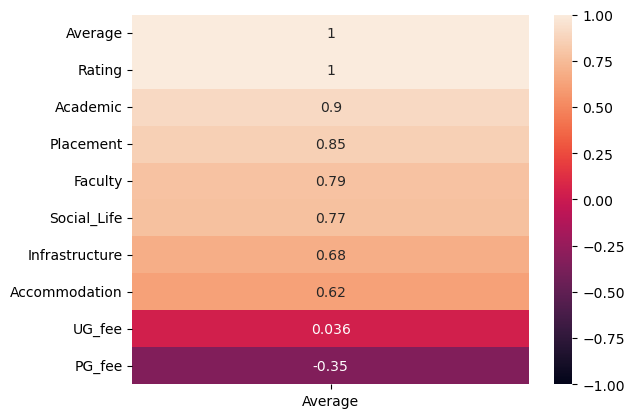

In [71]:
sns.heatmap(Eng_kerala.corr()[["Average"]].sort_values(by="Average",ascending=False),vmax=1,vmin=-1,annot=True)
plt.plot();

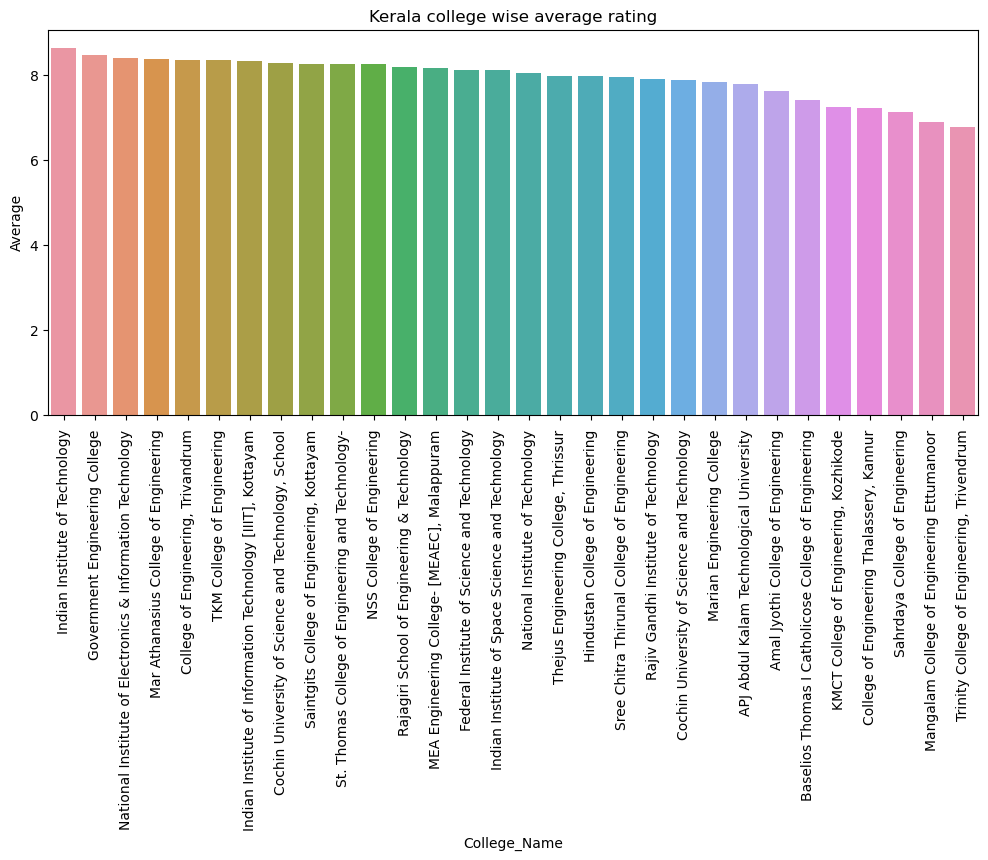

In [72]:
plt.figure(figsize=(12,5))
sns.barplot(data=(Eng_kerala.nlargest(50,columns='Average')),x='College_Name',y='Average')
plt.title("Kerala college wise average rating")
plt.xticks(rotation=90)
plt.show()

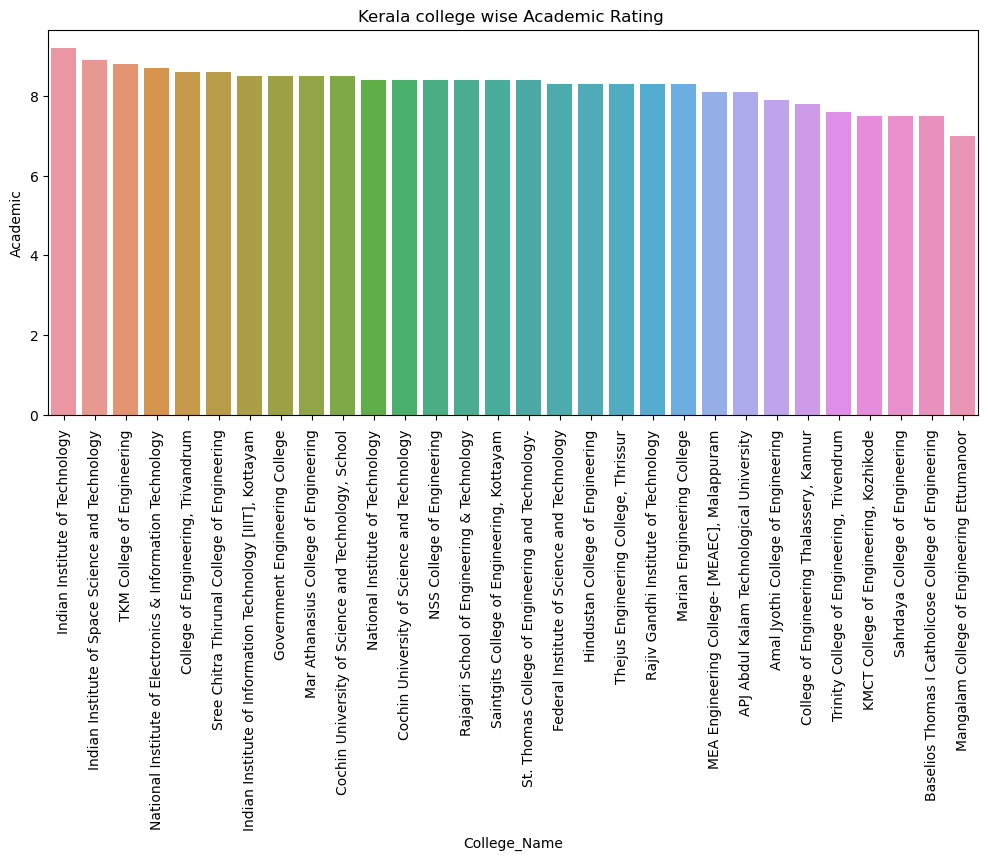

In [73]:
plt.figure(figsize=(12,5))
sns.barplot(data=(Eng_kerala.nlargest(50,columns='Academic')),x='College_Name',y='Academic')
plt.title("Kerala college wise Academic Rating ")
plt.xticks(rotation=90)
plt.show()

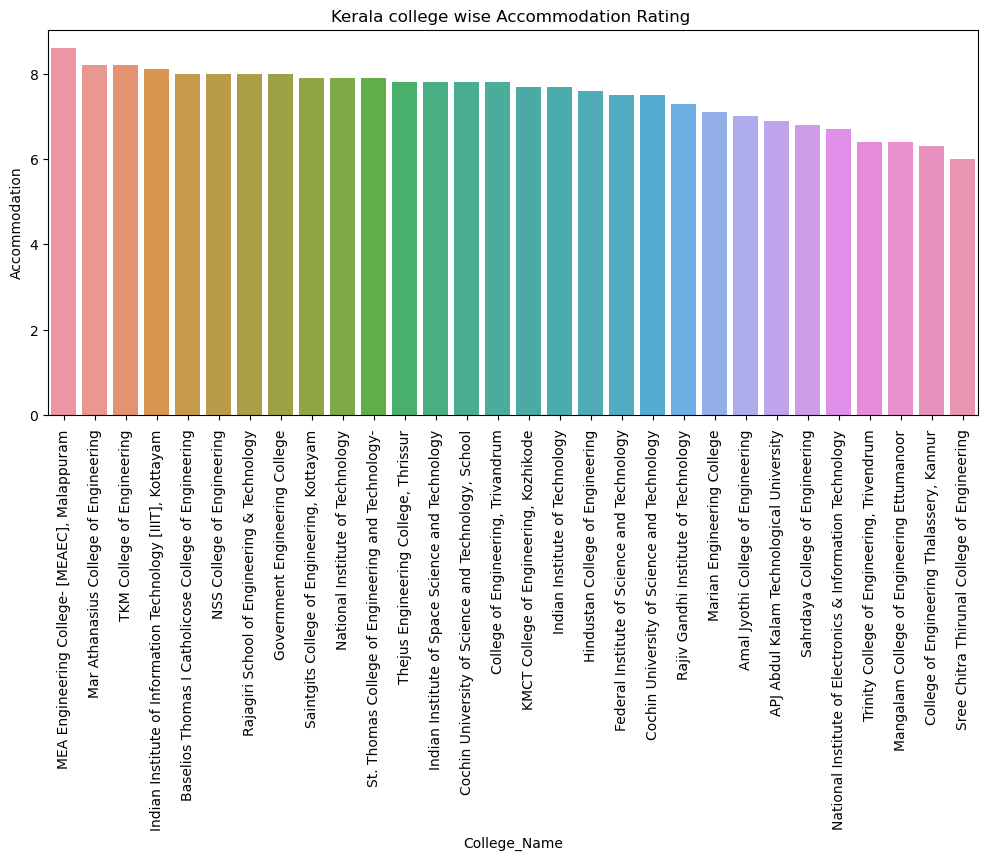

In [74]:
plt.figure(figsize=(12,5))
sns.barplot(data=(Eng_kerala.nlargest(50,columns='Accommodation')),x='College_Name',y='Accommodation')
plt.title("Kerala college wise Accommodation Rating ")
plt.xticks(rotation=90)
plt.show()

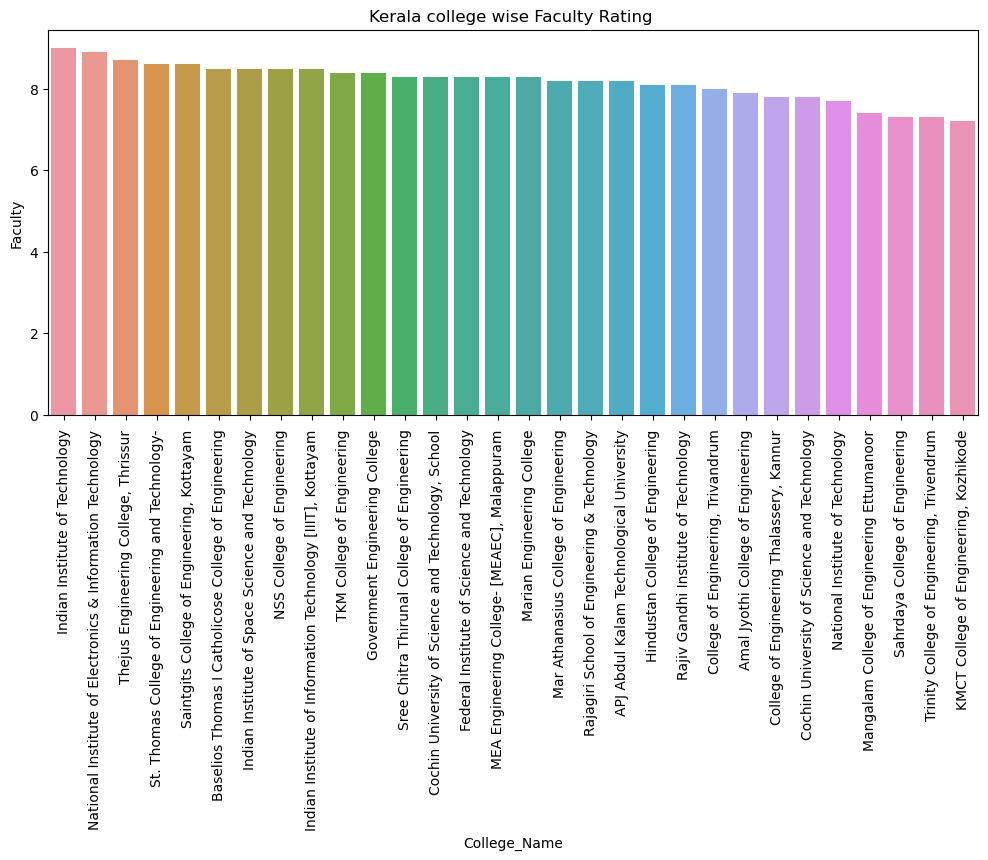

In [75]:
plt.figure(figsize=(12,5))
sns.barplot(data=(Eng_kerala.nlargest(50,columns='Faculty')),x='College_Name',y='Faculty')
plt.title("Kerala college wise Faculty Rating ")
plt.xticks(rotation=90)
plt.show()

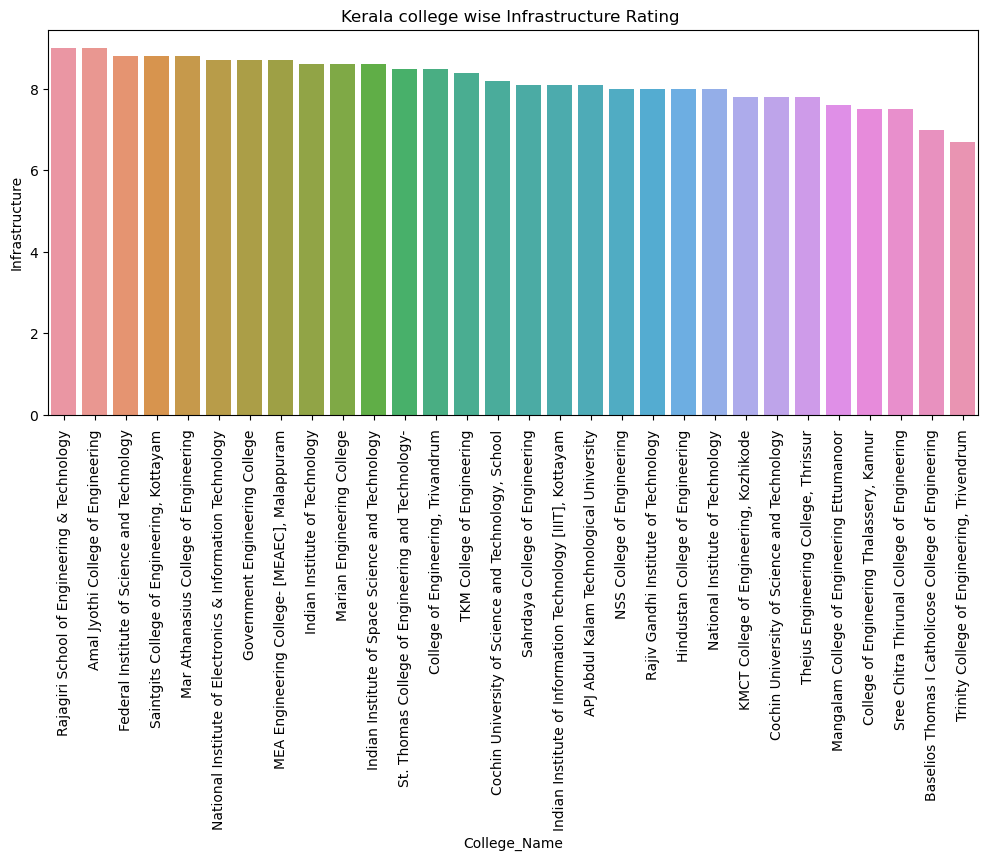

In [76]:
plt.figure(figsize=(12,5))
sns.barplot(data=(Eng_kerala.nlargest(50,columns='Infrastructure')),x='College_Name',y='Infrastructure')
plt.title("Kerala college wise Infrastructure Rating ")
plt.xticks(rotation=90)
plt.show()

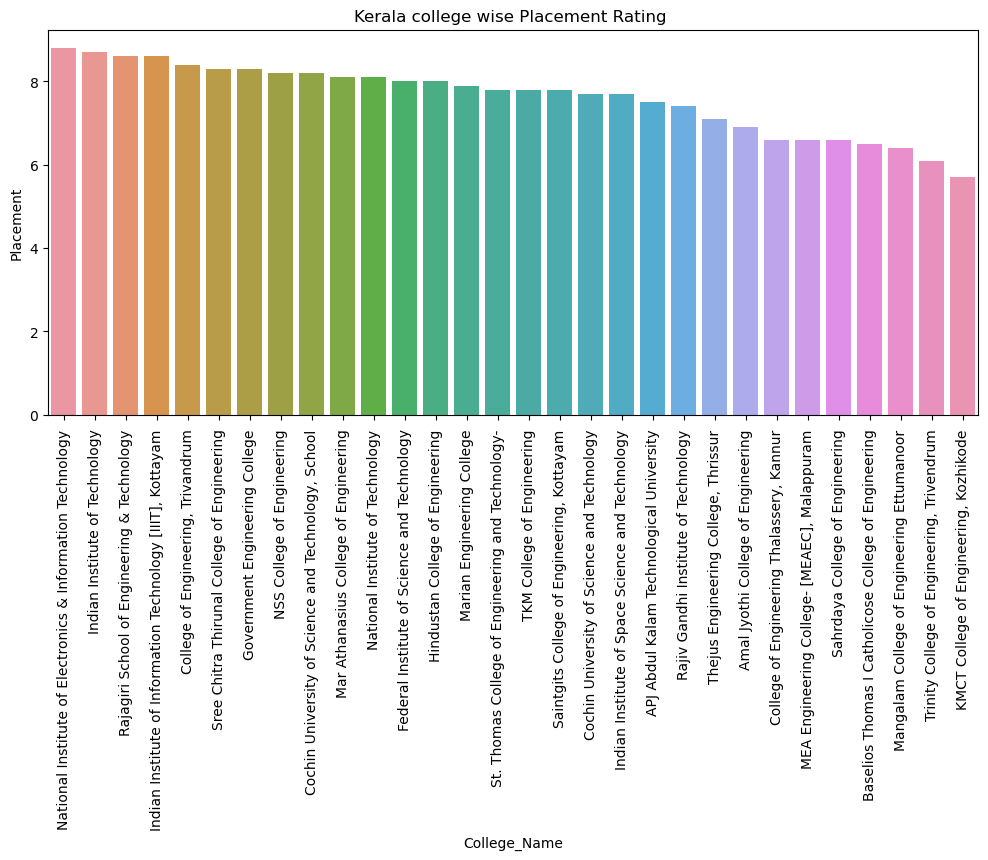

In [77]:
plt.figure(figsize=(12,5))
sns.barplot(data=(Eng_kerala.nlargest(50,columns='Placement')),x='College_Name',y='Placement')
plt.title("Kerala college wise Placement Rating ")
plt.xticks(rotation=90)
plt.show()

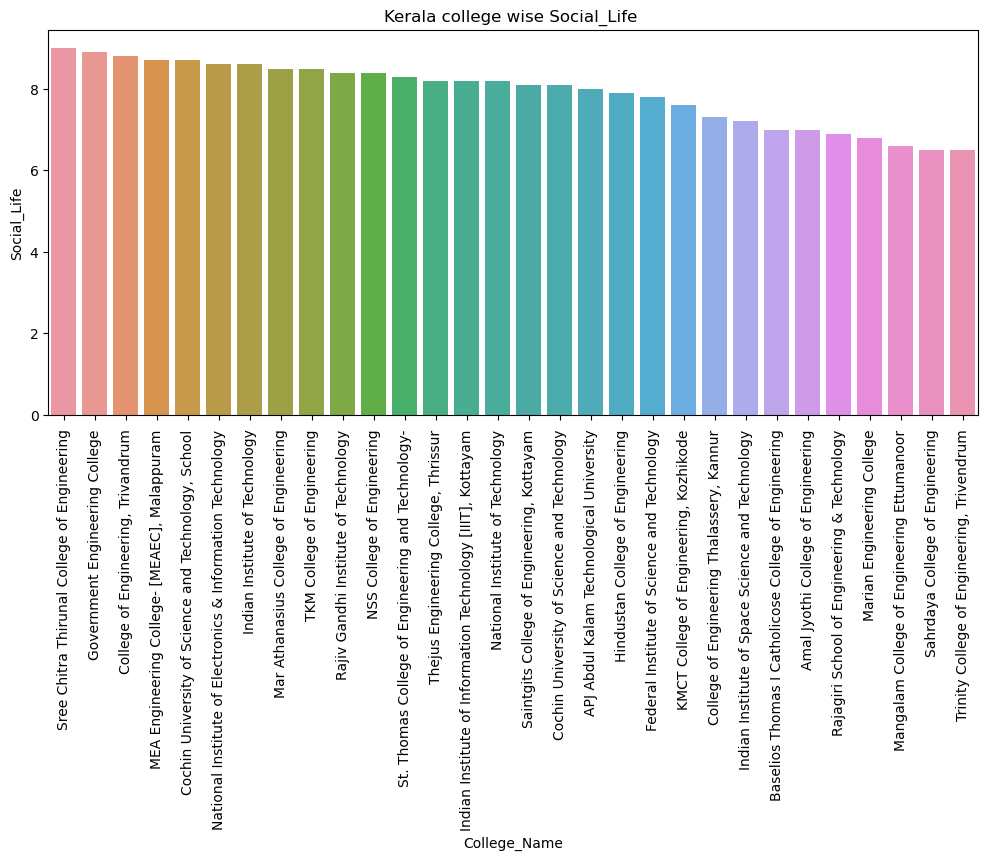

In [78]:
plt.figure(figsize=(12,5))
sns.barplot(data=(Eng_kerala.nlargest(50,columns='Social_Life')),x='College_Name',y='Social_Life')
plt.title("Kerala college wise Social_Life ")
plt.xticks(rotation=90)
plt.show()

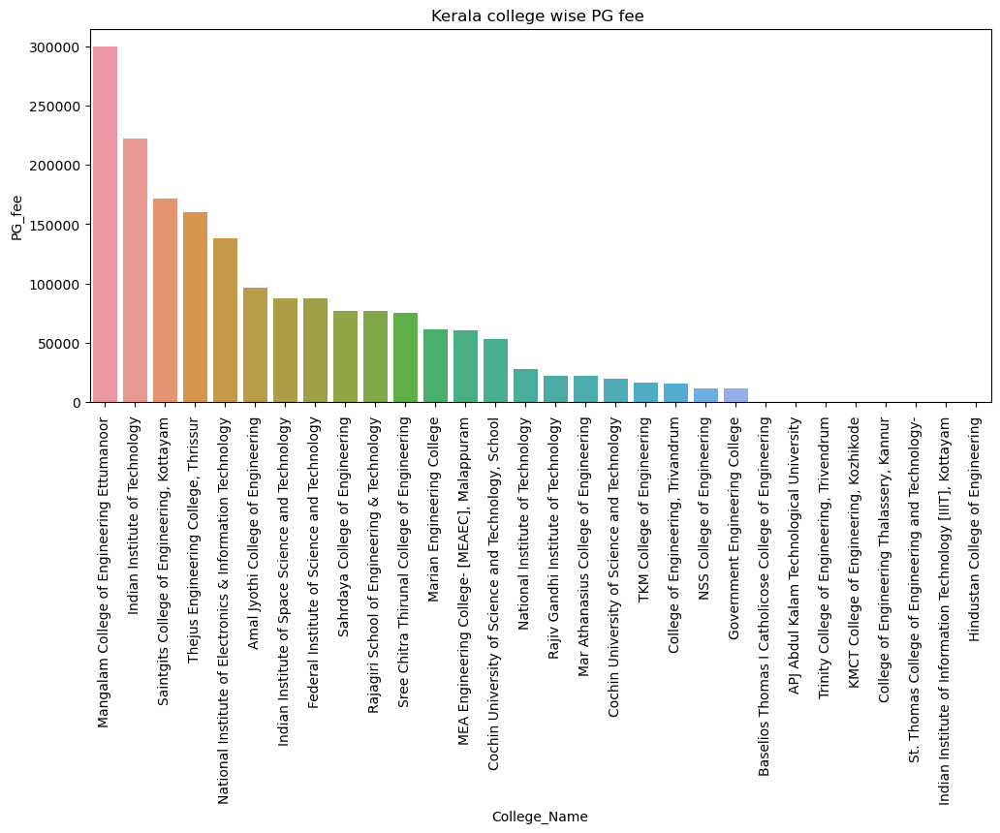

In [79]:
plt.figure(figsize=(12,5))
sns.barplot(data=(Eng_kerala.nlargest(50,columns='PG_fee')),x='College_Name',y='PG_fee')
plt.title("Kerala college wise PG fee ")
plt.xticks(rotation=90)
plt.show()

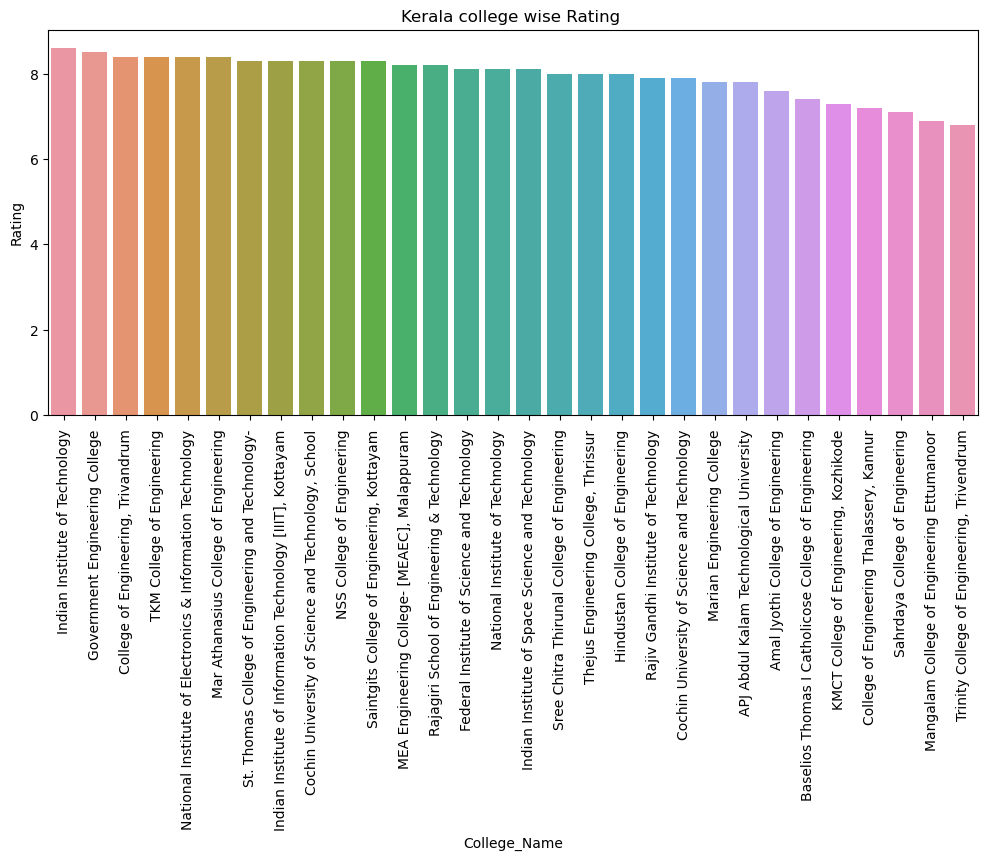

In [80]:
plt.figure(figsize=(12,5))
sns.barplot(data=(Eng_kerala.nlargest(50,columns='Rating')),x='College_Name',y='Rating')
plt.title("Kerala college wise Rating ")
plt.xticks(rotation=90)
plt.show()

In [81]:
science_kerala = kerala_data.query("Stream=='Science'").drop(columns=['Stream'])
science_kerala

,College_Name,UG_fee,PG_fee,Rating,Academic,Accommodation,Faculty,Infrastructure,Placement,Social_Life,Average
3292,"St Teresa's College (Autonomous), Ernakulam",3500.0,7000.0,8.4,8.9,7.4,9.0,8.2,7.7,9.3,8.416667
3431,"Mar Ivanios College, Thiruvananthapuram",4065.0,4725.0,8.3,8.7,8.1,8.7,8.8,6.6,9.0,8.316667
3432,"Mahatma Gandhi College, Trivandrum",2800.0,84376.0,8.1,8.7,7.5,8.6,8.8,5.9,8.9,8.066667
3433,"Government Arts College, Thiruvananthapuram",NaN,NaN,7.8,9.3,6.3,9.0,8.0,6.5,7.5,7.766667
3434,"Farook College, Kozhikode",3190.0,5020.0,8.1,8.7,8.1,8.5,8.5,5.8,9.0,8.100000
3435,T.K.M. College of Arts and Science,22500.0,37500.0,8.0,8.1,7.5,8.1,8.3,7.5,8.6,8.016667
3436,"St Joseph's College Devagiri, Calicut",71300.0,38000.0,8.4,8.8,7.7,8.7,8.7,7.4,9.0,8.383333
3437,"Fatima Mata National College, Kollam",3805.0,5090.0,8.2,8.7,6.3,8.7,9.3,6.9,9.3,8.200000
3438,"Christ College Irinjalakuda, Thrissur",871000.0,970000.0,8.0,8.3,7.7,8.2,8.4,7.2,8.3,8.016667
3439,"Mar Thoma College, Tiruvalla",NaN,NaN,7.2,7.6,6.7,8.3,7.4,5.2,7.7,7.150000


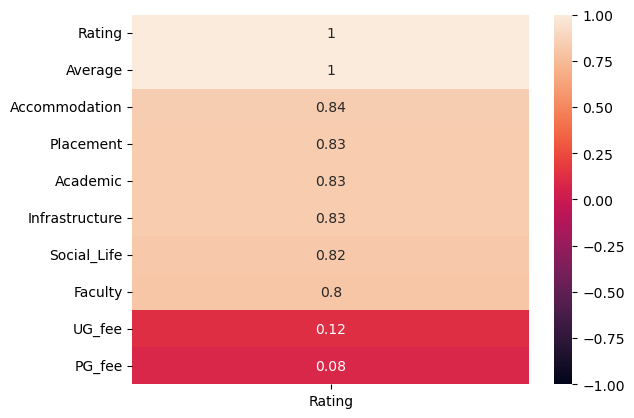

In [82]:
sns.heatmap(data.corr()[["Rating"]].sort_values(by="Rating",ascending=False),vmax=1,vmin=-1,annot=True)
plt.plot();

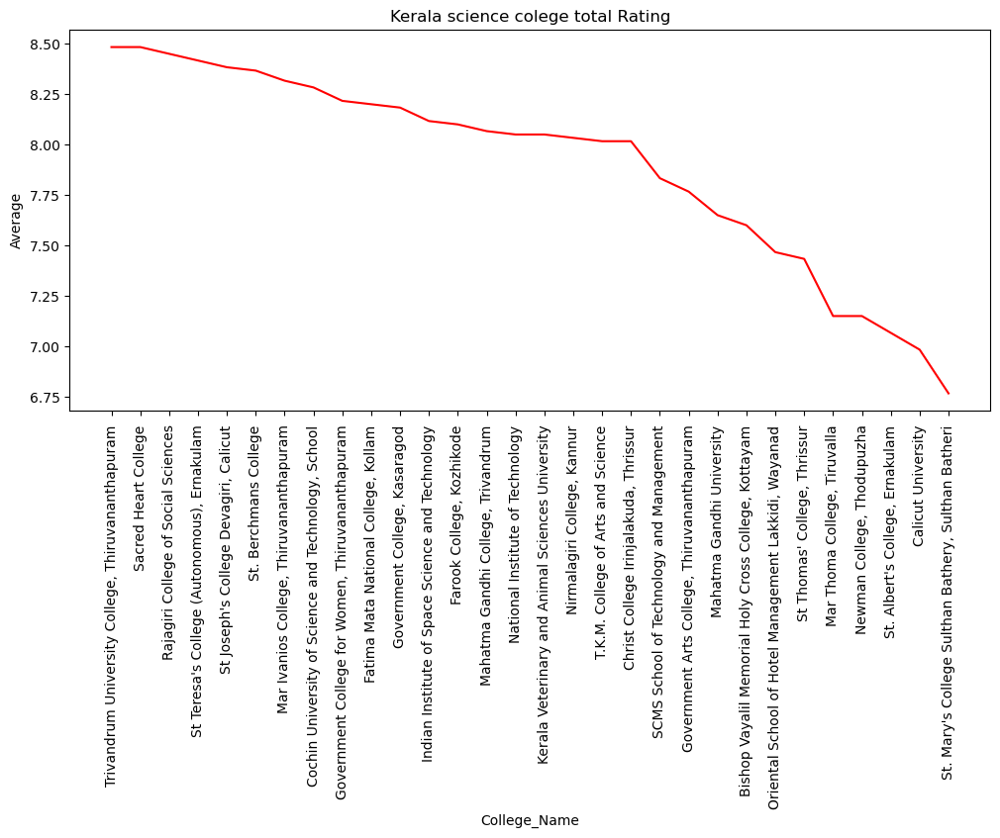

In [83]:
plt.figure(figsize=(12,5))
plt.xticks(rotation=90)
sns.lineplot(x='College_Name',y='Average',data=science_kerala.sort_values(by='Average',ascending=False),\
             color='red')
plt.title("Kerala science colege total Rating")
plt.show()

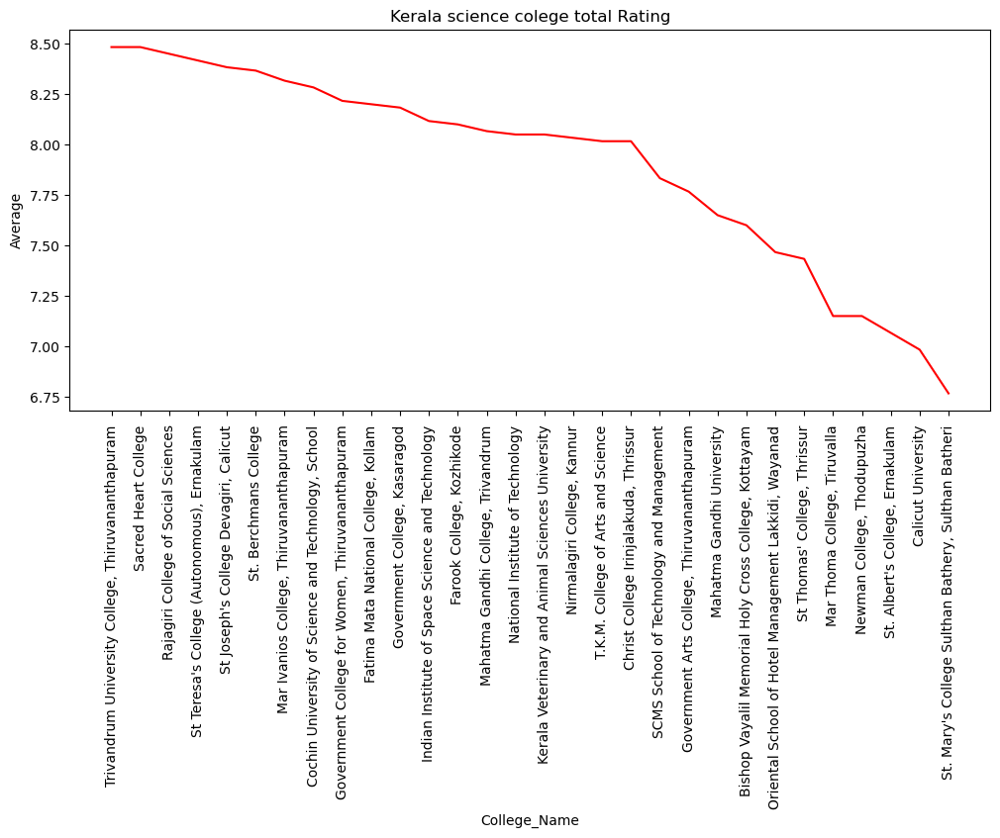

In [84]:
plt.figure(figsize=(12,5))
plt.xticks(rotation=90)
sns.lineplot(x='College_Name',y='Average',data=science_kerala.sort_values(by='Average',ascending=False),\
             color='red')
plt.title("Kerala science colege total Rating")
plt.show()

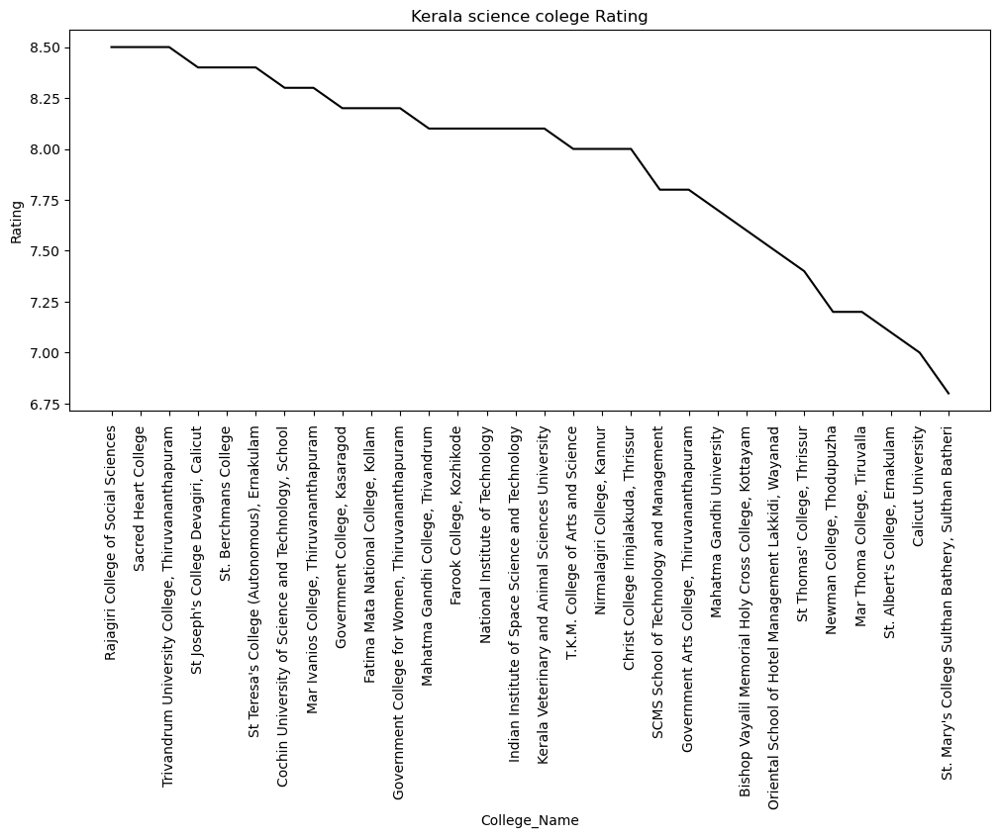

In [85]:
plt.figure(figsize=(12,5))
plt.xticks(rotation=90)
sns.lineplot(x='College_Name',y='Rating',data=science_kerala.sort_values(by='Rating',ascending=False),\
             color='black')
plt.title("Kerala science colege Rating")
plt.show()

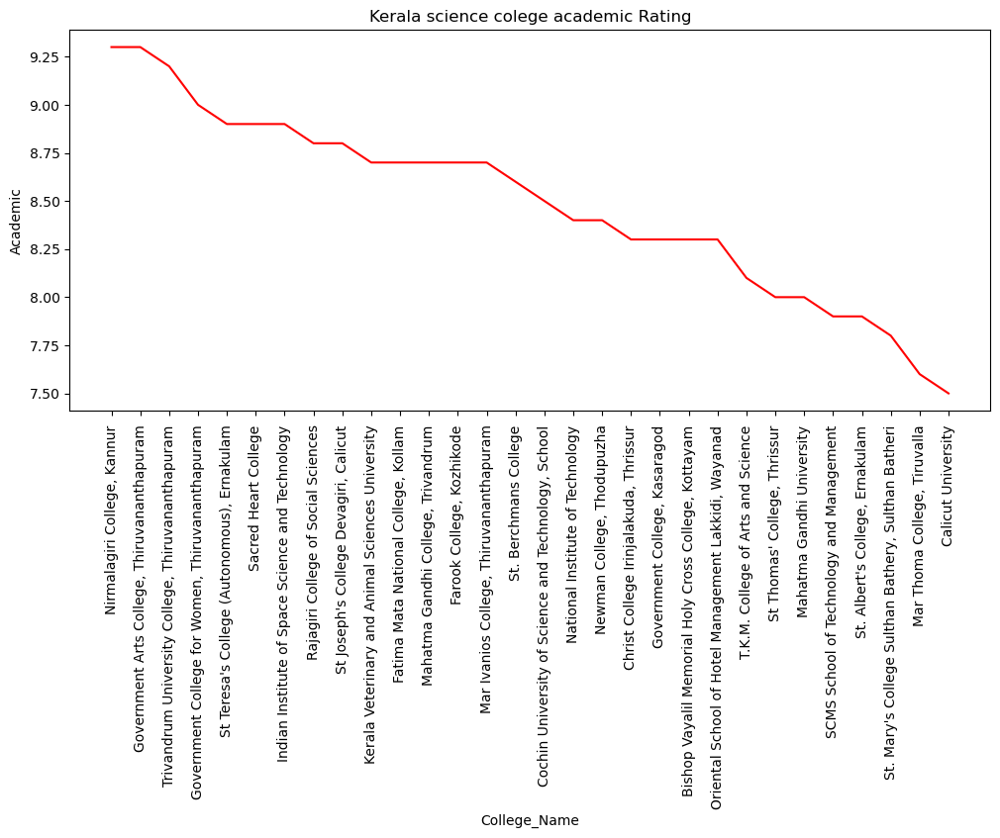

In [86]:
plt.figure(figsize=(12,5))
plt.xticks(rotation=90)
sns.lineplot(x='College_Name',y='Academic',data=science_kerala.sort_values(by='Academic',ascending=False),\
             color='red')
plt.title("Kerala science colege academic Rating")
plt.show()

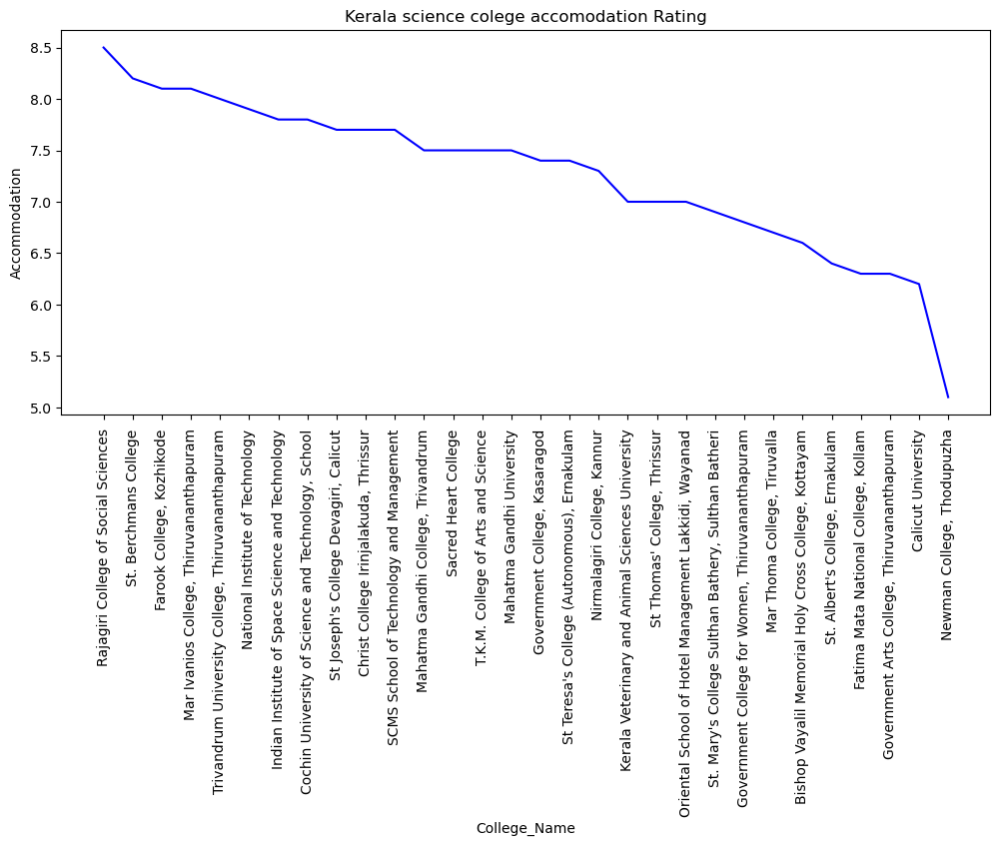

In [87]:
plt.figure(figsize=(12,5))
plt.xticks(rotation=90)
sns.lineplot(x='College_Name',y='Accommodation',data=science_kerala.sort_values(by='Accommodation',ascending=False),\
             color='blue')
plt.title("Kerala science colege accomodation Rating")
plt.show()

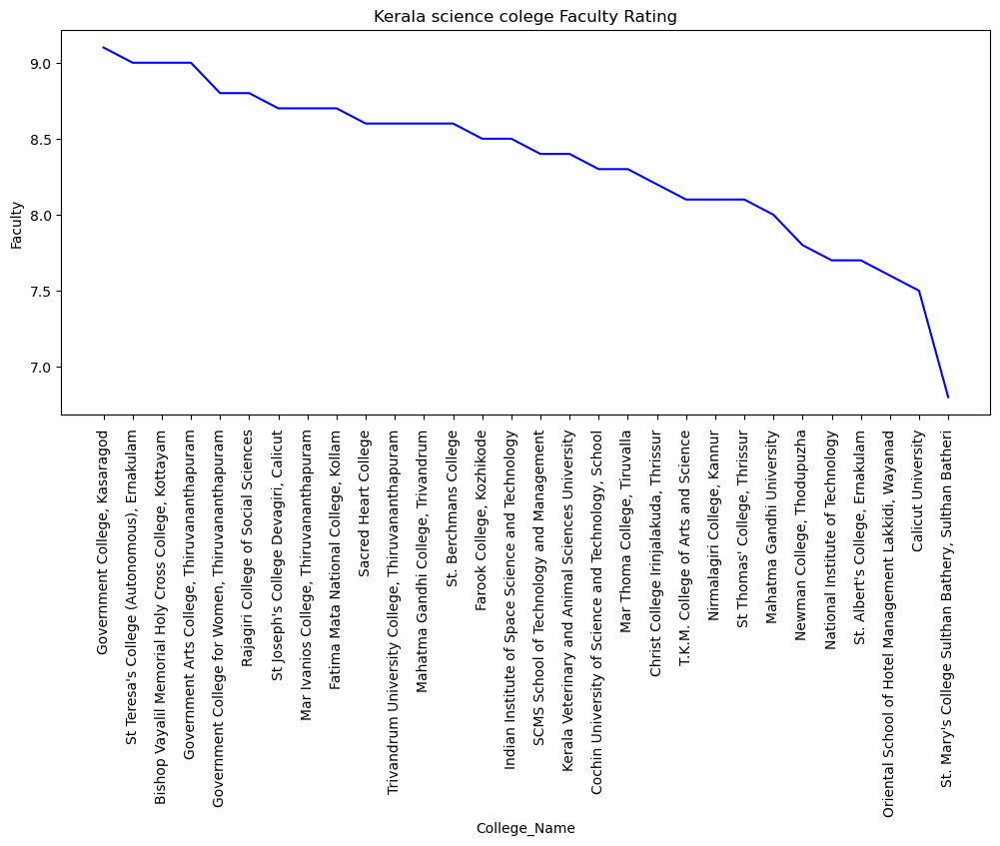

In [88]:
plt.figure(figsize=(12,5))
plt.xticks(rotation=90)
sns.lineplot(x='College_Name',y='Faculty',data=science_kerala.sort_values(by='Faculty',ascending=False),\
             color='blue')
plt.title("Kerala science colege Faculty Rating")
plt.show()

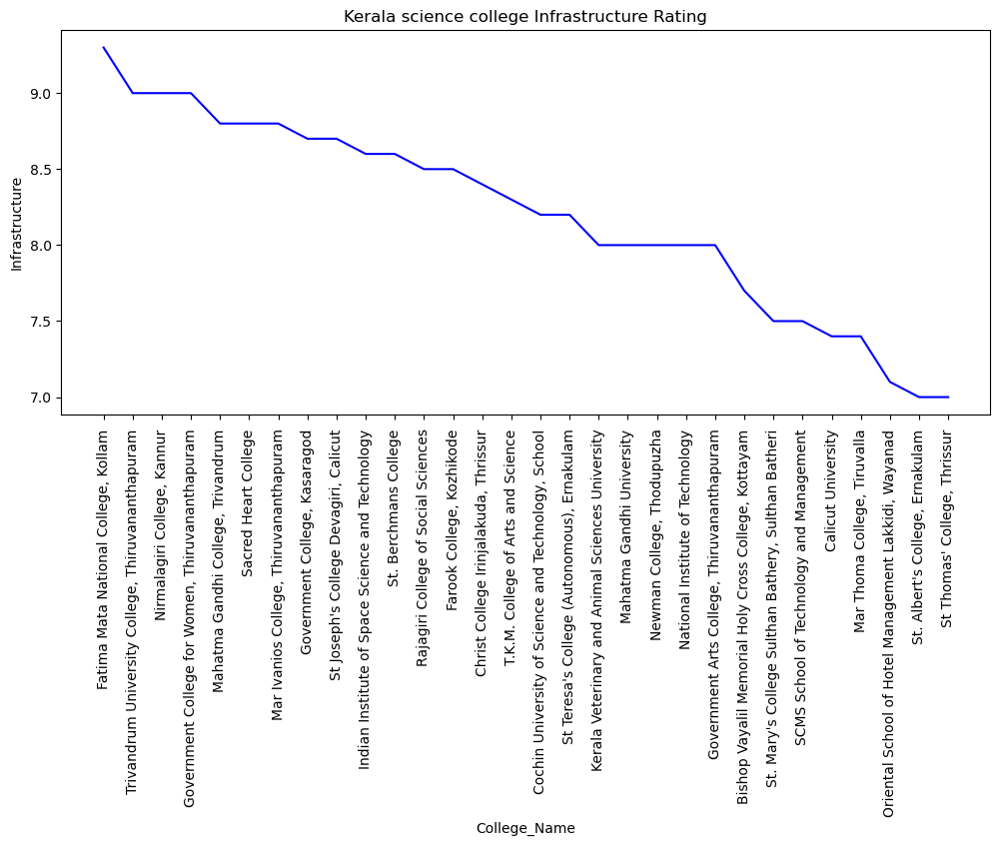

In [89]:
plt.figure(figsize=(12,5))
plt.xticks(rotation=90)
sns.lineplot(x='College_Name',y='Infrastructure',data=science_kerala.sort_values(by='Infrastructure',ascending=False),\
             color='blue')
plt.title("Kerala science college Infrastructure Rating")
plt.show()

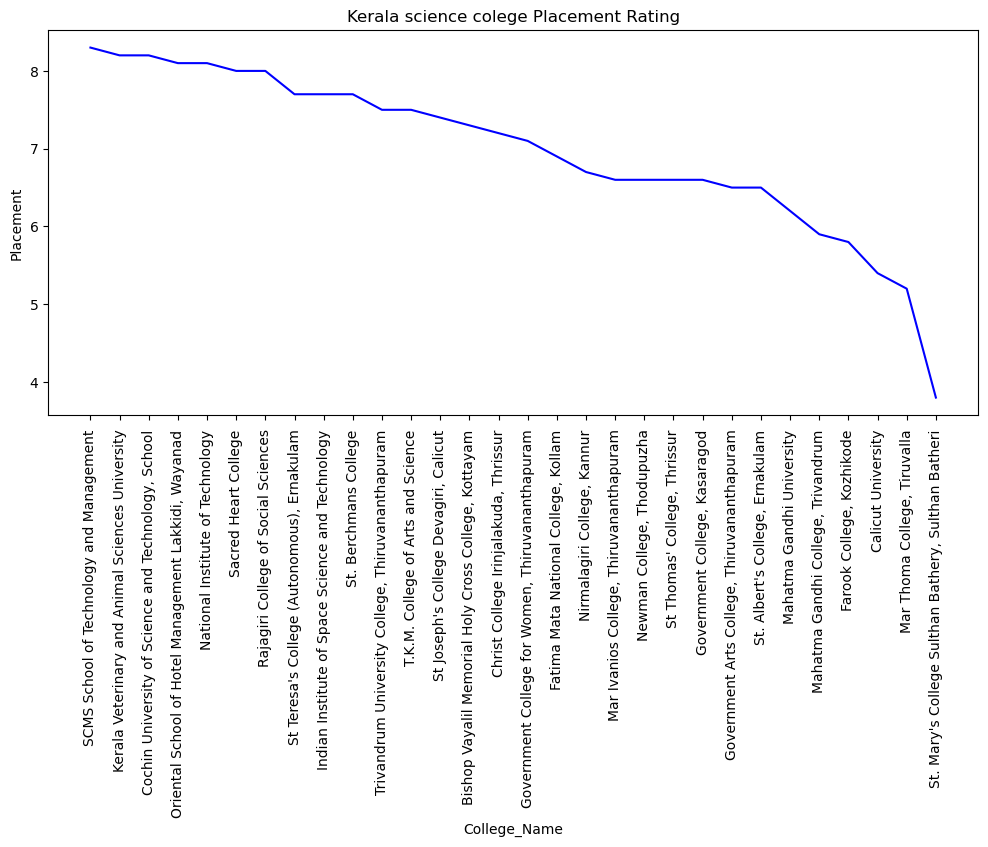

In [90]:
plt.figure(figsize=(12,5))
plt.xticks(rotation=90)
sns.lineplot(x='College_Name',y='Placement',data=science_kerala.sort_values(by='Placement',ascending=False),\
             color='blue')
plt.title("Kerala science colege Placement Rating")
plt.show()

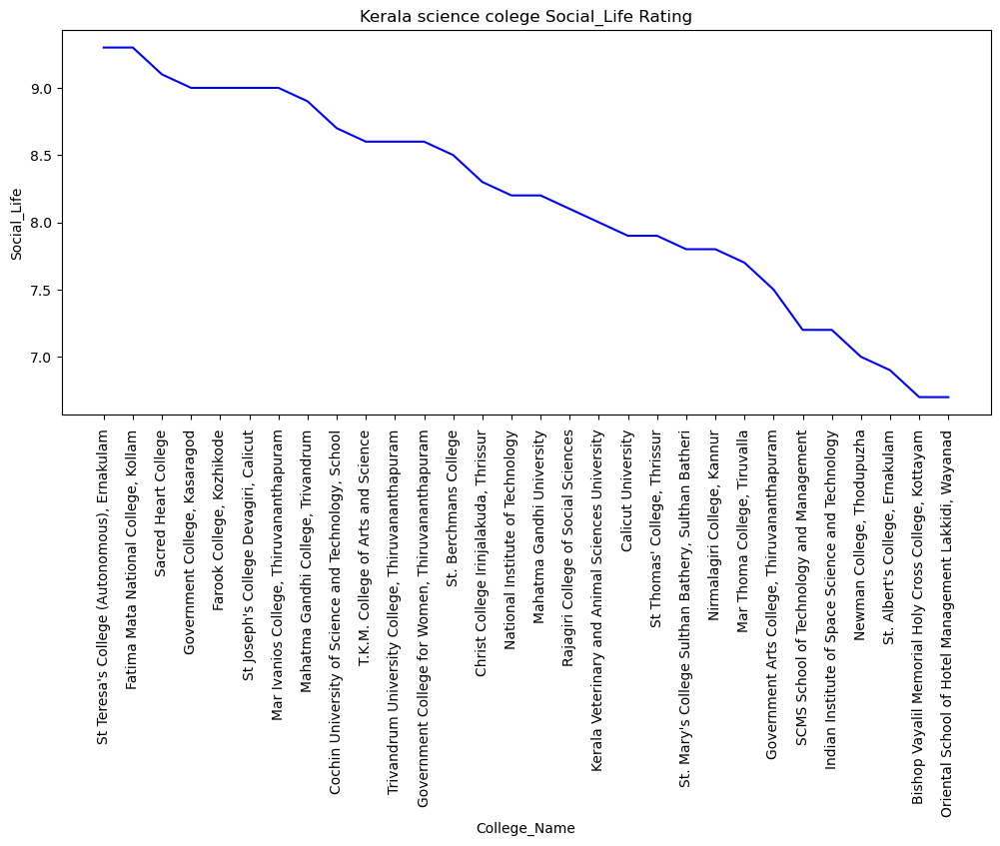

In [91]:
plt.figure(figsize=(12,5))
plt.xticks(rotation=90)
sns.lineplot(x='College_Name',y='Social_Life',data=science_kerala.sort_values(by='Social_Life',ascending=False),\
             color='blue')
plt.title("Kerala science colege Social_Life Rating")
plt.show()

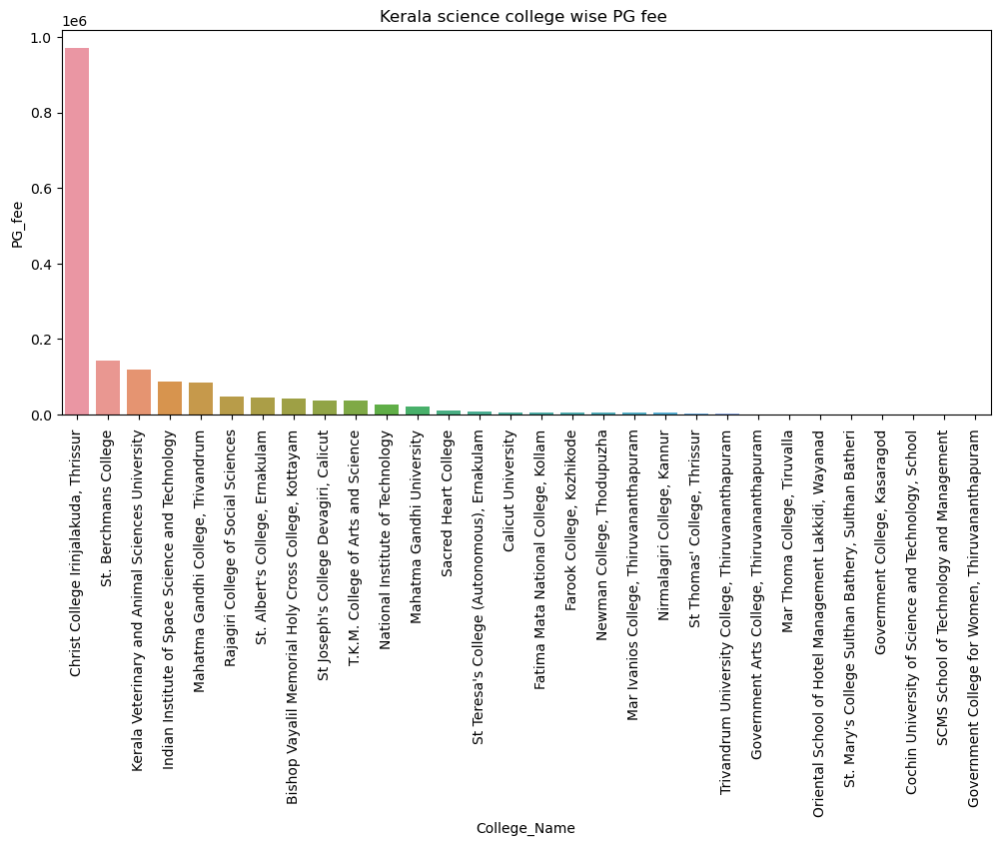

In [92]:
plt.figure(figsize=(12,5))
sns.barplot(data=(science_kerala.nlargest(50,columns='PG_fee')),x='College_Name',y='PG_fee')
plt.title("Kerala science college wise PG fee ")
plt.xticks(rotation=90)
plt.show()

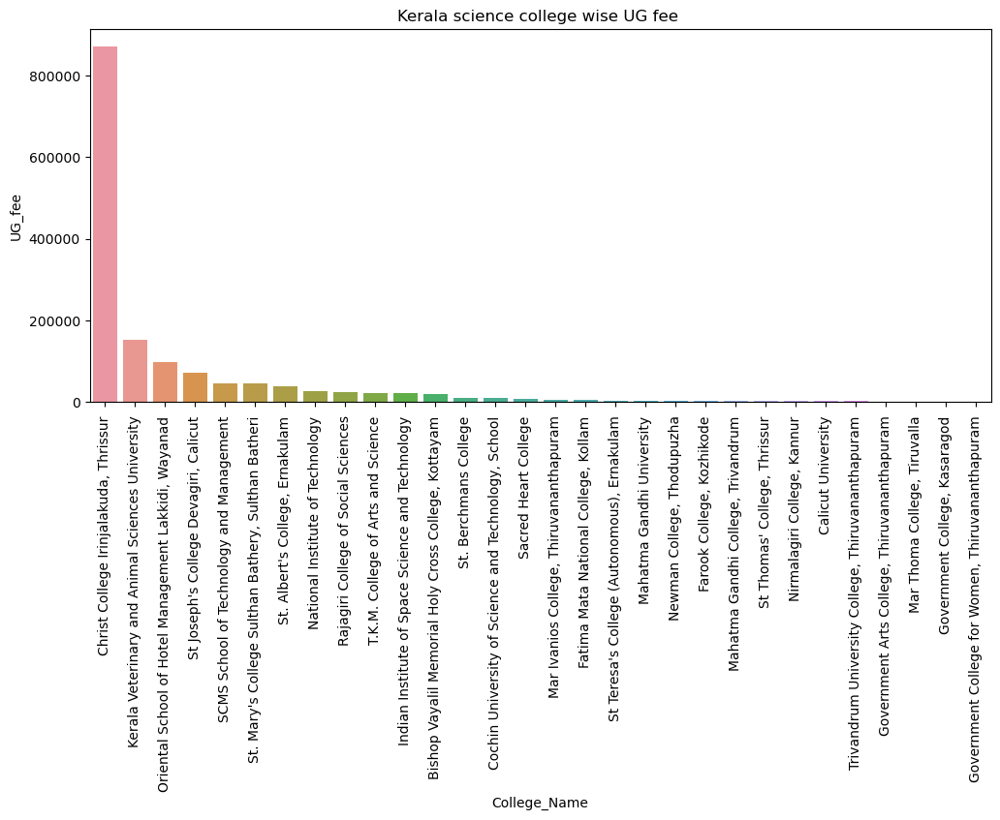

In [93]:
plt.figure(figsize=(12,5))
sns.barplot(data=(science_kerala.nlargest(50,columns='UG_fee')),x='College_Name',y='UG_fee')
plt.title("Kerala science college wise UG fee ")
plt.xticks(rotation=90)
plt.show()

In [94]:
commerce_kerala = kerala_data.query("Stream=='Commerce'").drop(columns=['Stream'])
commerce_kerala

,College_Name,UG_fee,PG_fee,Rating,Academic,Accommodation,Faculty,Infrastructure,Placement,Social_Life,Average
3174,Jai Bharath Arts and Science College,NaN,NaN,6.4,6.6,6.6,6.7,6.2,6.0,6.5,6.433333
3175,"Gems Arts and Science College, Malappuram",NaN,NaN,7.8,8.2,6.5,8.3,8.3,6.2,9.1,7.766667
3176,Cochin University of Science and Technology,7915.0,NaN,7.9,8.4,7.5,7.8,7.8,7.7,8.1,7.883333
3181,"AV Abdurahiman Haji Arts & Science College,",24645.0,44130.0,5.4,6.8,3.8,6.0,6.8,2.8,6.0,5.366667
3182,T.K.M. College of Arts and Science,18000.0,37500.0,8.0,8.1,7.5,8.1,8.3,7.5,8.6,8.016667
3210,Amrita School of Arts and Sciences,86500.0,84900.0,7.4,8.5,6.2,8.5,7.2,8.0,6.1,7.416667
3211,"Newman College, Thodupuzha",23903.0,3793.0,7.2,8.4,5.1,7.8,8.0,6.6,7.0,7.150000
3212,"Farook College, Kozhikode",2290.0,3760.0,8.1,8.7,8.1,8.5,8.5,5.8,9.0,8.100000
3213,"Mahatma Gandhi College, Trivandrum",2250.0,3390.0,8.1,8.7,7.5,8.6,8.8,5.9,8.9,8.066667
3214,"St Teresa's College (Autonomous), Ernakulam",5000.0,37500.0,8.4,8.9,7.4,9.0,8.2,7.7,9.3,8.416667


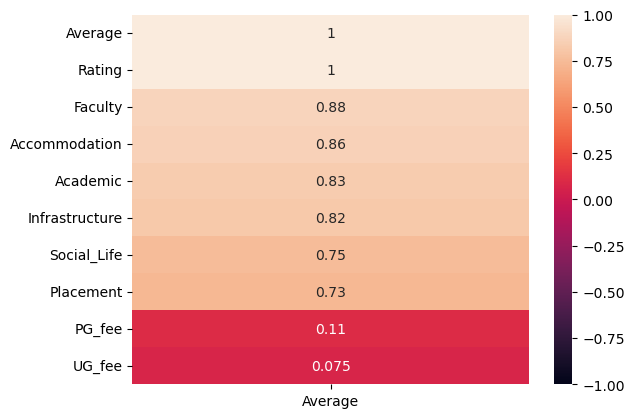

In [95]:
sns.heatmap(commerce_kerala.corr()[["Average"]].sort_values(by="Average",ascending=False),vmax=1,vmin=-1,annot=True)
plt.plot();

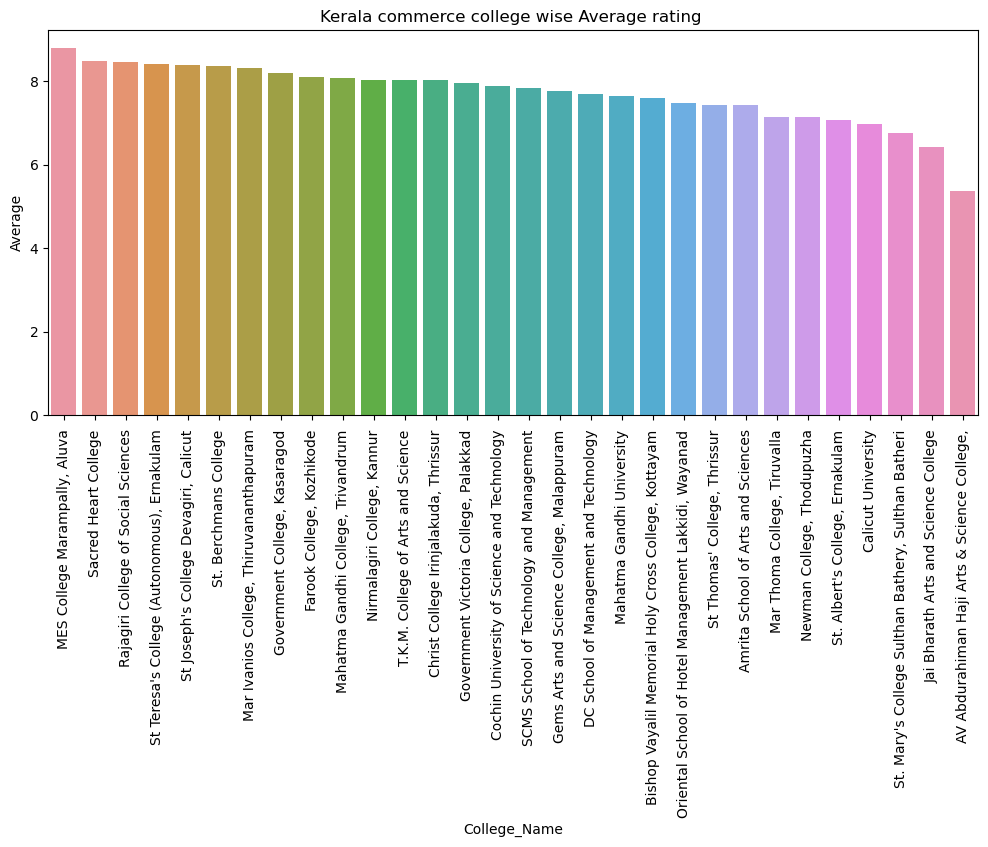

In [96]:
plt.figure(figsize=(12,5))
sns.barplot(data=(commerce_kerala.nlargest(50,columns='Average')),x='College_Name',y='Average')
plt.title("Kerala commerce college wise Average rating ")
plt.xticks(rotation=90)
plt.show()

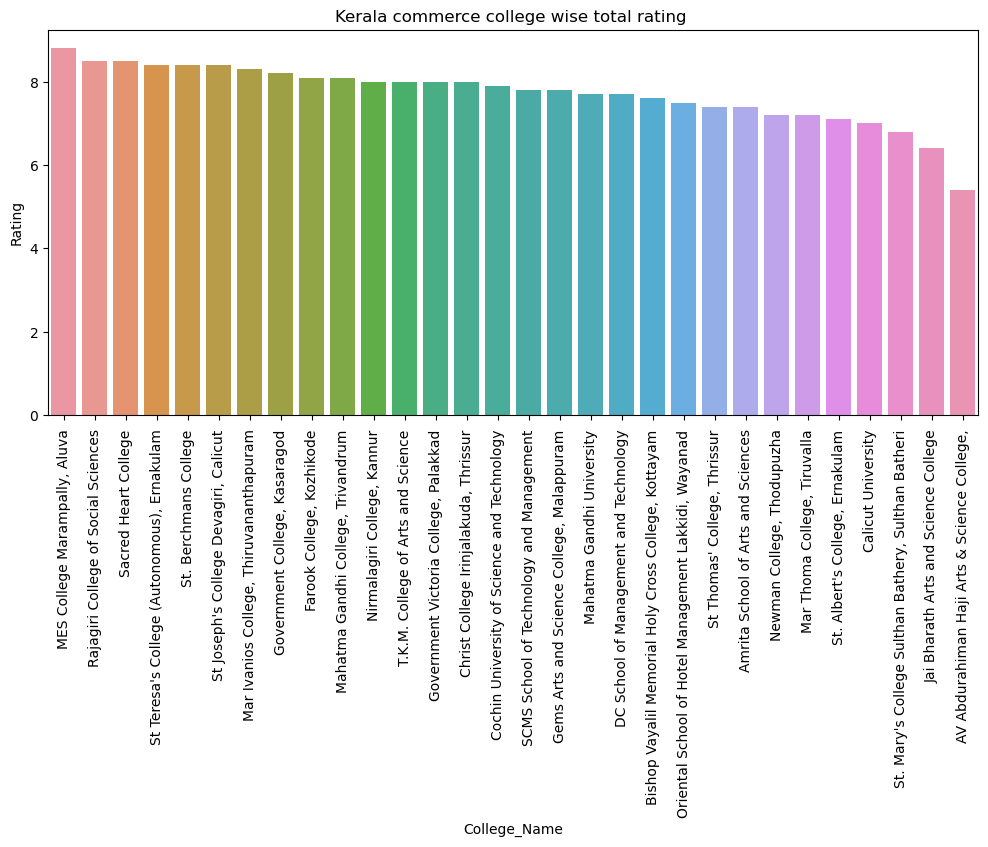

In [97]:
plt.figure(figsize=(12,5))
sns.barplot(data=(commerce_kerala.nlargest(50,columns='Rating')),x='College_Name',y='Rating')
plt.title("Kerala commerce college wise total rating ")
plt.xticks(rotation=90)
plt.show()

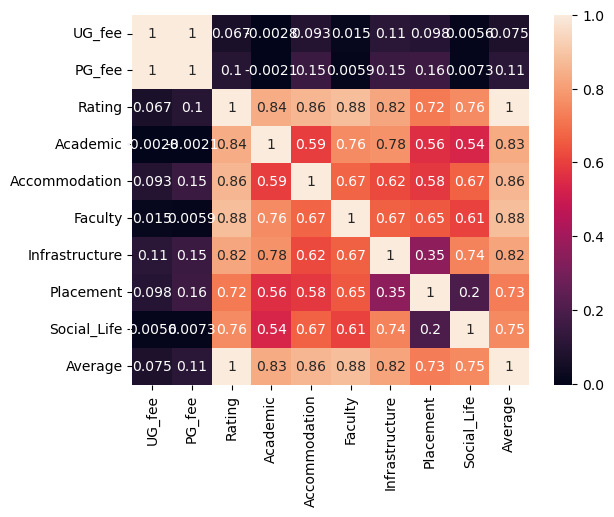

In [98]:
sns.heatmap(commerce_kerala.corr(), annot=True)
plt.show()


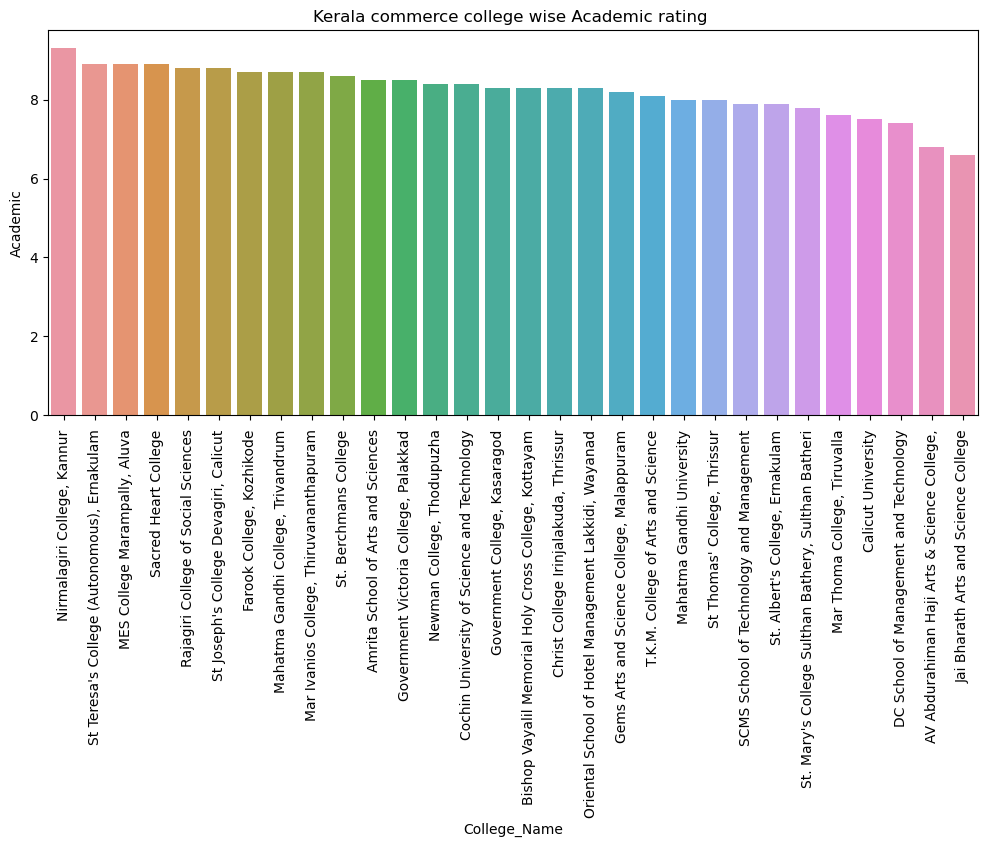

In [99]:
plt.figure(figsize=(12,5))
sns.barplot(data=(commerce_kerala.nlargest(50,columns='Academic')),x='College_Name',y='Academic')
plt.title("Kerala commerce college wise Academic rating ")
plt.xticks(rotation=90)
plt.show()

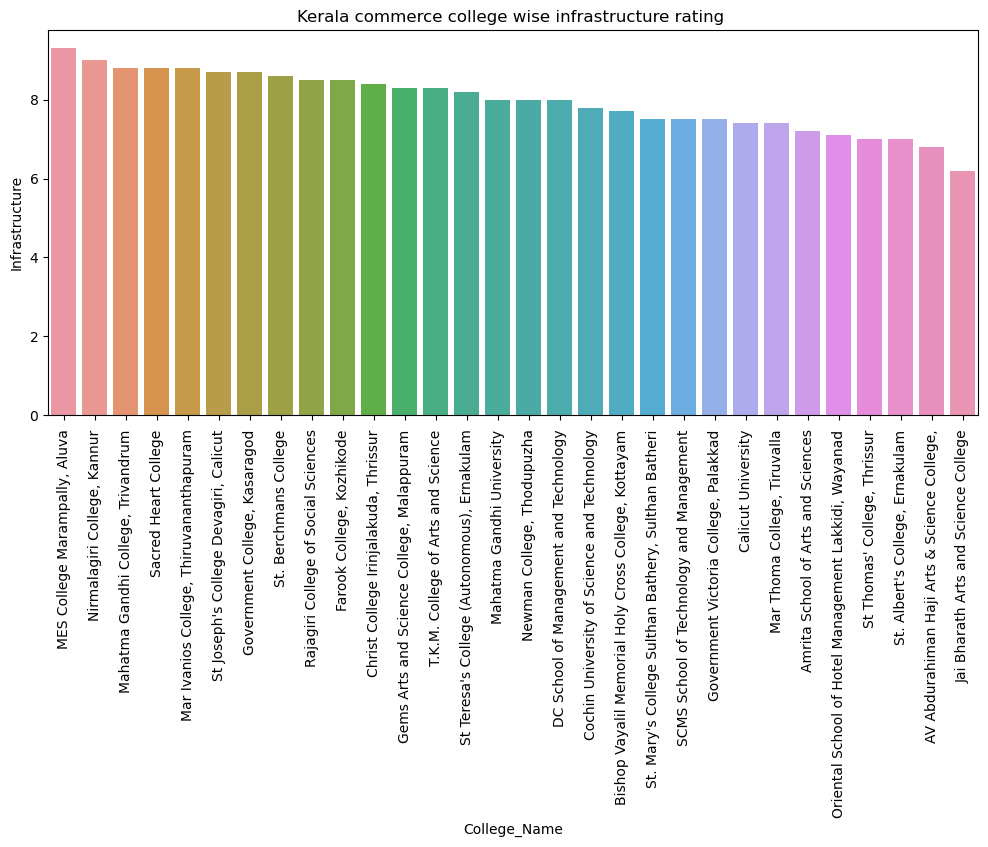

In [100]:
plt.figure(figsize=(12,5))
sns.barplot(data=(commerce_kerala.nlargest(50,columns='Infrastructure')),x='College_Name',y='Infrastructure')
plt.title("Kerala commerce college wise infrastructure rating ")
plt.xticks(rotation=90)
plt.show()

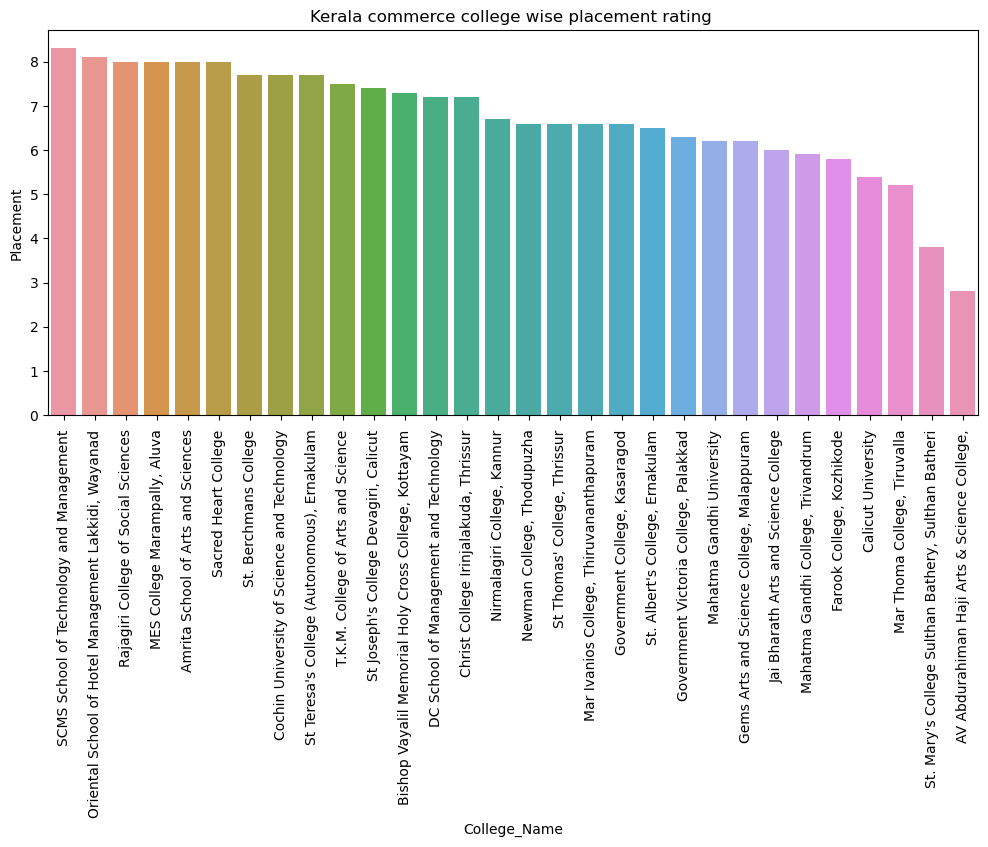

In [101]:
plt.figure(figsize=(12,5))
sns.barplot(data=(commerce_kerala.nlargest(50,columns='Placement')),x='College_Name',y='Placement')
plt.title("Kerala commerce college wise placement rating ")
plt.xticks(rotation=90)
plt.show()

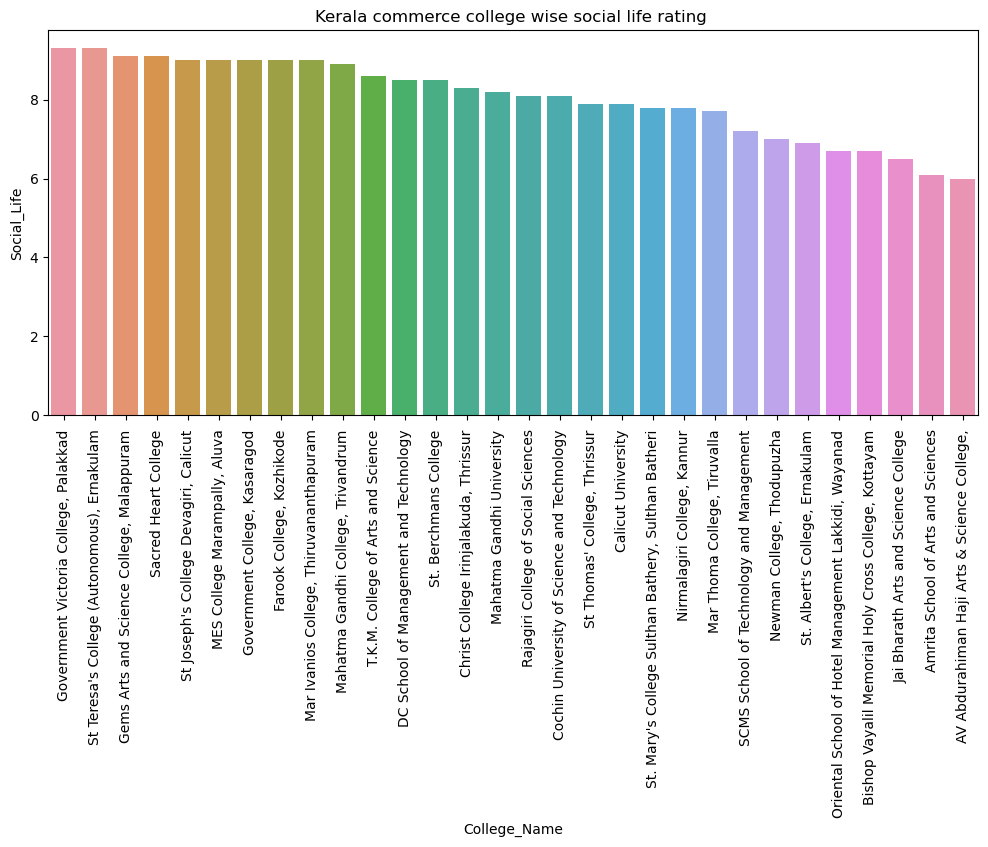

In [102]:
plt.figure(figsize=(12,5))
sns.barplot(data=(commerce_kerala.nlargest(50,columns='Social_Life')),x='College_Name',y='Social_Life')
plt.title("Kerala commerce college wise social life rating ")
plt.xticks(rotation=90)
plt.show()

In [103]:
HM_kerala = kerala_data.query("Stream=='Hotel-management'").drop(columns=['Stream'])
HM_kerala

,College_Name,UG_fee,PG_fee,Rating,Academic,Accommodation,Faculty,Infrastructure,Placement,Social_Life,Average
3317,Holy Grace Academy of Management Studies,NaN,NaN,8.5,8.7,8.3,8.3,8.5,8.2,9.0,8.500000
3318,APJ Abdul Kalam Technological University,NaN,NaN,7.8,8.1,6.9,8.2,8.1,7.5,8.0,7.800000
3319,Yuvakshetra Institute of Management Studies,NaN,NaN,6.9,7.7,5.8,6.8,8.0,6.5,6.7,6.916667
3320,State Institute of Hospitality Management,100000.0,50000.0,7.8,8.5,6.8,8.0,7.3,8.8,7.3,7.783333
3321,Holy Cross Institute of Management and Technol...,66000.0,NaN,8.1,8.3,7.7,8.3,9.0,7.7,7.3,8.050000
3322,Indian School of Business Management and Admin...,14900.0,14900.0,9.2,9.7,9.7,9.3,9.3,9.0,8.3,9.216667
3325,"Christ College Irinjalakuda, Thrissur",871000.0,NaN,8.0,8.3,7.7,8.2,8.4,7.2,8.3,8.016667
3326,Calicut University,2460.0,NaN,7.0,7.5,6.2,7.5,7.4,5.4,7.9,6.983333
3344,Mahatma Gandhi University,NaN,NaN,7.7,8.0,7.5,8.0,8.0,6.2,8.2,7.650000
3345,Munnar Catering College,112933.0,75000.0,9.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN


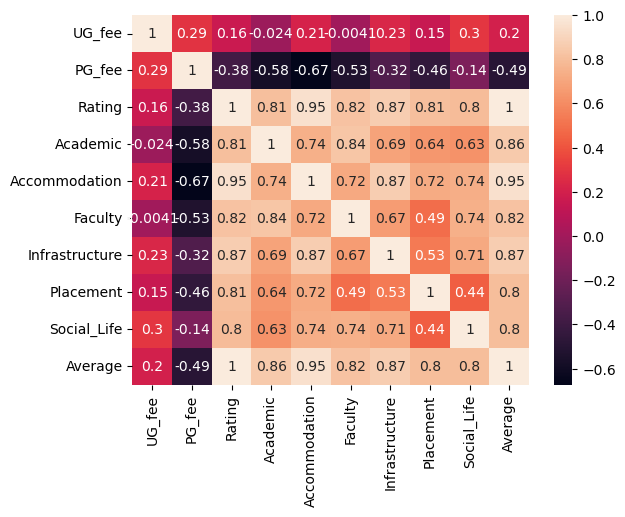

In [104]:
sns.heatmap(HM_kerala.corr(), annot=True)
plt.show()


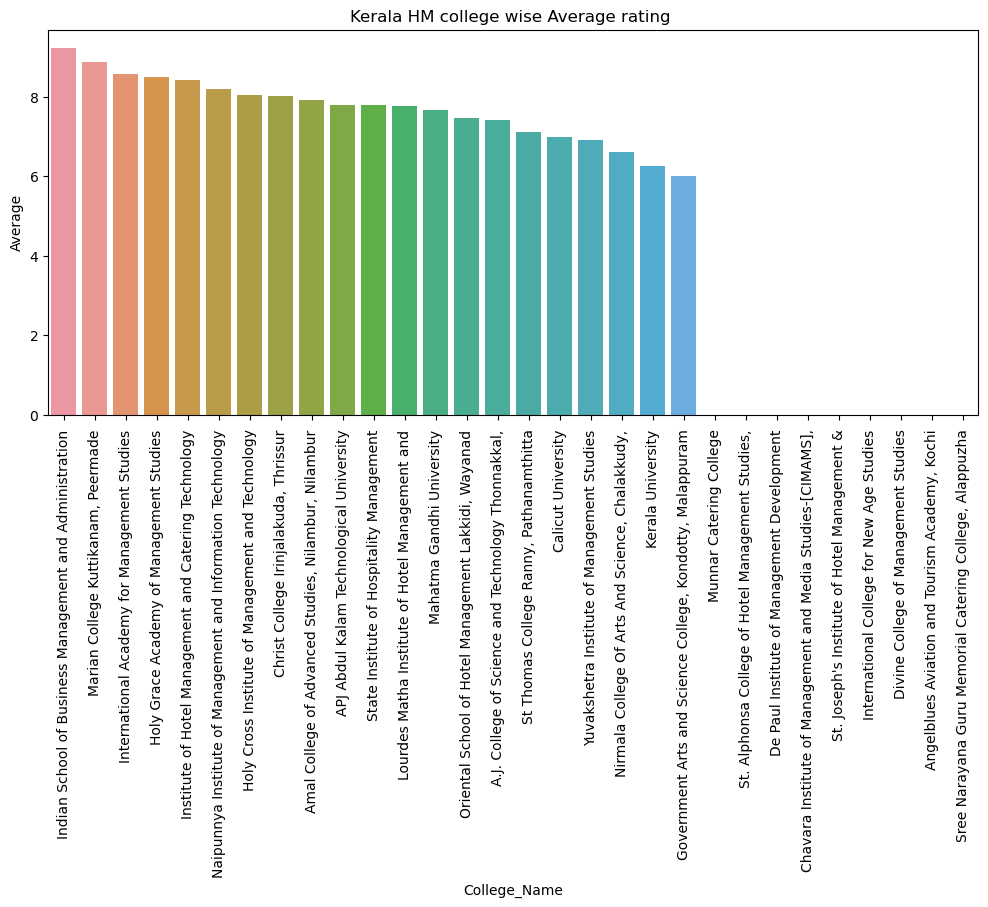

In [105]:
plt.figure(figsize=(12,5))
sns.barplot(data=(HM_kerala.nlargest(50,columns='Average')),x='College_Name',y='Average')
plt.title("Kerala HM college wise Average rating ")
plt.xticks(rotation=90)
plt.show()

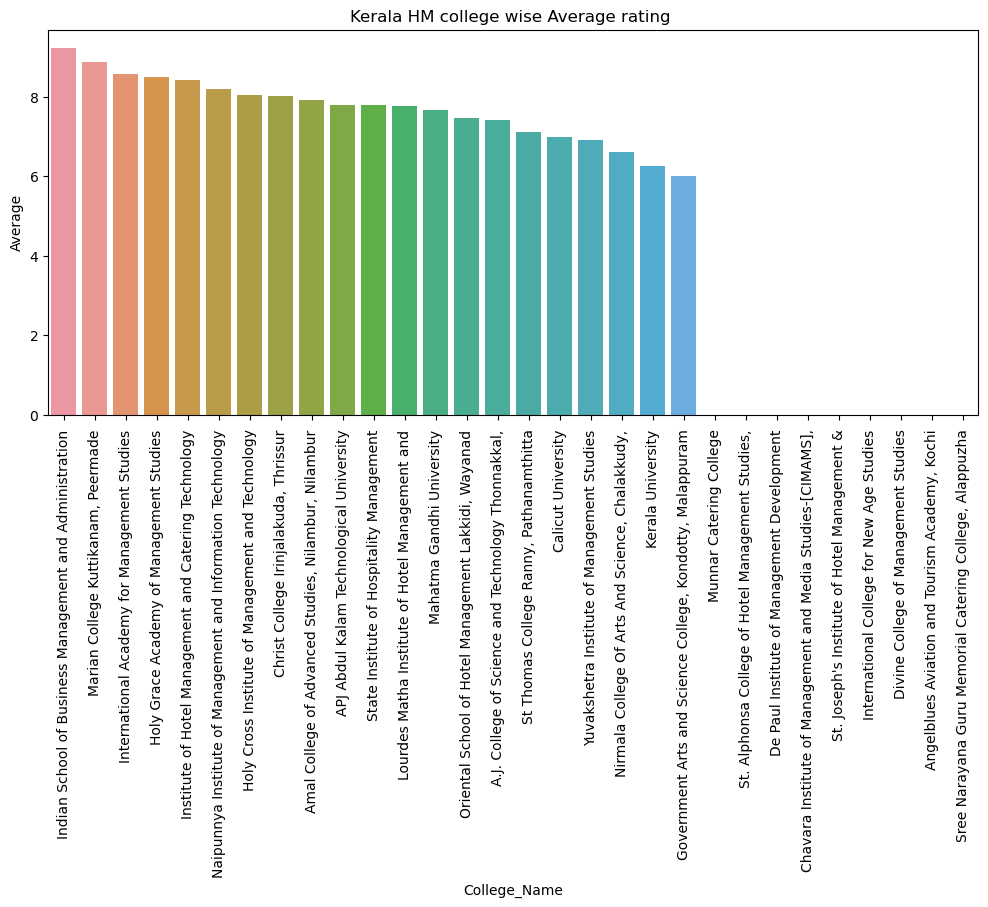

In [106]:
plt.figure(figsize=(12,5))
sns.barplot(data=(HM_kerala.nlargest(50,columns='Average')),x='College_Name',y='Average')
plt.title("Kerala HM college wise Average rating ")
plt.xticks(rotation=90)
plt.show()

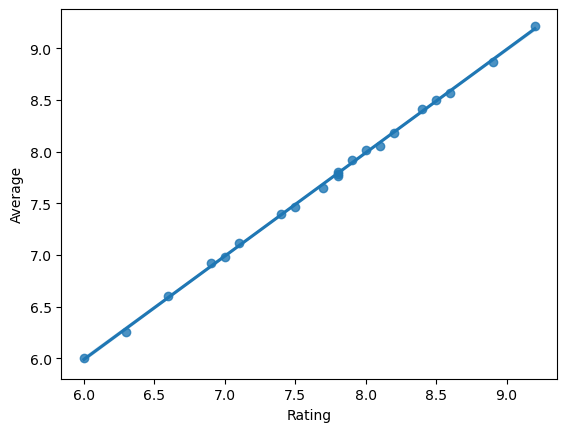

In [107]:
sns.regplot(data =HM_kerala, x = 'Rating', y= 'Average')
plt.show()

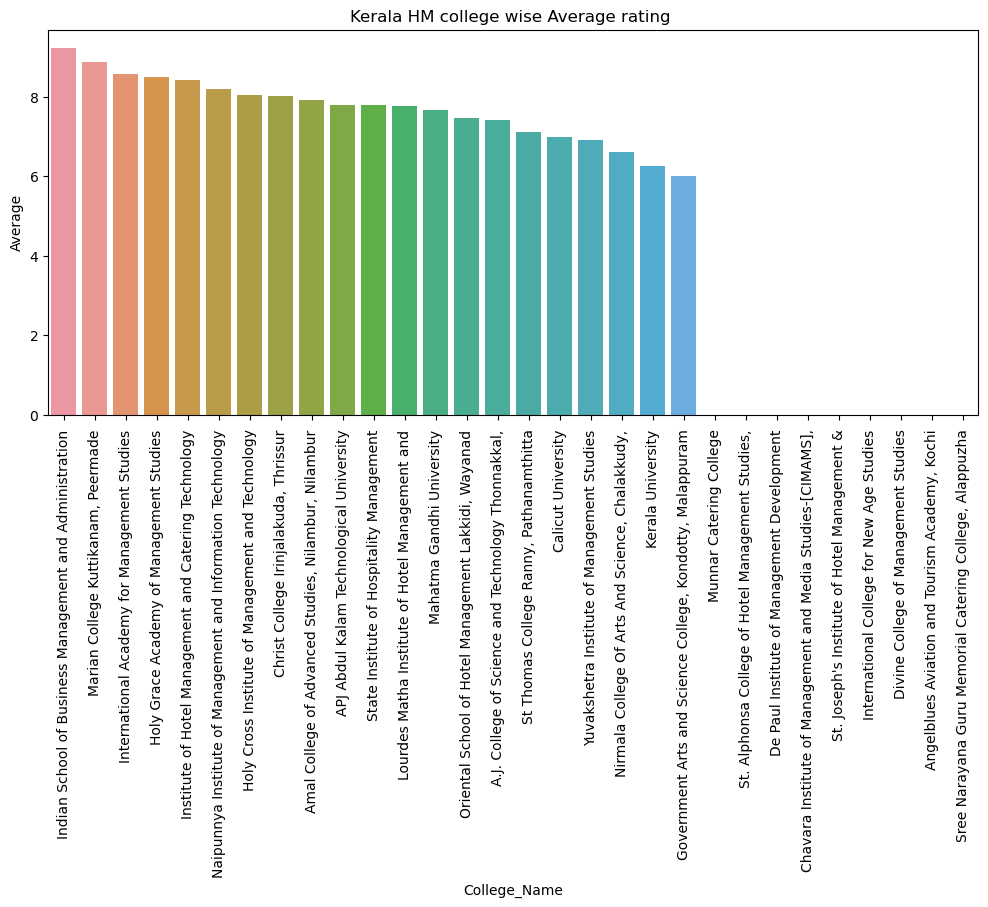

In [108]:
plt.figure(figsize=(12,5))
sns.barplot(data=(HM_kerala.nlargest(50,columns='Average')),x='College_Name',y='Average')
plt.title("Kerala HM college wise Average rating ")
plt.xticks(rotation=90)
plt.show()

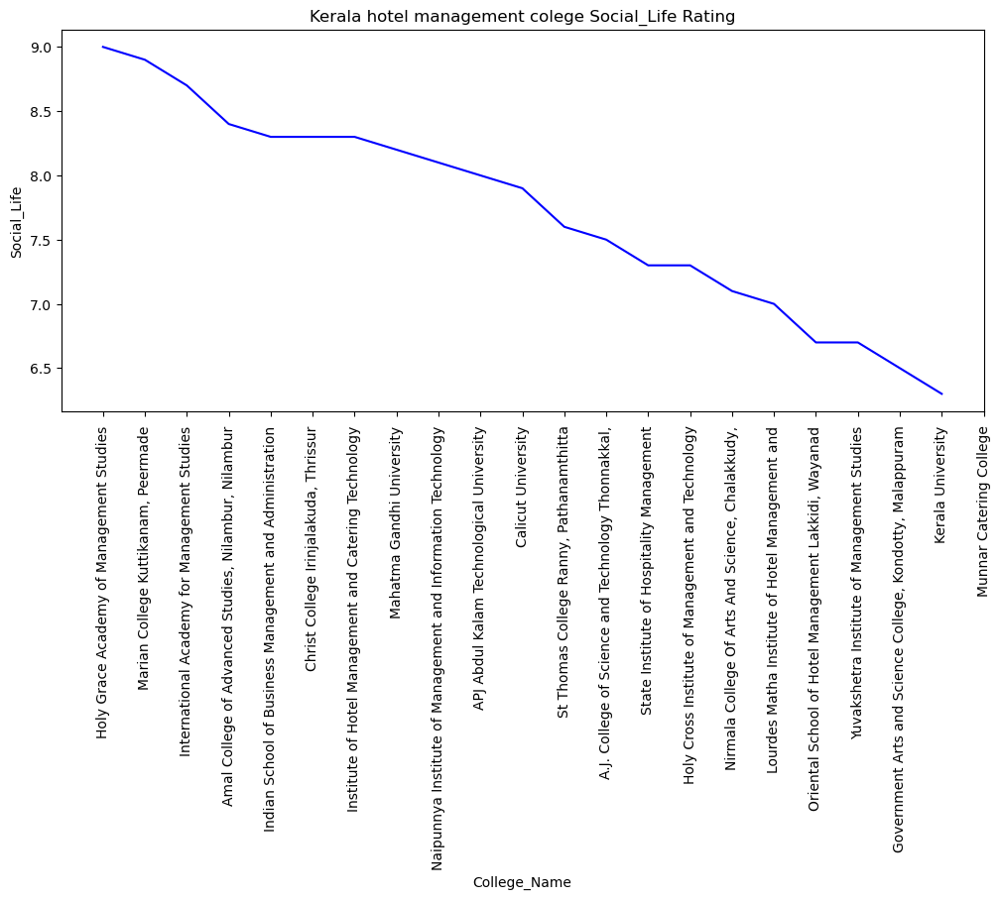

In [109]:
plt.figure(figsize=(12,5))
plt.xticks(rotation=90)
sns.lineplot(x='College_Name',y='Social_Life',data=(HM_kerala.nlargest(50,columns='Social_Life')).sort_values(by='Social_Life',ascending=False),\
             color='blue')
plt.title("Kerala hotel management colege Social_Life Rating")
plt.show()

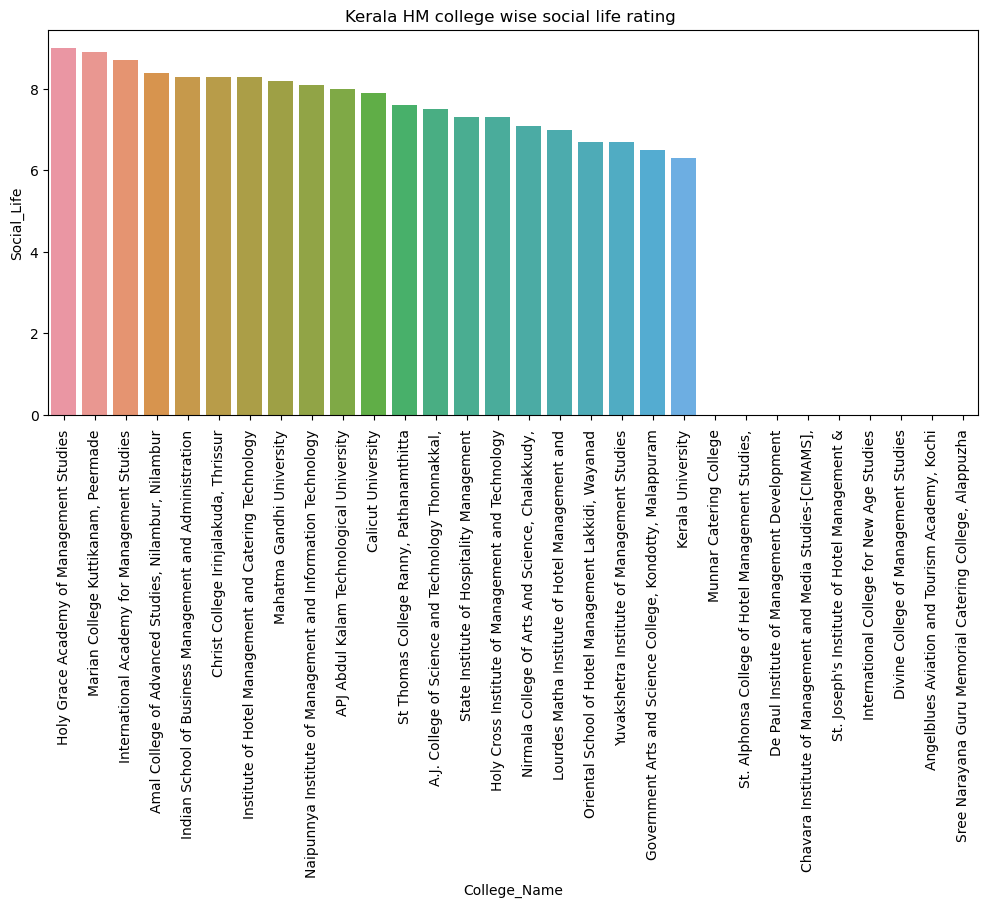

In [110]:
plt.figure(figsize=(12,5))
sns.barplot(data=(HM_kerala.nlargest(50,columns='Social_Life')),x='College_Name',y='Social_Life')
plt.title("Kerala HM college wise social life rating ")
plt.xticks(rotation=90)
plt.show()

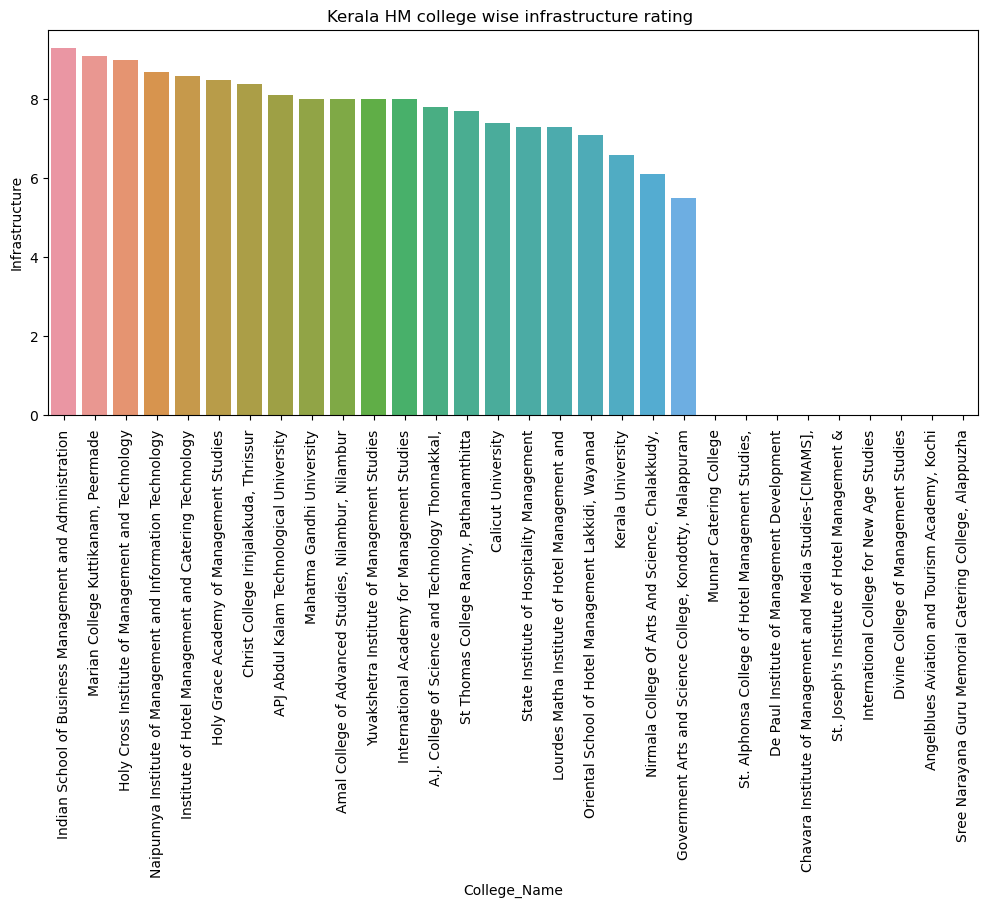

In [111]:
plt.figure(figsize=(12,5))
sns.barplot(data=(HM_kerala.nlargest(50,columns='Infrastructure')),x='College_Name',y='Infrastructure')
plt.title("Kerala HM college wise infrastructure rating ")
plt.xticks(rotation=90)
plt.show()

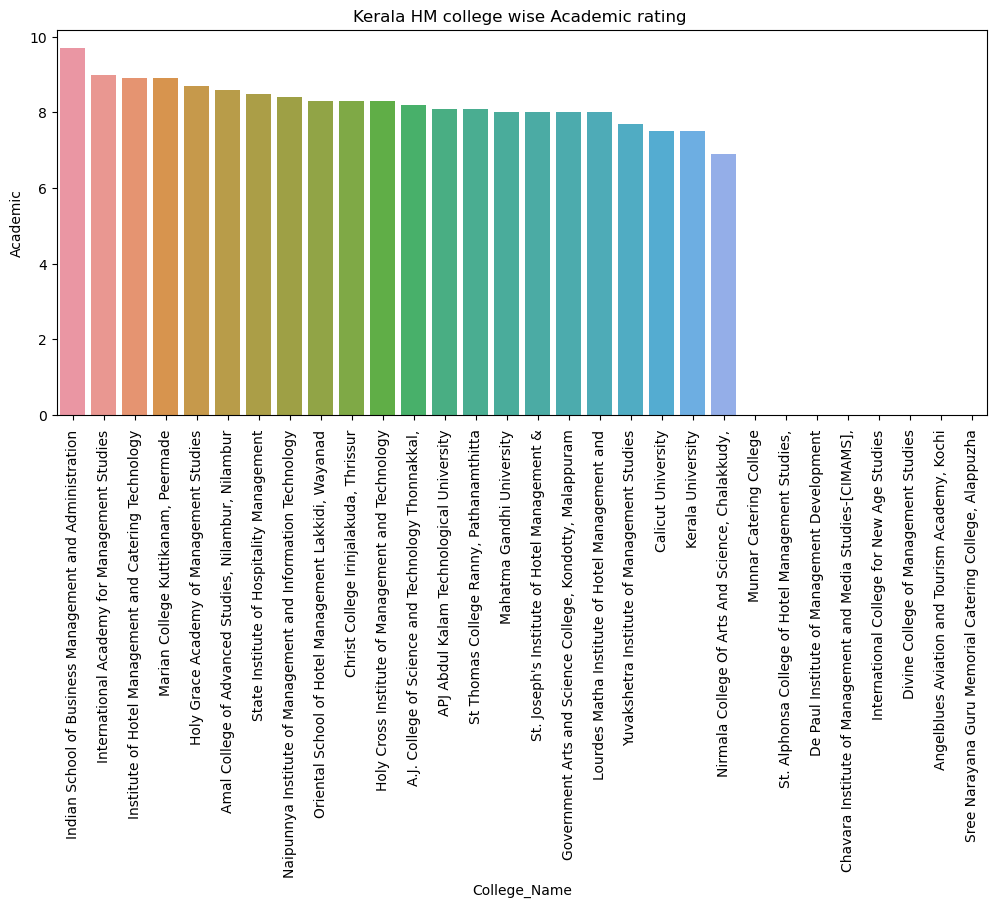

In [112]:
plt.figure(figsize=(12,5))
sns.barplot(data=(HM_kerala.nlargest(50,columns='Academic')),x='College_Name',y='Academic')
plt.title("Kerala HM college wise Academic rating ")
plt.xticks(rotation=90)
plt.show()

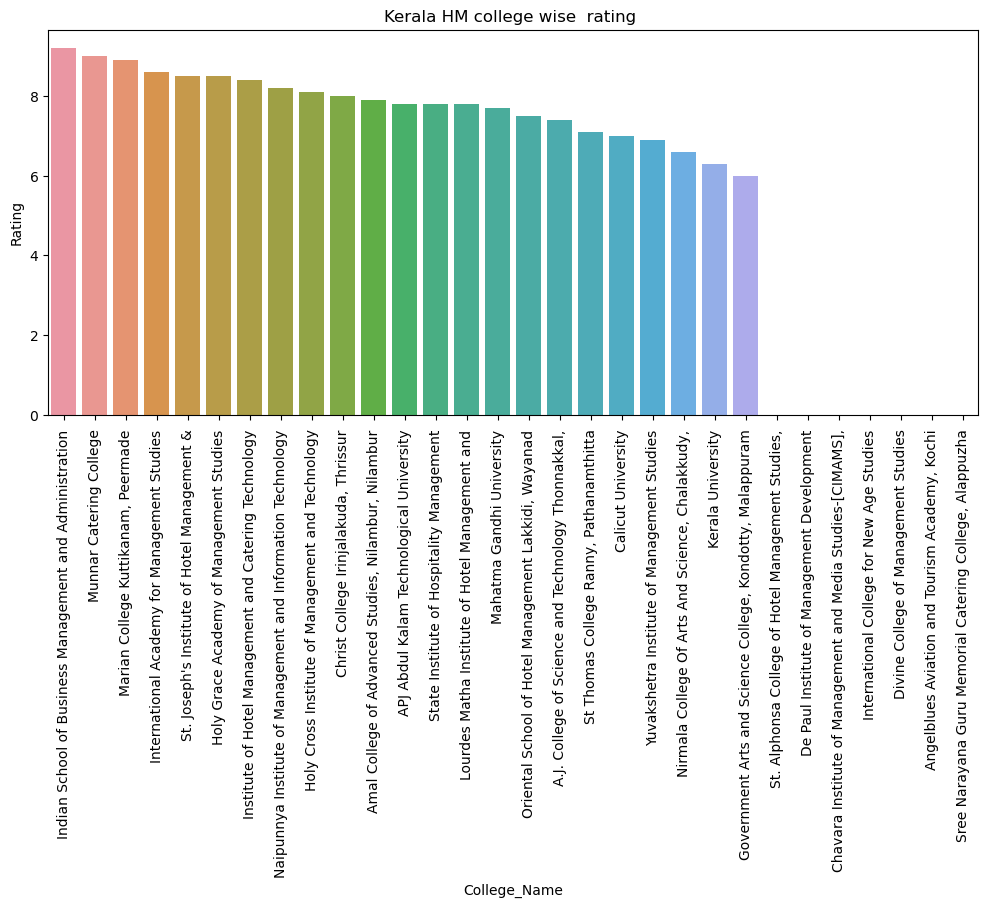

In [113]:
plt.figure(figsize=(12,5))
sns.barplot(data=(HM_kerala.nlargest(50,columns='Rating')),x='College_Name',y='Rating')
plt.title("Kerala HM college wise  rating ")
plt.xticks(rotation=90)
plt.show()

In [114]:
agri_kerala = kerala_data.query("Stream=='Agriculture'").drop(columns=['Stream'])
agri_kerala

med_kerala = kerala_data.query("Stream=='Medical'").drop(columns=['Stream'])
med_kerala

,College_Name,UG_fee,PG_fee,Rating,Academic,Accommodation,Faculty,Infrastructure,Placement,Social_Life,Average
3184,Santhigiri Ayurveda Medical College,199415.0,NaN,7.8,8.5,7.3,7.8,8.3,7.3,7.3,7.750000
3185,"Santhigiri Ayurveda & Siddha Vaidyasala, Palak...",199415.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3186,Pankajakasthuri Ayurveda Medical College,199415.0,20700.0,7.9,9.0,8.0,8.7,8.0,6.0,7.7,7.900000
3187,Poomulli Neelakandan Namboodiripad Memorial Ay...,199415.0,20700.0,8.8,9.0,8.0,9.0,8.0,NaN,NaN,NaN
3188,"PN Panicker Souhruda Ayurveda Medical College,...",282821.0,NaN,7.4,7.0,6.0,8.5,NaN,NaN,NaN,NaN
3189,"Nangelil Ayurveda Medical College, Ernakulam",75000.0,NaN,7.8,7.0,8.0,8.0,9.0,8.0,7.0,7.833333
3190,"KMCT Ayurveda Medical College Manassery, Kozhi...",199415.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3191,"Anugraha School of Ayurveda Nursing, Pathanamt...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3192,"Amala Ayurvedic Hospital and Research Centre, ...",3500.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3193,Ahalia Ayurveda Medical College,278465.0,NaN,8.3,9.0,8.0,8.5,8.5,8.0,7.5,8.250000


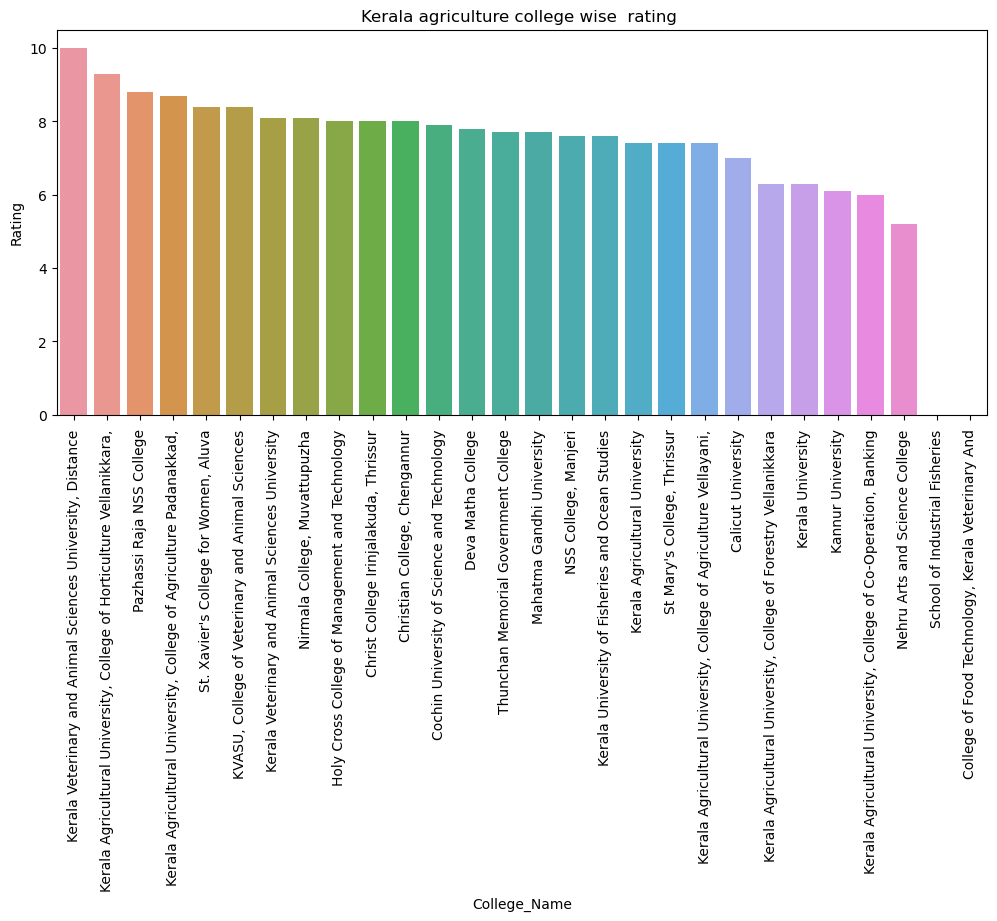

In [115]:
plt.figure(figsize=(12,5))
sns.barplot(data=(agri_kerala.nlargest(50,columns='Rating')),x='College_Name',y='Rating')
plt.title("Kerala agriculture college wise  rating ")
plt.xticks(rotation=90)
plt.show()

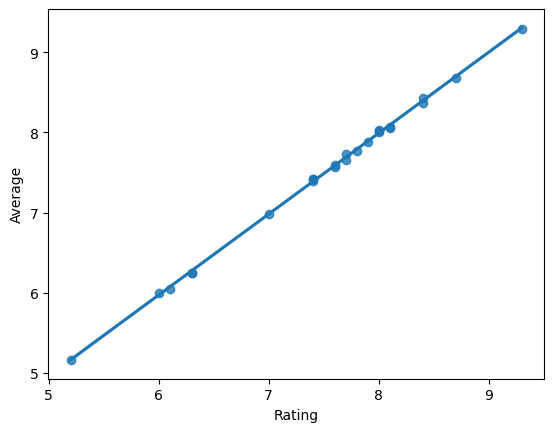

In [116]:
 sns.regplot(data =agri_kerala, x = 'Rating', y= 'Average')
plt.show()

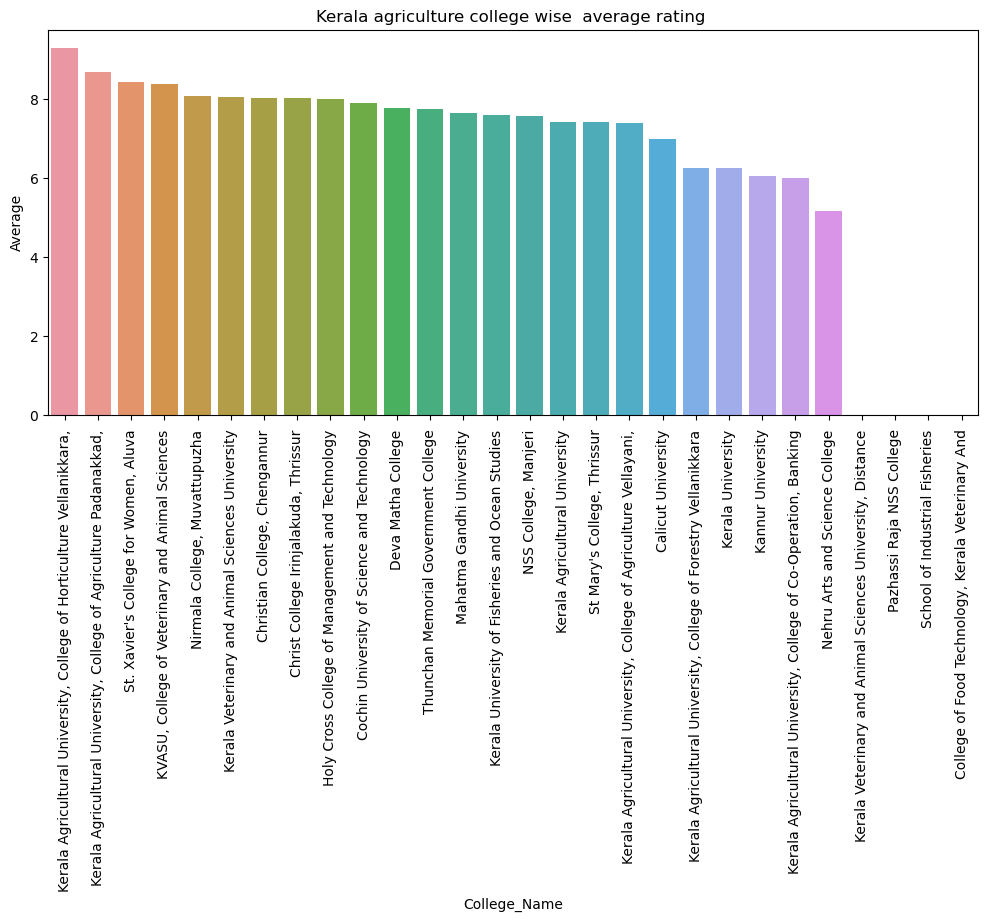

In [117]:
plt.figure(figsize=(12,5))
sns.barplot(data=(agri_kerala.nlargest(50,columns='Average')),x='College_Name',y='Average')
plt.title("Kerala agriculture college wise  average rating ")
plt.xticks(rotation=90)
plt.show()

In [118]:
law_kerala = kerala_data.query("Stream=='Law'").drop(columns=['Stream'])
law_kerala

,College_Name,UG_fee,PG_fee,Rating,Academic,Accommodation,Faculty,Infrastructure,Placement,Social_Life,Average
3291,Indian School of Business Management and Admin...,7900.0,NaN,9.2,9.7,9.7,9.3,9.3,9.0,8.3,9.216667
3367,"KMCT Law College, Malappuram",35000.0,NaN,6.8,7.0,6.7,8.0,7.0,5.3,7.0,6.833333
3368,CSI Institute Of Legal Studies,40000.0,NaN,8.8,8.8,9.8,8.5,9.0,8.0,8.5,8.766667
3369,"Government Law College, Kochi",NaN,NaN,8.0,8.0,7.4,8.1,8.2,6.9,9.3,7.983333
3370,Government Law College,270000.0,6110.0,6.6,7.9,5.2,7.3,6.7,5.9,6.8,6.633333
3371,"Al Azhar Law College, Idukki",60000.0,NaN,8.2,8.3,8.3,8.2,9.0,7.6,7.8,8.200000
3372,"Al-Ameen Law College, Palakkad",NaN,NaN,8.5,8.7,9.7,8.4,9.3,7.0,7.8,8.483333
3373,"Government Law College, Kozhikode",20000.0,3000.0,7.9,7.8,7.9,8.5,7.3,7.0,8.6,7.850000
3374,Nehru Academy of Law,NaN,NaN,8.0,8.0,6.0,8.0,8.0,8.0,NaN,NaN
3375,"St Mary's College, Thrissur",NaN,NaN,7.4,8.1,6.6,7.9,7.7,6.7,7.5,7.416667


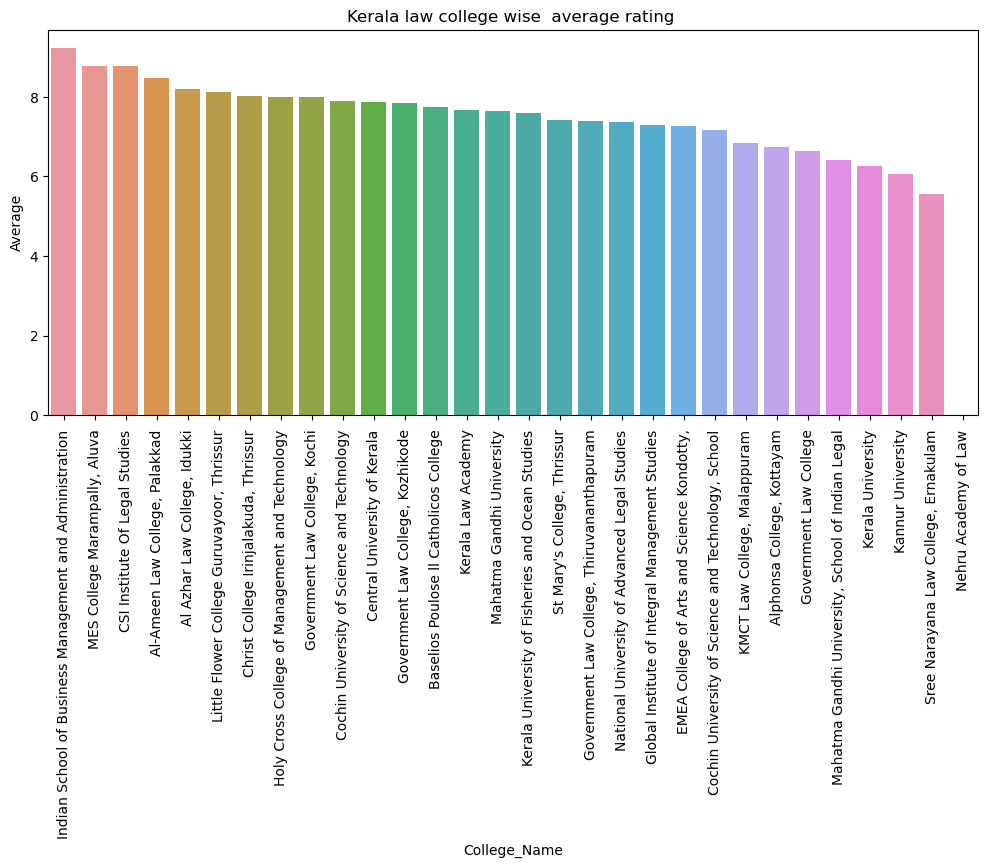

In [119]:
plt.figure(figsize=(12,5))
sns.barplot(data=(law_kerala.nlargest(50,columns='Average')),x='College_Name',y='Average')
plt.title("Kerala law college wise  average rating ")
plt.xticks(rotation=90)
plt.show()

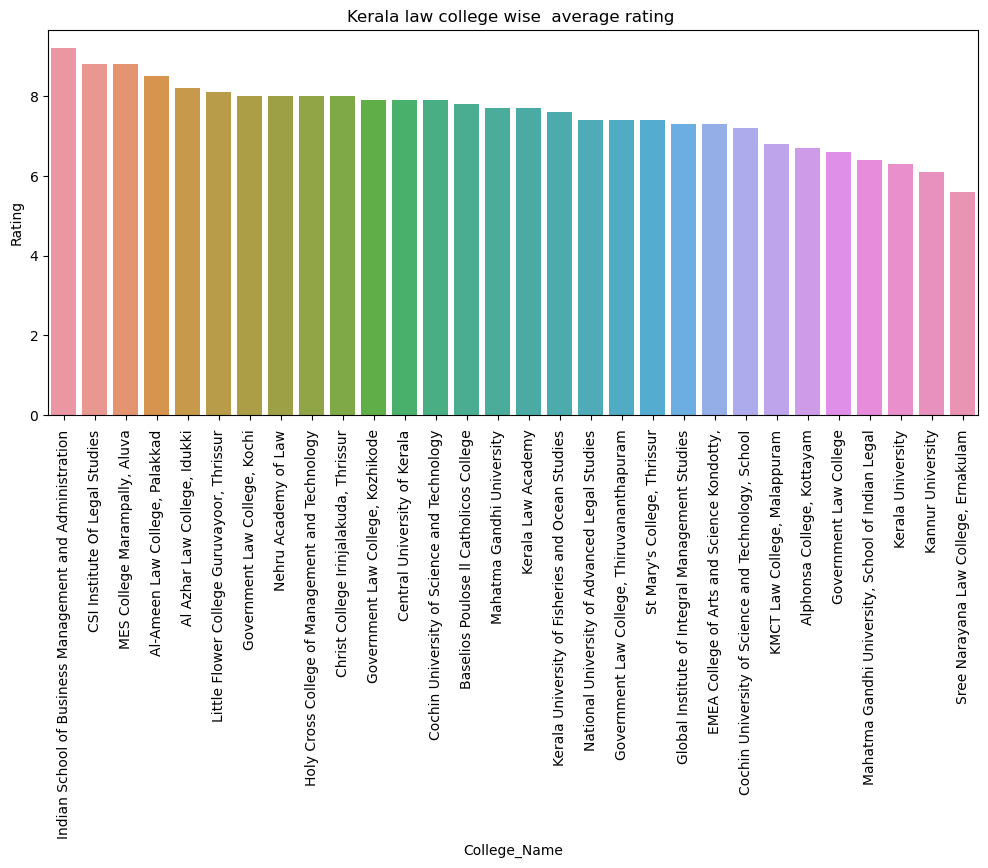

In [120]:
plt.figure(figsize=(12,5))
sns.barplot(data=(law_kerala.nlargest(50,columns='Rating')),x='College_Name',y='Rating')
plt.title("Kerala law college wise  average rating ")
plt.xticks(rotation=90)
plt.show()

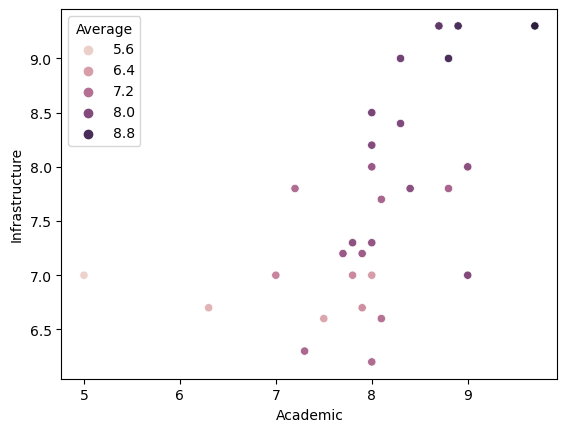

In [121]:
sns.scatterplot(data=law_kerala, x='Academic', y='Infrastructure', hue='Average')
plt.show()

In [122]:
pharm_kerala = kerala_data.query("Stream=='Pharmacy'").drop(columns=['Stream'])
pharm_kerala

,College_Name,UG_fee,PG_fee,Rating,Academic,Accommodation,Faculty,Infrastructure,Placement,Social_Life,Average
3238,"Jamia Salafiya Pharmacy College, Malappuram",98000.0,100000.0,7.3,7.6,7.4,8.0,7.8,6.2,6.8,7.300000
3239,"Grace College of Pharmacy, Palakkad",125000.0,90000.0,7.8,8.3,7.5,8.0,8.0,7.5,7.3,7.766667
3240,Ezhuthachan College of Pharmaceutical Sciences,19500.0,NaN,7.9,8.5,7.5,8.0,8.0,7.5,8.0,7.916667
3241,"Devaki Amma Memorial College of Pharmacy, Mala...",136105.0,200000.0,8.0,9.0,7.0,8.0,9.0,8.0,7.0,8.000000
3242,The Dale View College of Pharmacy and,517000.0,450000.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3243,Crescent College of Pharmaceutical Sciences Pa...,NaN,NaN,6.4,7.5,7.3,6.8,7.3,3.0,6.5,6.400000
3244,Chemists College of Pharmaceutical Sciences an...,98000.0,40000.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3245,"Amrita School of Pharmacy, Kochi",152700.0,185150.0,7.0,8.3,4.3,6.7,8.8,6.3,7.3,6.950000
3246,"Amala Ayurvedic Hospital and Research Centre, ...",3500.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3247,Devaki Amma's Guruvayurappan College of Archit...,85000.0,190000.0,6.9,8.3,6.3,8.3,6.7,6.0,5.7,6.883333


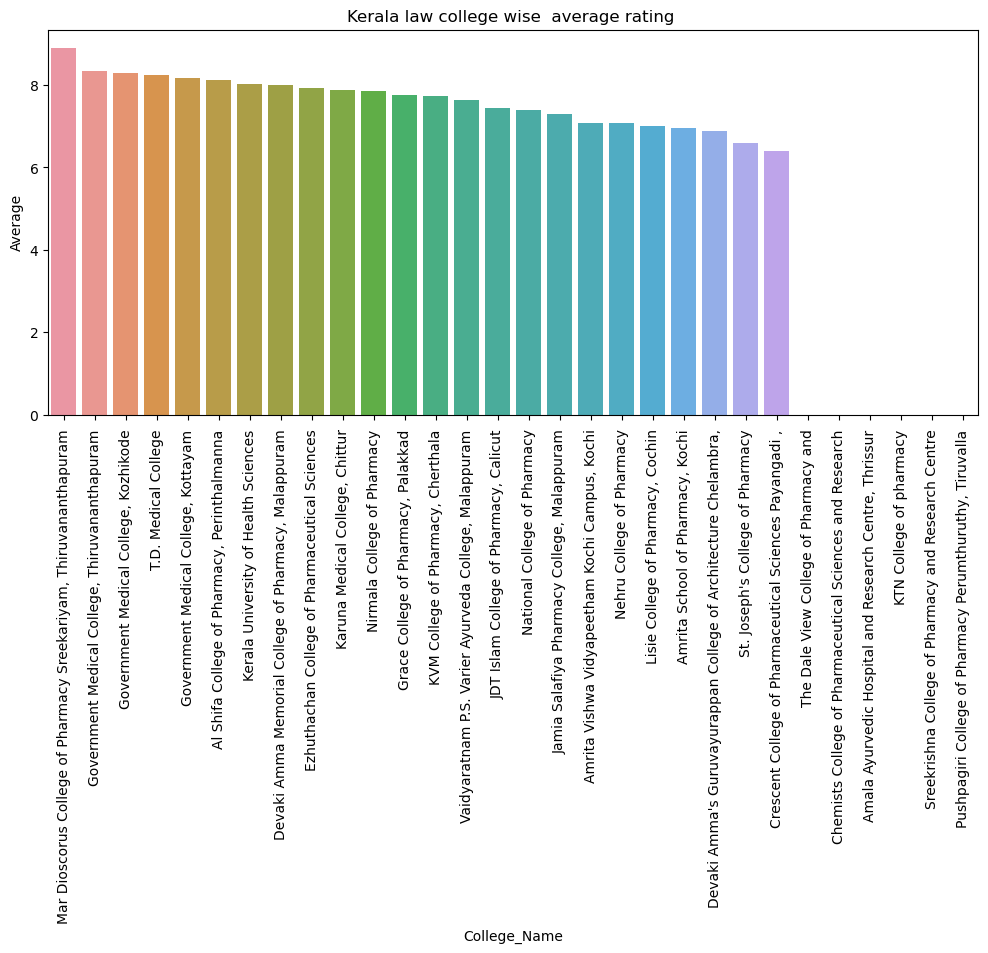

In [123]:
plt.figure(figsize=(12,5))
sns.barplot(data=(pharm_kerala.nlargest(50,columns='Average')),x='College_Name',y='Average')
plt.title("Kerala law college wise  average rating ")
plt.xticks(rotation=90)
plt.show()

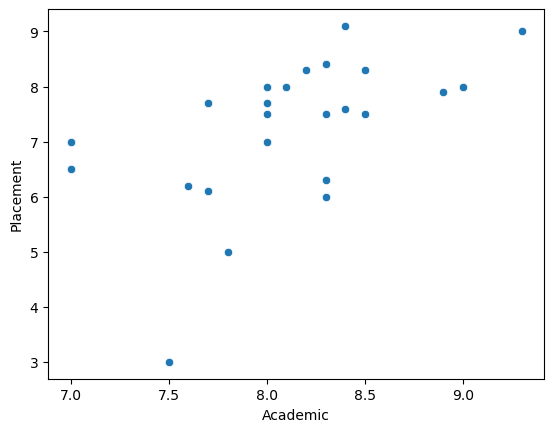

In [124]:
sns.scatterplot(data=pharm_kerala, x='Academic', y='Placement')
plt.show()

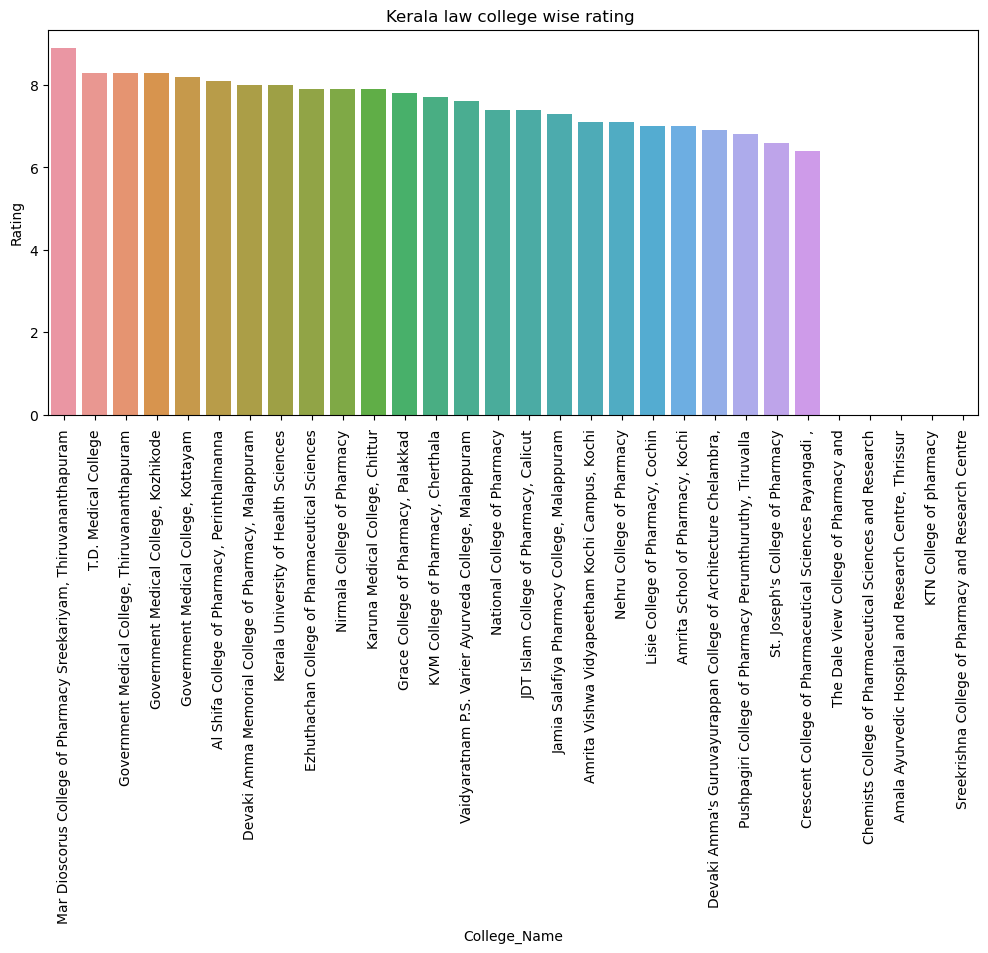

In [125]:
plt.figure(figsize=(12,5))
sns.barplot(data=(pharm_kerala.nlargest(50,columns='Rating')),x='College_Name',y='Rating')
plt.title("Kerala law college wise rating ")
plt.xticks(rotation=90)
plt.show()

In [126]:
India_agri = data.query("Stream=='Agriculture'").drop(columns=['Stream'])
India_agri

,College_Name,State,UG_fee,PG_fee,Rating,Academic,Accommodation,Faculty,Infrastructure,Placement,Social_Life,Average
12,Jawaharlal Nehru Rajkeeya Mahavidyalaya,Andaman,939.0,NaN,6.6,8.5,5.0,7.0,7.5,2.5,9.0,6.583333
15,Dantuluri Narayana Raju college,Andhra pradesh,NaN,NaN,8.5,8.5,8.3,8.7,9.2,6.7,9.3,8.450000
21,"Jawahar Bharati Degree & P.G College, Nellore",Andhra pradesh,NaN,NaN,8.8,9.5,9.0,NaN,NaN,NaN,NaN,NaN
22,"Besant Theosophical College, Madanapalle",Andhra pradesh,NaN,NaN,8.3,8.5,8.5,8.5,8.0,8.0,8.5,8.333333
24,"Andhra University, College of Science & Techno...",Andhra pradesh,NaN,NaN,8.0,8.6,6.4,8.8,8.3,7.1,8.7,7.983333
...,...,...,...,...,...,...,...,...,...,...,...,...
6735,West Bengal State University,West bengal,19000.0,NaN,7.9,8.0,7.5,8.6,7.9,7.6,8.0,7.933333
6736,Visva Bharati University,West bengal,10190.0,12130.0,7.6,8.4,7.0,8.4,7.7,5.8,8.4,7.616667
6737,"Vidyasagar University, Midnapore",West bengal,43185.0,NaN,7.0,7.9,6.8,6.9,8.0,5.5,7.0,7.016667
6738,"University of North Bengal, Darjeeling",West bengal,9315.0,44040.0,7.9,8.7,7.8,8.1,8.1,6.9,7.9,7.916667


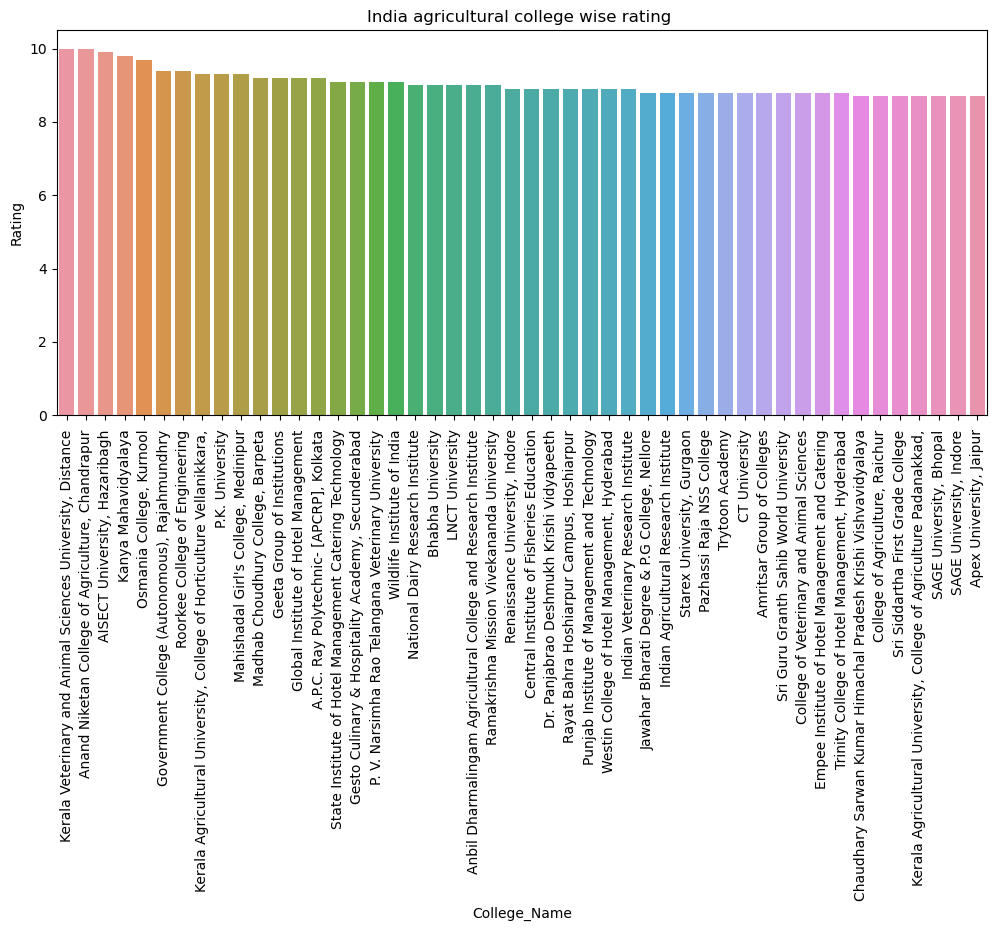

In [127]:
plt.figure(figsize=(12,5))
sns.barplot(data=(India_agri.nlargest(50,columns='Rating')),x='College_Name',y='Rating')
plt.title("India agricultural college wise rating ")
plt.xticks(rotation=90)
plt.show()

In [128]:
India_Eng = data.query("Stream =='Engineering'").drop(columns=['Stream'])
India_Eng

,College_Name,State,UG_fee,PG_fee,Rating,Academic,Accommodation,Faculty,Infrastructure,Placement,Social_Life,Average
1,"Dr. B R Ambedkar Institute of Technology, Port...",Andaman,12083.0,4780.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
247,VIT University,Andhra pradesh,198000.0,193000.0,8.2,8.3,7.9,8.3,8.1,8.4,8.1,8.183333
248,Rajeev Gandhi Memorial College of Engineering ...,Andhra pradesh,69100.0,62800.0,7.4,7.8,7.2,7.6,8.0,6.2,7.4,7.366667
249,Indian Institute of Information Technology Des...,Andhra pradesh,144600.0,67500.0,7.4,7.9,7.6,8.0,6.7,7.2,7.2,7.433333
250,Raghu Engineering College,Andhra pradesh,85000.0,57000.0,8.1,8.3,7.1,8.1,8.4,8.5,8.0,8.066667
...,...,...,...,...,...,...,...,...,...,...,...,...
6594,"Techno India Salt Lake, Kolkata",West bengal,483800.0,273000.0,7.5,7.9,6.0,7.8,7.5,7.6,8.3,7.516667
6595,Bengal College of Engineering and Technology,West bengal,103600.0,112500.0,7.1,7.2,6.6,7.2,8.0,6.1,7.5,7.100000
6596,Dr. B.C. Roy Engineering College,West bengal,108980.0,119000.0,7.7,7.9,7.3,7.7,8.1,7.2,7.8,7.666667
6597,Bengal College of Engineering,West bengal,98500.0,NaN,5.7,6.3,5.9,6.0,5.4,5.1,5.3,5.666667


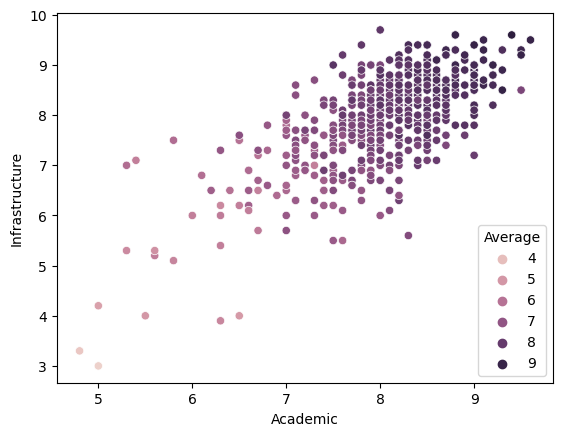

In [129]:
sns.scatterplot(data=India_Eng, x='Academic', y='Infrastructure', hue='Average')
plt.show()

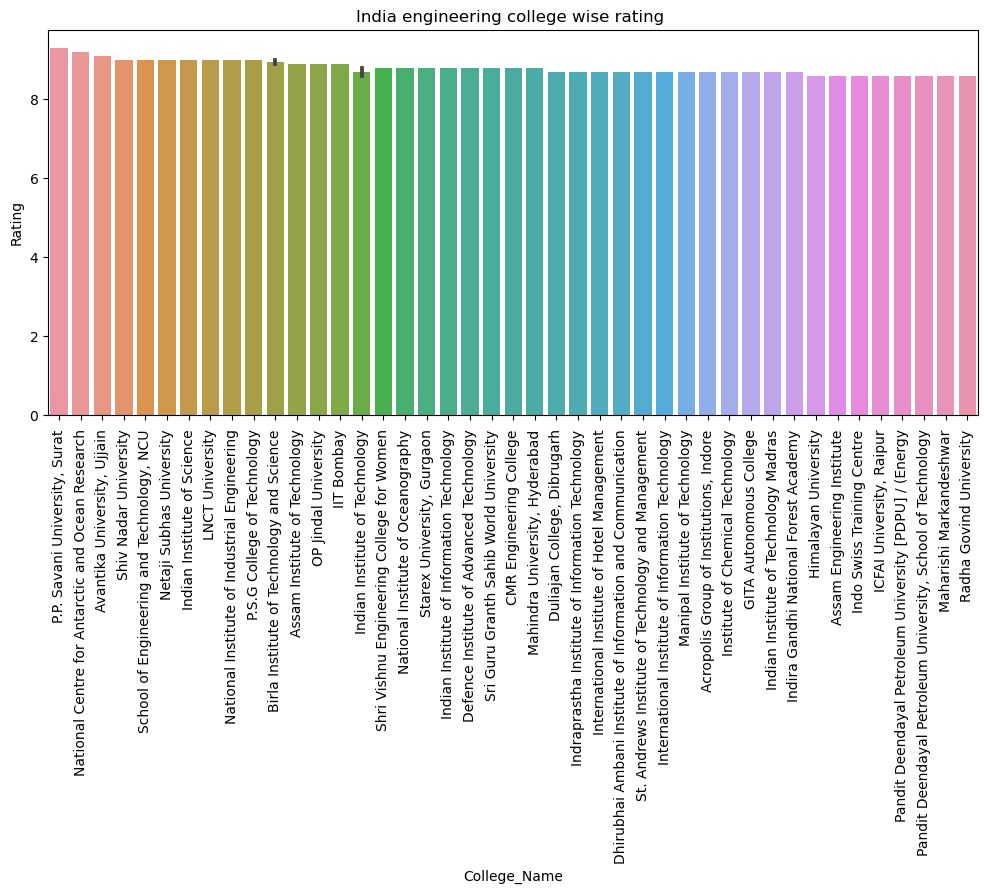

In [130]:
plt.figure(figsize=(12,5))
sns.barplot(data=(India_Eng.nlargest(50,columns='Rating')),x='College_Name',y='Rating')
plt.title("India engineering college wise rating ")
plt.xticks(rotation=90)
plt.show()

In [131]:
India_Mang = data.query("Stream=='Science'").drop(columns=['Stream'])
India_Mang

,College_Name,State,UG_fee,PG_fee,Rating,Academic,Accommodation,Faculty,Infrastructure,Placement,Social_Life,Average
3,"Dr. B R Ambedkar Institute of Technology, Port...",Andaman,29964.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Jawaharlal Nehru Rajkeeya Mahavidyalaya,Andaman,939.0,1128.0,6.6,8.5,5.0,7.0,7.5,2.5,9.0,6.583333
5,"Mahatma Gandhi Government College, Mayabander",Andaman,1155.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,"Tagore Government College of Education, Port B...",Andaman,NaN,NaN,9.0,9.0,NaN,NaN,9.0,9.0,NaN,NaN
32,Rajeev Gandhi Memorial College of Engineering ...,Andhra pradesh,NaN,NaN,7.4,7.8,7.2,7.6,8.0,6.2,7.4,7.366667
...,...,...,...,...,...,...,...,...,...,...,...,...
6688,Guru Nanak Institute of Hotel Management,West bengal,105000.0,NaN,8.0,8.3,7.3,8.0,8.2,8.4,7.9,8.016667
6689,"NSHM Knowledge Campus, Kolkata",West bengal,156000.0,140000.0,7.8,8.0,6.8,8.1,8.2,7.7,8.0,7.800000
6690,JD Birla Institute,West bengal,175248.0,84200.0,7.6,8.3,6.1,8.1,7.7,7.6,8.0,7.633333
6691,"Annex College, Kolkata",West bengal,198000.0,120000.0,7.9,7.7,8.3,8.3,7.8,7.5,8.0,7.933333


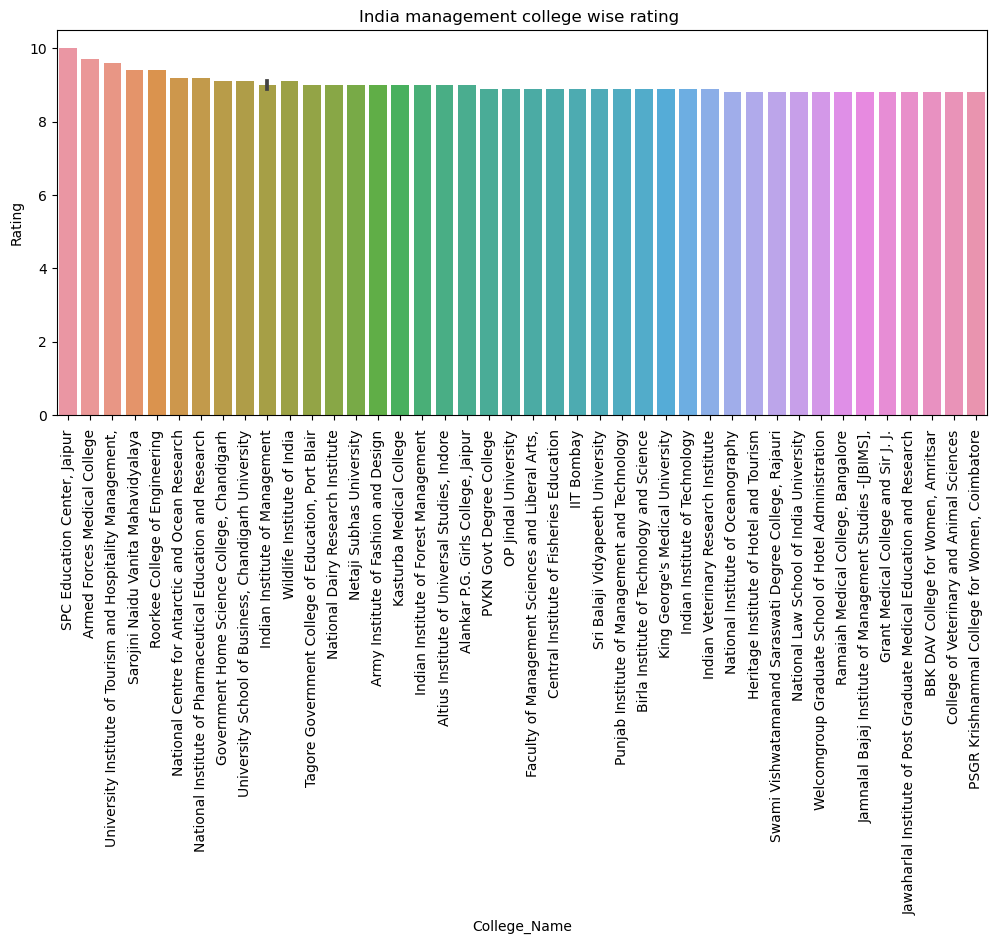

In [132]:
plt.figure(figsize=(12,5))
sns.barplot(data=(India_Mang.nlargest(50,columns='Rating')),x='College_Name',y='Rating')
plt.title("India management college wise rating ")
plt.xticks(rotation=90)
plt.show()

In [133]:
India_Comm = data.query("Stream=='Commerce'").drop(columns=['Stream'])
India_Comm

,College_Name,State,UG_fee,PG_fee,Rating,Academic,Accommodation,Faculty,Infrastructure,Placement,Social_Life,Average
6,Jawaharlal Nehru Rajkeeya Mahavidyalaya,Andaman,843.0,1008.0,6.6,8.5,5.0,7.0,7.5,2.5,9.0,6.583333
7,"Mahatma Gandhi Government College, Mayabander",Andaman,1155.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
66,Government Degree College (Men),Andhra pradesh,NaN,NaN,7.8,8.5,5.5,NaN,NaN,NaN,NaN,NaN
67,Dodla Kousalyamma Government College for Women...,Andhra pradesh,4840.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
68,Dharma Apparao College,Andhra pradesh,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...
6664,St. Xavier's College,West bengal,30200.0,235000.0,8.3,8.8,7.4,8.4,8.6,7.8,8.8,8.300000
6665,"University of Calcutta, Kolkata",West bengal,4400.0,2314.0,7.7,8.6,6.9,8.5,7.7,6.5,7.7,7.650000
6666,JD Birla Institute,West bengal,150248.0,62600.0,7.6,8.3,6.1,8.1,7.7,7.6,8.0,7.633333
6667,Goenka College of Commerce and Business Admini...,West bengal,1300.0,1485.0,7.8,8.9,6.1,8.6,7.5,7.5,8.1,7.783333


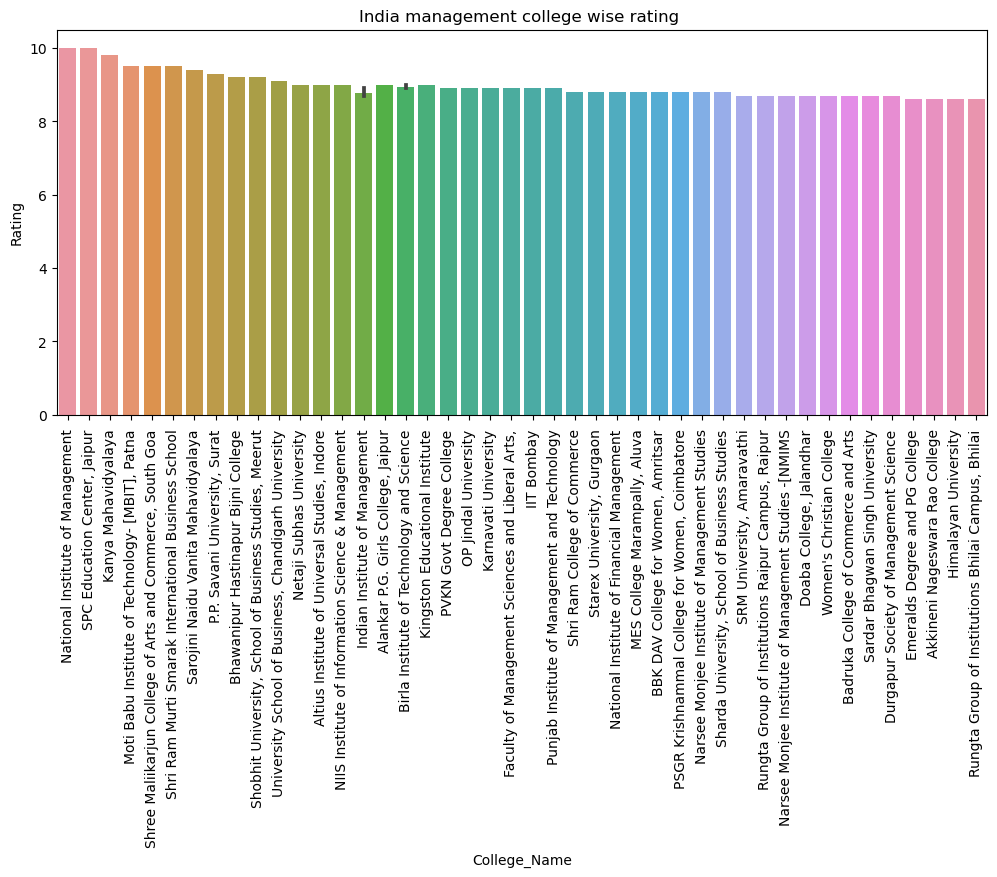

In [134]:
plt.figure(figsize=(12,5))
sns.barplot(data=(India_Comm.nlargest(50,columns='Rating')),x='College_Name',y='Rating')
plt.title("India management college wise rating ")
plt.xticks(rotation=90)
plt.show()

In [135]:
India_Arts = data.query("Stream=='Arts'").drop(columns=['Stream'])
India_Arts

,College_Name,State,UG_fee,PG_fee,Rating,Academic,Accommodation,Faculty,Infrastructure,Placement,Social_Life,Average
9,"Mahatma Gandhi Government College, Mayabander",Andaman,1155.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
10,"Tagore Government College of Education, Port B...",Andaman,NaN,NaN,9.0,9.0,NaN,NaN,9.0,9.0,NaN,NaN
14,Jawaharlal Nehru Rajkeeya Mahavidyalaya,Andaman,843.0,1008.0,6.6,8.5,5.0,7.0,7.5,2.5,9.0,6.583333
187,"Besant Theosophical College, Madanapalle",Andhra pradesh,6000.0,20000.0,8.3,8.5,8.5,8.5,8.0,8.0,8.5,8.333333
188,"Annabattuni Satyanarayana Degree College, Guntur",Andhra pradesh,NaN,NaN,6.9,7.7,6.0,8.0,6.3,8.3,5.0,6.883333
...,...,...,...,...,...,...,...,...,...,...,...,...
6642,"Acharya Jagadish Chandra Bose College, Kolkata",West bengal,11200.0,NaN,6.4,7.1,5.3,7.6,6.9,4.7,6.7,6.383333
6643,"Shri Shikshayatan College, Kolkata",West bengal,35360.0,44220.0,8.2,8.6,7.6,8.7,8.5,7.6,8.3,8.216667
6644,"Sivanath Sastri College, Kolkata",West bengal,7720.0,NaN,7.2,8.3,5.9,8.2,6.6,6.4,7.8,7.200000
6645,Indian Institute of Technology,West bengal,50000.0,40000.0,8.5,8.8,7.2,8.2,8.9,8.8,9.0,8.483333


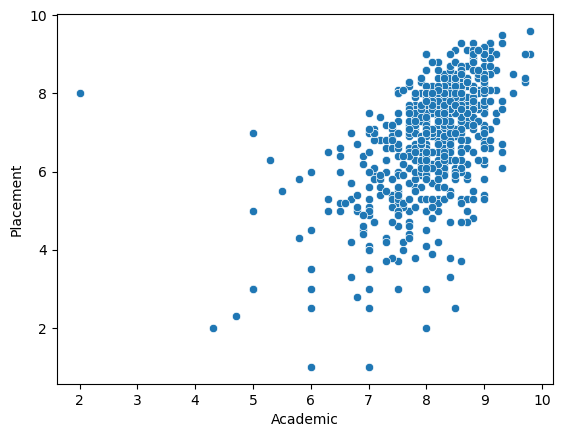

In [136]:
sns.scatterplot(data=India_Arts, x='Academic', y='Placement')
plt.show()


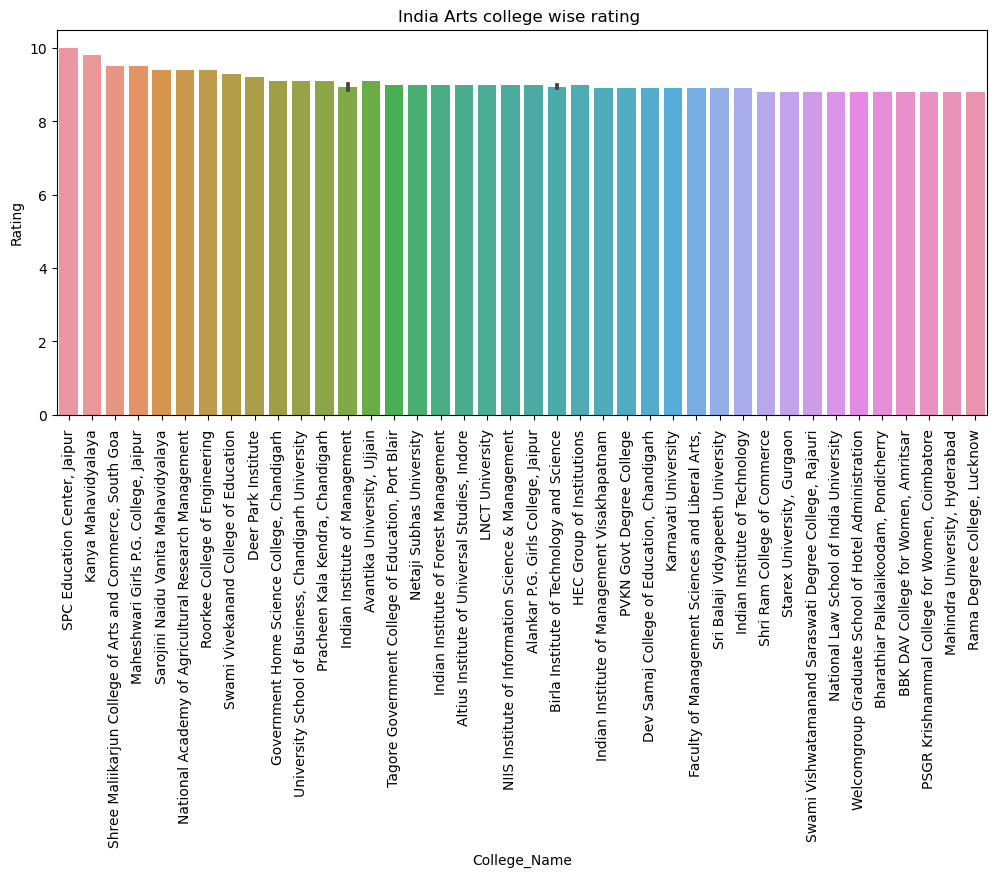

In [137]:
plt.figure(figsize=(12,5))
sns.barplot(data=(India_Arts.nlargest(50,columns='Rating')),x='College_Name',y='Rating')
plt.title("India Arts college wise rating ")
plt.xticks(rotation=90)
plt.show()

In [138]:
India_HM = data.query("Stream=='Hotel-management'").drop(columns=['Stream'])
India_HM

,College_Name,State,UG_fee,PG_fee,Rating,Academic,Accommodation,Faculty,Infrastructure,Placement,Social_Life,Average
11,"Dr. B R Ambedkar Institute of Technology, Port...",Andaman,4780.0,11980.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
23,GEMS B School,Andhra pradesh,250000.0,NaN,9.1,9.5,8.5,9.5,9.0,9.0,9.0,9.083333
52,Sun International Institute for Tourism & Mana...,Andhra pradesh,130500.0,170500.0,7.9,8.4,7.3,7.5,7.8,8.5,7.7,7.866667
75,Andhra Loyola College,Andhra pradesh,NaN,NaN,8.0,8.5,7.4,8.5,8.6,7.0,8.2,8.033333
76,Acharya Nagarjuna University,Andhra pradesh,10365.0,5140.0,7.3,7.7,7.0,7.2,8.0,5.7,8.2,7.300000
...,...,...,...,...,...,...,...,...,...,...,...,...
6759,"Annex College, Kolkata",West bengal,NaN,NaN,7.9,7.7,8.3,8.3,7.8,7.5,8.0,7.933333
6760,"NSHM Knowledge Campus, Kolkata",West bengal,217500.0,NaN,7.8,8.0,6.8,8.1,8.2,7.7,8.0,7.800000
6761,"BNG Hotel Management, Kolkata",West bengal,NaN,NaN,7.8,8.0,7.5,7.9,7.5,7.9,7.8,7.766667
6766,University of Engineering and Management,West bengal,110000.0,NaN,8.1,8.6,7.2,8.5,7.9,8.8,7.7,8.116667


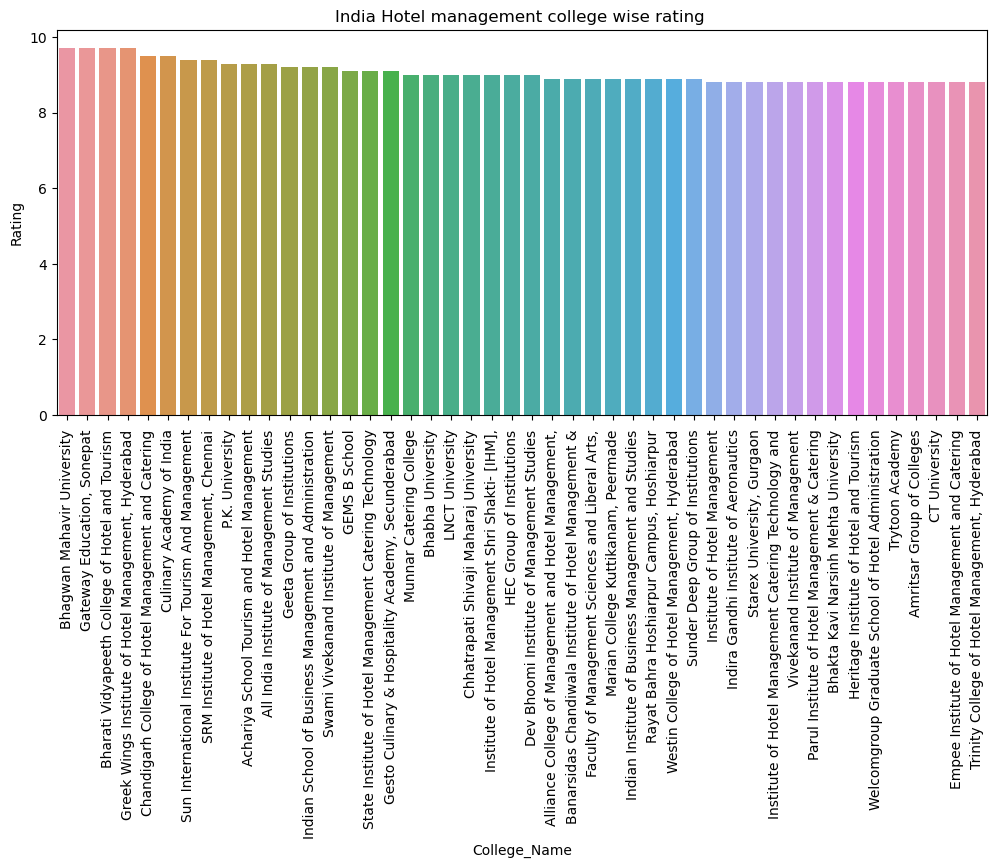

In [139]:
plt.figure(figsize=(12,5))
sns.barplot(data=(India_HM.nlargest(50,columns='Rating')),x='College_Name',y='Rating')
plt.title("India Hotel management college wise rating ")
plt.xticks(rotation=90)
plt.show()

In [140]:
India_agri = data.query("Stream=='Agriculture'").drop(columns=['Stream'])
India_agri

,College_Name,State,UG_fee,PG_fee,Rating,Academic,Accommodation,Faculty,Infrastructure,Placement,Social_Life,Average
12,Jawaharlal Nehru Rajkeeya Mahavidyalaya,Andaman,939.0,NaN,6.6,8.5,5.0,7.0,7.5,2.5,9.0,6.583333
15,Dantuluri Narayana Raju college,Andhra pradesh,NaN,NaN,8.5,8.5,8.3,8.7,9.2,6.7,9.3,8.450000
21,"Jawahar Bharati Degree & P.G College, Nellore",Andhra pradesh,NaN,NaN,8.8,9.5,9.0,NaN,NaN,NaN,NaN,NaN
22,"Besant Theosophical College, Madanapalle",Andhra pradesh,NaN,NaN,8.3,8.5,8.5,8.5,8.0,8.0,8.5,8.333333
24,"Andhra University, College of Science & Techno...",Andhra pradesh,NaN,NaN,8.0,8.6,6.4,8.8,8.3,7.1,8.7,7.983333
...,...,...,...,...,...,...,...,...,...,...,...,...
6735,West Bengal State University,West bengal,19000.0,NaN,7.9,8.0,7.5,8.6,7.9,7.6,8.0,7.933333
6736,Visva Bharati University,West bengal,10190.0,12130.0,7.6,8.4,7.0,8.4,7.7,5.8,8.4,7.616667
6737,"Vidyasagar University, Midnapore",West bengal,43185.0,NaN,7.0,7.9,6.8,6.9,8.0,5.5,7.0,7.016667
6738,"University of North Bengal, Darjeeling",West bengal,9315.0,44040.0,7.9,8.7,7.8,8.1,8.1,6.9,7.9,7.916667


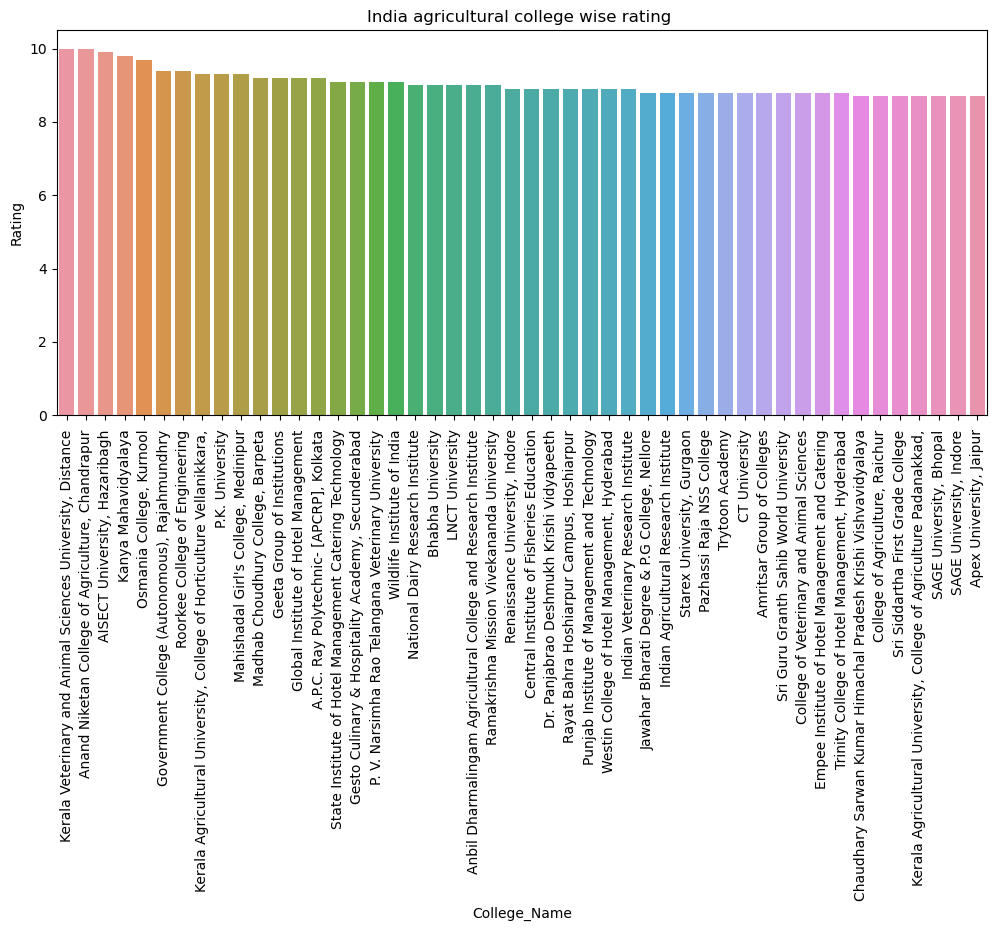

In [141]:
plt.figure(figsize=(12,5))
sns.barplot(data=(India_agri.nlargest(50,columns='Rating')),x='College_Name',y='Rating')
plt.title("India agricultural college wise rating ")
plt.xticks(rotation=90)
plt.show()

In [142]:
India_med = data.query("Stream=='Medical'").drop(columns=['Stream'])
India_med

,College_Name,State,UG_fee,PG_fee,Rating,Academic,Accommodation,Faculty,Infrastructure,Placement,Social_Life,Average
13,Andaman & Nicobar Islands Institute of Medical...,Andaman,91050.0,NaN,8.3,8.6,8.4,8.4,8.3,8.2,8.1,8.333333
16,Dr. Pinnamaneni Siddhartha Institute of Medica...,Andhra pradesh,140000.0,1790500.0,6.3,7.0,6.0,6.0,7.0,6.0,6.0,6.333333
17,"Guntur Medical College, Guntur",Andhra pradesh,NaN,NaN,8.0,8.3,7.4,8.3,7.3,8.5,8.0,7.966667
18,PES Institute of Medical Sciences and Research,Andhra pradesh,46550.0,432000.0,7.9,8.3,6.5,8.4,8.4,7.6,8.3,7.916667
19,Alluri Sitarama Raju Academy of Medical Sciences,Andhra pradesh,760725.0,2668050.0,9.1,9.3,8.7,9.3,9.3,9.0,9.0,9.100000
...,...,...,...,...,...,...,...,...,...,...,...,...
6721,The West Bengal National University of Juridical,West bengal,NaN,NaN,8.5,8.6,8.2,8.7,6.8,9.2,9.4,8.483333
6722,Indian Institute of Technology,West bengal,27500.0,NaN,8.5,8.8,7.2,8.2,8.9,8.8,9.0,8.483333
6723,R. G. Kar Medical College and Hospital,West bengal,12000.0,15250.0,8.6,8.8,7.4,9.0,8.5,9.4,8.7,8.633333
6724,Institute of Post Graduate Medical Education And,West bengal,15000.0,20050.0,8.0,8.7,7.4,7.9,8.3,8.5,7.2,8.000000


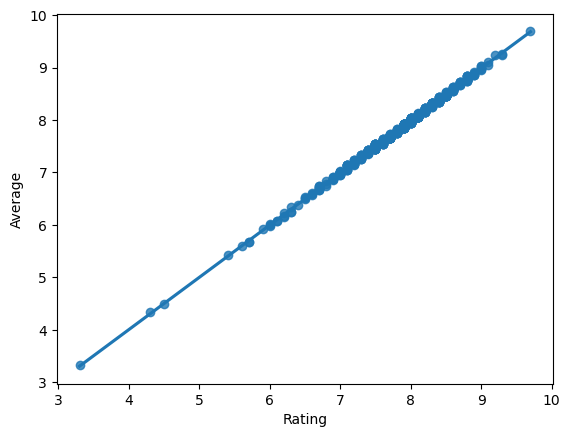

In [143]:
 sns.regplot(data =India_med, x = 'Rating', y= 'Average')
plt.show()


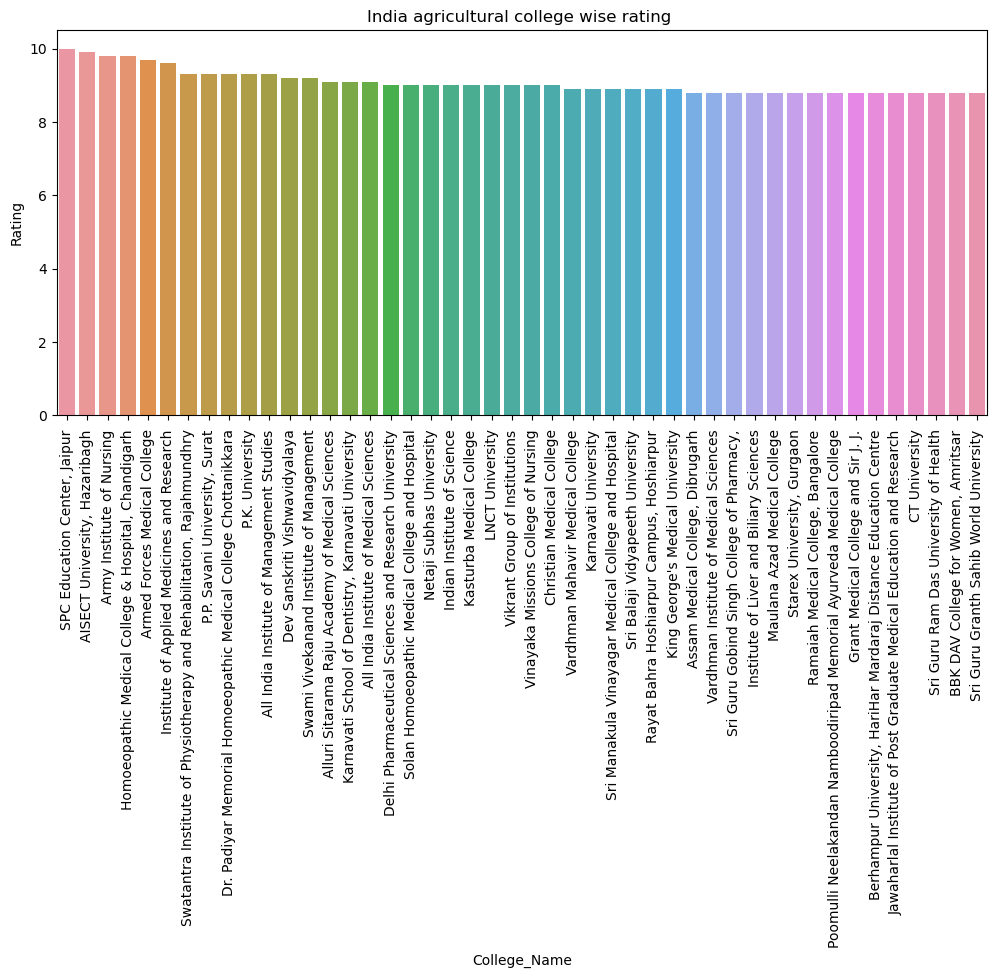

In [144]:
plt.figure(figsize=(12,5))
sns.barplot(data=(India_med.nlargest(50,columns='Rating')),x='College_Name',y='Rating')
plt.title("India agricultural college wise rating ")
plt.xticks(rotation=90)
plt.show()

In [145]:
India_law = data.query("Stream=='Law'").drop(columns=['Stream'])
India_law

,College_Name,State,UG_fee,PG_fee,Rating,Academic,Accommodation,Faculty,Infrastructure,Placement,Social_Life,Average
90,"Andhra University, Dr. B. R. Ambedkar College",Andhra pradesh,192065.0,322720.0,8.5,9.5,7.5,9.5,8.0,8.0,8.5,8.500000
91,Indira Priyadarshini Law College,Andhra pradesh,36000.0,NaN,8.3,8.5,8.5,8.0,8.5,8.0,8.0,8.250000
92,"Sri Venkateswara College of Law, Tirupati",Andhra pradesh,32000.0,18000.0,8.3,NaN,NaN,8.8,NaN,8.0,8.0,NaN
129,K L University,Andhra pradesh,145000.0,155000.0,8.3,8.5,7.6,8.3,8.8,8.3,8.2,8.283333
132,Sri Padmavati Mahila Visvavidyalayam,Andhra pradesh,142000.0,6000.0,7.6,8.3,7.4,7.8,7.5,6.2,8.1,7.550000
...,...,...,...,...,...,...,...,...,...,...,...,...
6550,"Adamas University, Kolkata",West bengal,159100.0,171100.0,8.2,8.3,7.5,8.5,9.0,7.8,7.8,8.150000
6551,"Midnapore Law College, Midnapore",West bengal,60000.0,NaN,7.8,8.3,6.8,8.8,8.0,7.3,7.8,7.833333
6552,"Amity University, Kolkata",West bengal,211000.0,100000.0,8.2,8.1,7.7,8.4,8.8,7.4,8.5,8.150000
6553,Bimal Chandra College of Law,West bengal,37500.0,NaN,7.2,8.0,7.0,8.0,7.0,6.0,7.0,7.166667


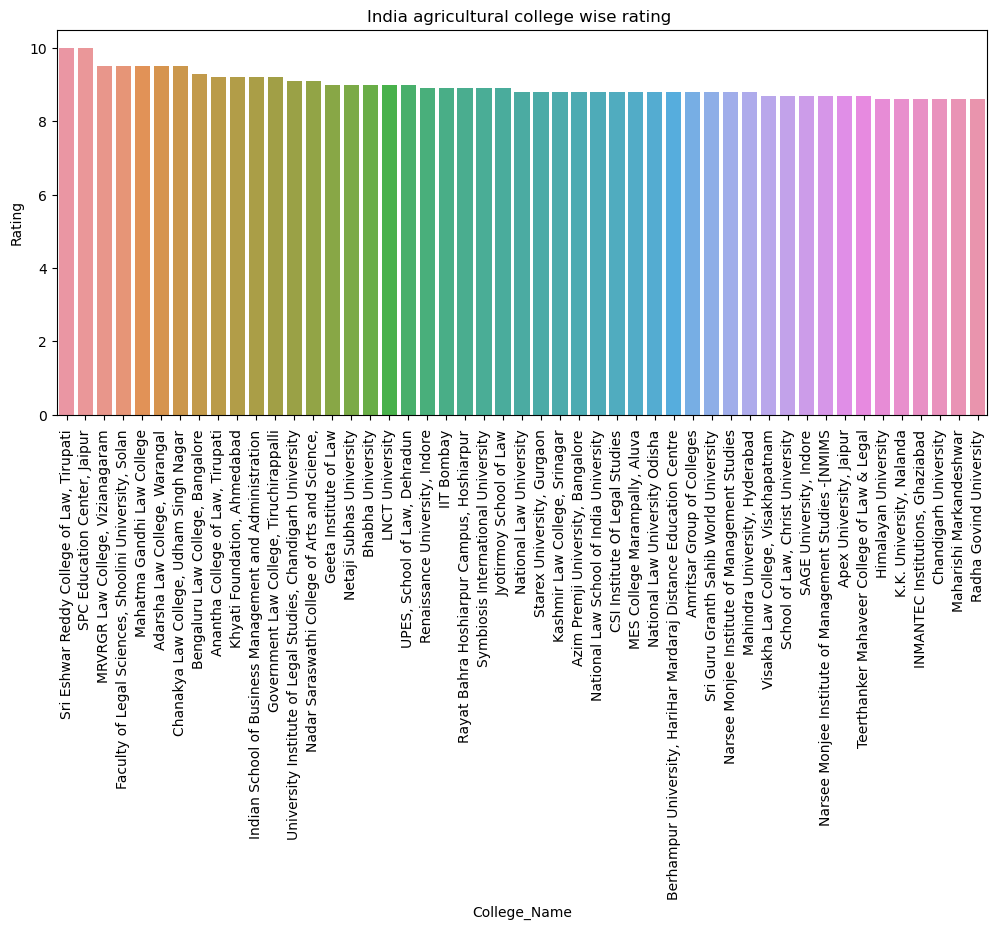

In [146]:
plt.figure(figsize=(12,5))
sns.barplot(data=(India_law.nlargest(50,columns='Rating')),x='College_Name',y='Rating')
plt.title("India agricultural college wise rating ")
plt.xticks(rotation=90)
plt.show()

In [147]:
India_phar = data.query("Stream=='Pharmacy'").drop(columns=['Stream'])
India_phar

,College_Name,State,UG_fee,PG_fee,Rating,Academic,Accommodation,Faculty,Infrastructure,Placement,Social_Life,Average
180,"Andhra University, College of Pharmaceutical S...",Andhra pradesh,329988.0,315483.0,8.0,8.8,7.4,7.3,9.0,7.5,8.0,8.000000
181,Chalapathi Institute of Pharmaceutical Science...,Andhra pradesh,36100.0,67800.0,8.1,8.7,8.0,8.3,8.8,7.9,7.1,8.133333
182,Acharya Nagarjuna University,Andhra pradesh,11750.0,93230.0,7.3,7.7,7.0,7.2,8.0,5.7,8.2,7.300000
183,Sri Padmavati Mahila Visvavidyalayam,Andhra pradesh,11450.0,15000.0,7.6,8.3,7.4,7.8,7.5,6.2,8.1,7.550000
184,Sri Venkateswara College of Pharmacy,Andhra pradesh,56300.0,117500.0,5.9,7.0,4.5,7.7,6.0,3.7,6.7,5.933333
...,...,...,...,...,...,...,...,...,...,...,...,...
6575,Jadavpur University,West bengal,2400.0,200000.0,8.4,9.0,7.6,8.5,8.1,8.4,9.0,8.433333
6576,The Neotia University,West bengal,80000.0,166000.0,8.2,8.7,7.5,8.5,8.2,7.8,8.6,8.216667
6577,Guru Nanak Institute of Pharmaceutical Science...,West bengal,478000.0,305700.0,9.0,9.2,8.6,9.0,9.1,8.8,9.0,8.950000
6578,Nexxus Healthcare Innovation,West bengal,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


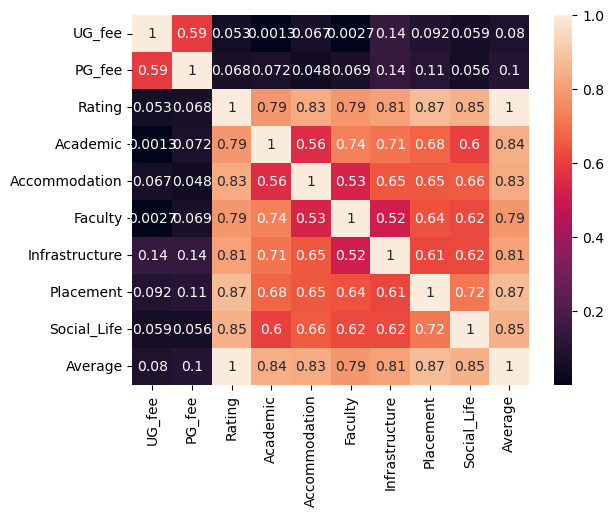

In [148]:
sns.heatmap(India_phar.corr(), annot=True)
plt.show()


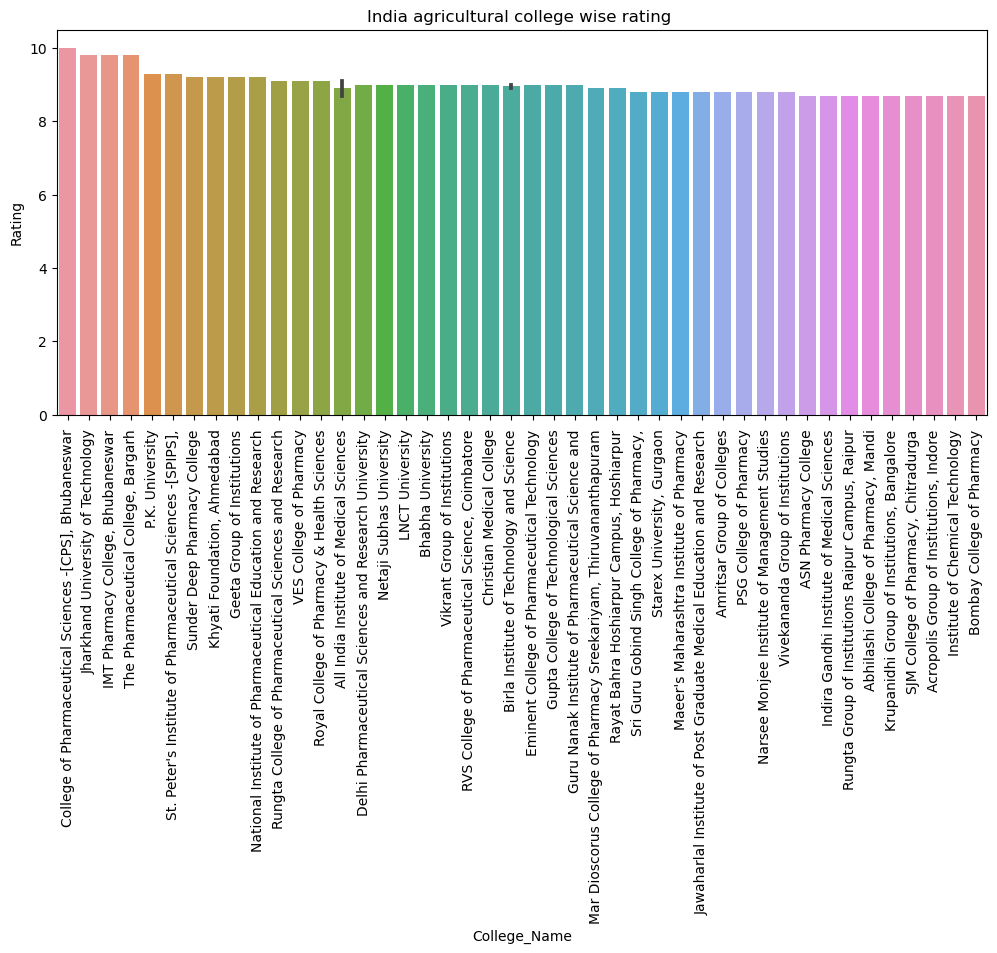

In [149]:
plt.figure(figsize=(12,5))
sns.barplot(data=(India_phar.nlargest(50,columns='Rating')),x='College_Name',y='Rating')
plt.title("India agricultural college wise rating ")
plt.xticks(rotation=90)
plt.show()